# add bench to valid 3 (really, putting it together)

In [1]:
from scprint2 import scPRINT2
from scdataloader import Preprocessor
from scprint.tasks import GNInfer

from bengrn import BenGRN, get_sroy_gt
import scanpy as sc
from grnndata import GRNAnnData, read_h5ad, from_anndata


import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.model_selection import train_test_split

from bengrn.base import train_classifier

from anndata.utils import make_index_unique
from bengrn import compute_genie3
from grnndata import utils as grnutils

%load_ext autoreload
%autoreload 2 

import torch
torch.set_float32_matmul_precision('medium')

💡 connected lamindb: jkobject/scprint


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
2024-05-08 15:37:56,977:INFO - Downloading data from `https://omnipathdb.org/queries/enzsub?format=json`
2024-05-08 15:37:57,105:INFO - Downloading data from `https://omnipathdb.org/queries/interactions?format=json`
2024-05-08 15:37:57,202:INFO - Downloading data from `https://omnipathdb.org/queries/complexes?format=json`
2024-05-08 15:37:57,296:INFO - Downloading data from `https://omnipathdb.org/queries/annotations?format=json`
2024-05-08 15:37:57,392:INFO - Downloading data from `https://omnipathdb.org/queries/intercell?format=json`
2024-05-08 15:37:57,604:INFO - Downloading data from `https://omnipathdb.org/about?format=text`
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/arboreto/core.py:12: DeprecationWarning: The current Dask DataFrame implementation is deprecated. 
In a future release, Dask D

In [2]:
#model = scPrint.load_from_checkpoint('../../data/tensorboard/scprint_test/urxxwu28/checkpoints/epoch=0-step=20000.ckpt') #chocolate-surf-8
model = scPrint.load_from_checkpoint('../../data/temp/wli32e2j/last.ckpt', precpt_gene_emb = None)#'../../data/main/gene_embeddings.parquet')
# ../../data/temp/epoch=4-step=12500.ckpt latest model maestro (fortuitous laugther)
# ../../data/logs/scprint_test/f4vao230/checkpoints/epoch=10-step=27500.ckpt looked good as a training run (vermlillion noodle)
# d1792z9k/epoch=3-step=10000.ckpt
# '../../data/temp/d1792z9k/epoch=3-step=10000.ckpt'
# '../../data/temp/6q3dzi3x/epoch=3-step=10000.ckpt'
# '../../data/temp/grsachbg/epoch=2-step=15000.ckpt'
# ../../data/temp/za9mg1w3/epoch=7-step=40000.ckpt
## post debug
# "../lightning_logs/version_14/checkpoints/epoch=1-step=5000.ckpt"

In [3]:
adata = sc.read_h5ad('/home/ml4ig1/scprint/.lamindb/yBCKp6HmXuHa0cZptMo7.h5ad') 

In [4]:
adata.var["isTF"]=False
adata.var.loc[adata.var.symbol.isin(grnutils.TF), "isTF"]=True

In [5]:
import signal
import time

class TimeoutException(Exception): pass

def timeout_handler(signum, frame):
    raise TimeoutException()

/tmp/ipykernel_198330/2234600996.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


blood vessel smooth muscle cell
scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment


2024-05-02 16:08:31,954:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 16:08:31,965:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 16:08:32,186:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  28.571428571428573 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



 98%|█████████▊| 97/99 [00:27<00:00,  3.62it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:28<00:00,  3.47it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0010002948422905907
EPR: 1.565287831517589


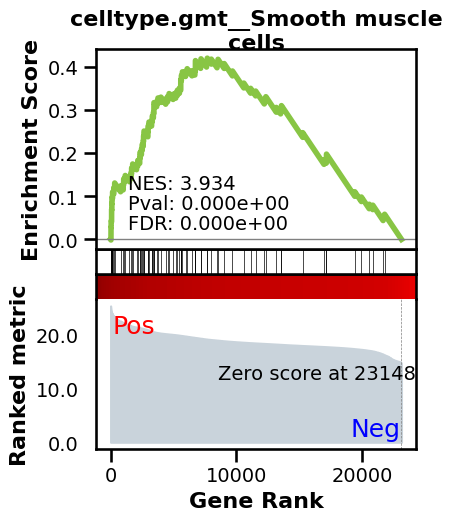

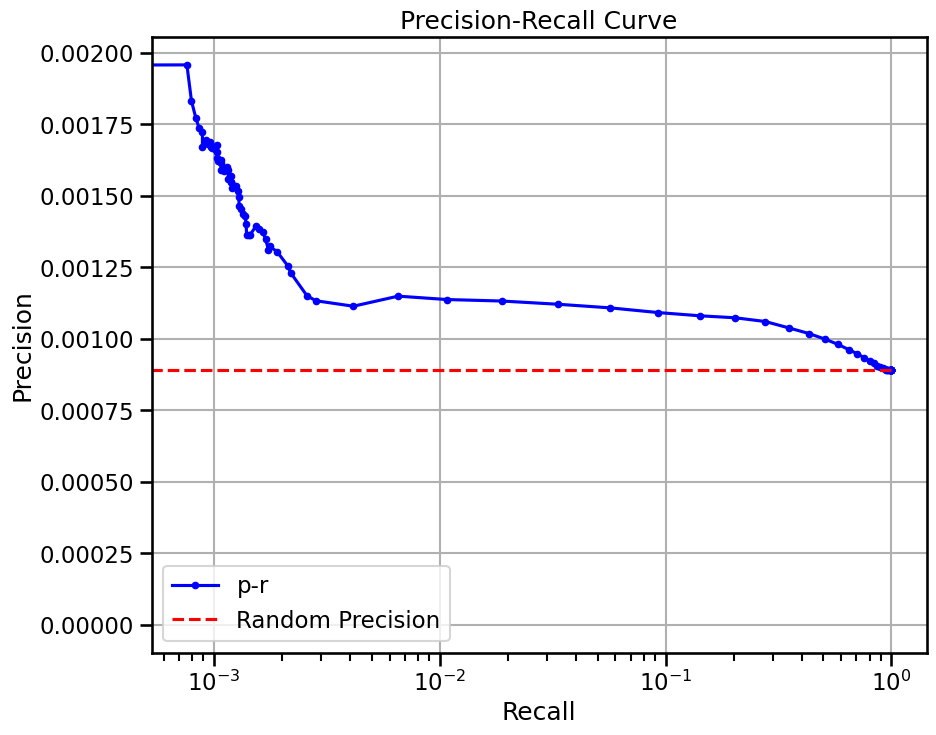

{'enriched_terms_Targets': ['celltype.gmt__Smooth muscle cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Hepatocytes', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Enteric neurons', 'celltype.gmt__Pericytes', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Pancreatic stellate cells', 'celltype.gmt__Podocytes', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Adipose progenitor cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Melanocytes', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Endometrium', 'celltype.gmt__Extracellular matrix cells', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Adipocytes', 'celltype.gmt__Foveolar cells'], 'significant_enriched_TFtargets': 28.571428571428573, 'precision': 0.0008896322223674437, 'recall': 1.0, 'rand_precision': 0.0008897036558203398, 'auprc': 0.0010002948422905907, 'EPR': 1.565287831517589}
genie3 TF only

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",
[rank: 0] Received SIGTERM: 15


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-02 16:15:16,078:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 16:15:16,089:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 16:15:16,287:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 9283 genes
intersection pct: 0.6945753834642724
precision:  0.007001833787591006 
recall:  0.28466699249122496 
random precision: 0.0010448349410779154


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)

 48%|████▊     | 48/99 [00:08<00:08,  5.91it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:16<00:00,  5.90it/s]


Area Under Precision-Recall Curve (AUPRC):  0.004761963024941619
EPR: 6.472817377464366


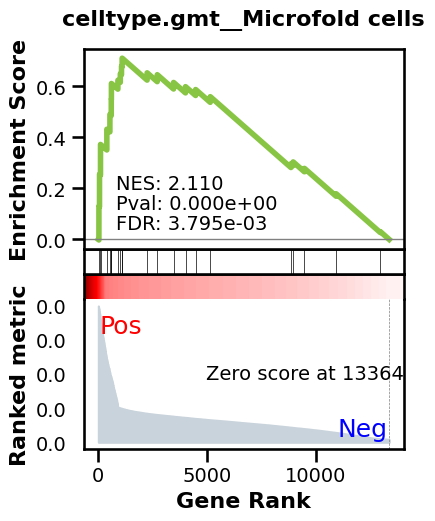

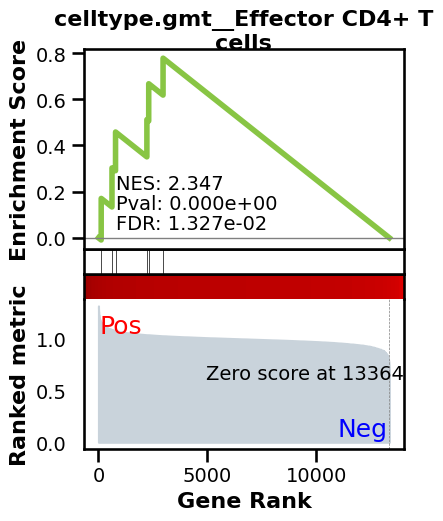

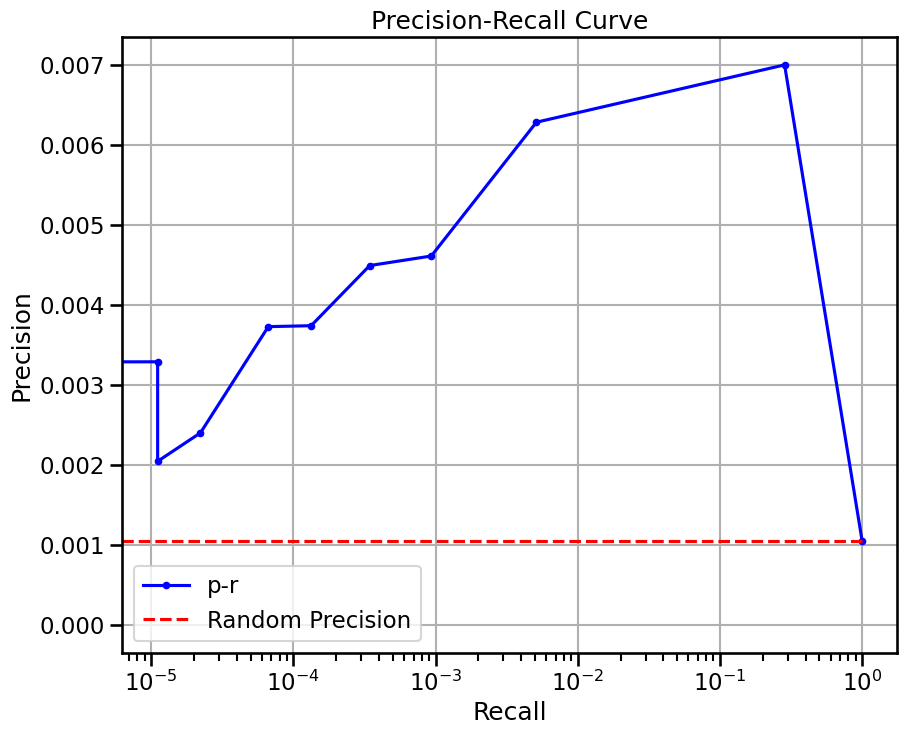

{'enriched_terms_Central': ['celltype.gmt__Microfold cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Melanocytes', 'celltype.gmt__Satellite cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Renal Vesicle cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Endometrium', 'celltype.gmt__Kupffer cells', 'celltype.gmt__Horizontal cells', 'celltype.gmt__Glycinergic amacrine cells', 'celltype.gmt__Gamma (PP) cells', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Ionocytes', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Myoepithelial cells'], 'enriched_terms_Regulators': ['celltype.gmt__Effector CD4+ T cells', 'celltype.gmt__Naive CD4+ T cells', '

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",
[rank: 0] Received SIGTERM: 15
[rank: 0] Received SIGTERM: 15
[rank: 0] Received SIGTERM: 15
[rank: 0] Received SIGTERM: 15
[rank: 0] Received SIGTERM: 15
[rank: 0] Received SIGTERM: 15
[rank: 0] Received SIGTERM: 15
[rank: 0] Received SIGTERM: 15


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-02 16:21:57,624:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 16:21:57,626:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 16:21:57,817:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  1.9801980198019802 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 9283 genes
intersection pct: 0.6945753834642724
precision:  0.0015729876612230929 
recall:  0.1233838361398676 
random precision: 0.0010448349410779154


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)

 49%|████▉     | 49/99 [00:08<00:09,  5.54it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:17<00:00,  5.53it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0013161472321679148
EPR: 0.9034540096069741


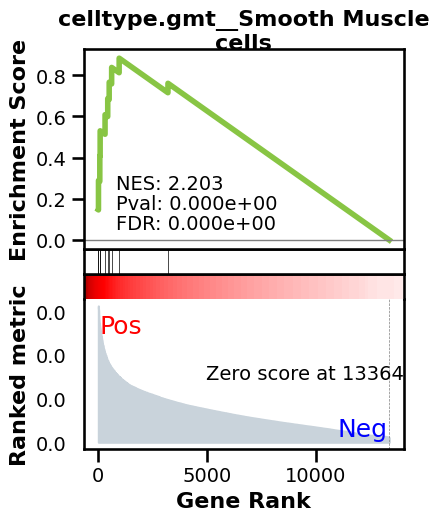

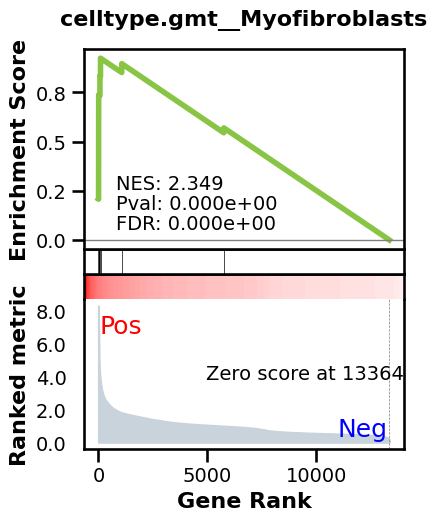

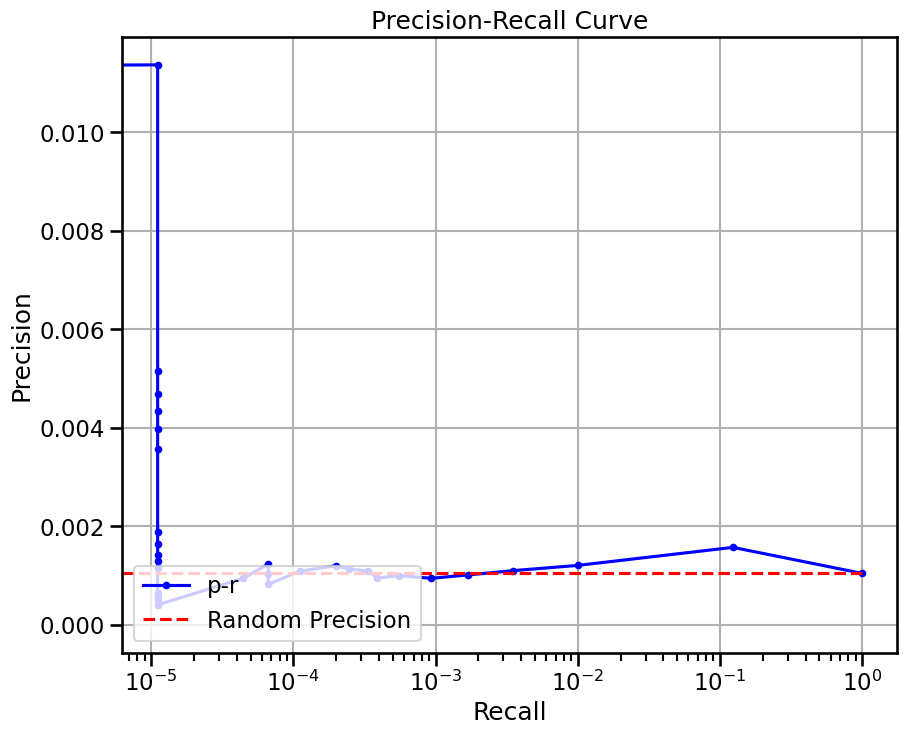

{'enriched_terms_Central': ['celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Pancreatic progenitor cells', 'celltype.gmt__Immune cells', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Leydig cells', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Endothelial cells', 'celltype.gmt__Glutamatergic neurons', 'celltype.gmt__Neural Progenitor cells', 'celltype.gmt__Pericytes', 'celltype.gmt__Rod bipolar cells', 'celltype.gmt__Granulocytes', 'c

/tmp/ipykernel_198330/2234600996.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:325: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 22876 ...
doing regression....
metrics {'used_heads': 58, 'precision': 0.012218403970981291, 'random_precision': 0.0016559257525531122, 'recall': 0.004123977060377601, 'predicted_true': 5238.0, 'number_of_true': 15519.0, 'epr': 5.127560157474166}


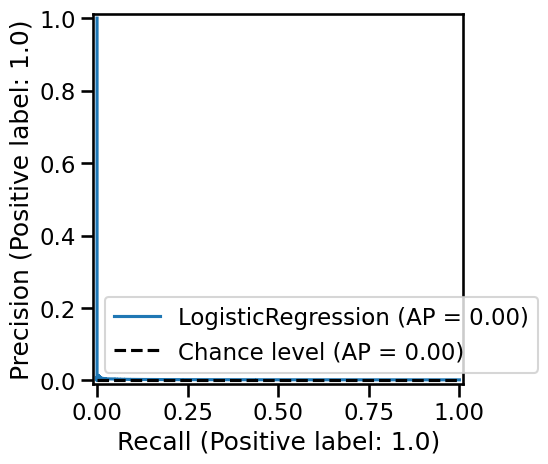

{'used_heads': 58, 'precision': 0.012218403970981291, 'random_precision': 0.0016559257525531122, 'recall': 0.004123977060377601, 'predicted_true': 5238.0, 'number_of_true': 15519.0, 'epr': 5.127560157474166}
base enrichment
Top central genes: []


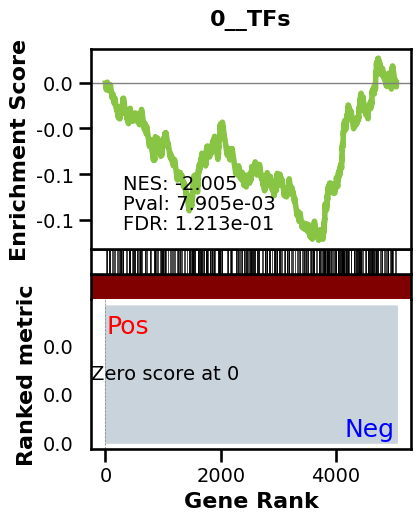

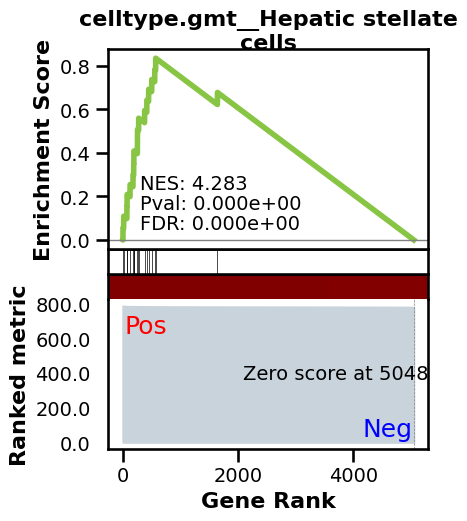

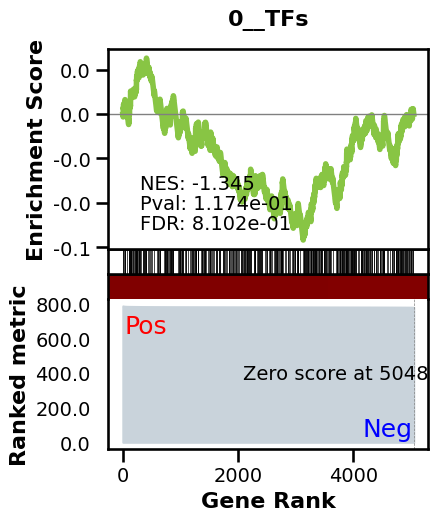

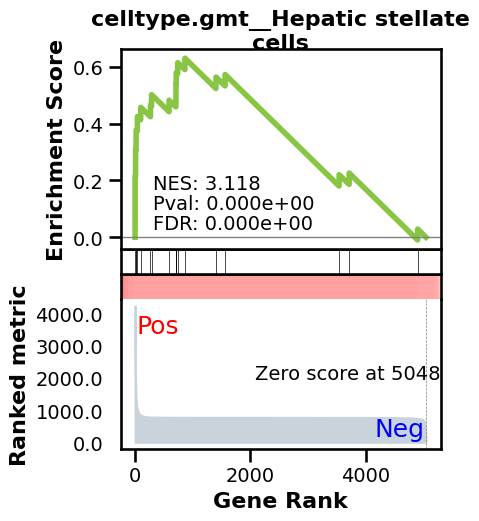

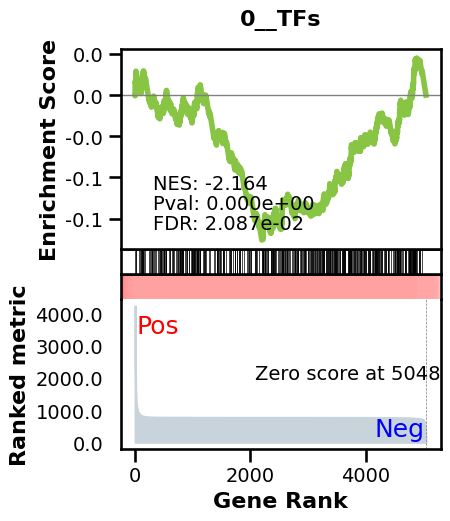

_________________________________________
TF specific enrichment


2024-05-02 16:42:54,207:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 16:42:54,210:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 16:42:54,438:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  18.0327868852459 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 3659 genes
intersection pct: 0.7246979599920776
precision:  0.0017086584902124477 
recall:  1.0 
random precision: 0.001709125592041374



 97%|█████████▋| 96/99 [00:02<00:00, 38.04it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:02<00:00, 37.17it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0031280337274854964
EPR: 5.214672641187189


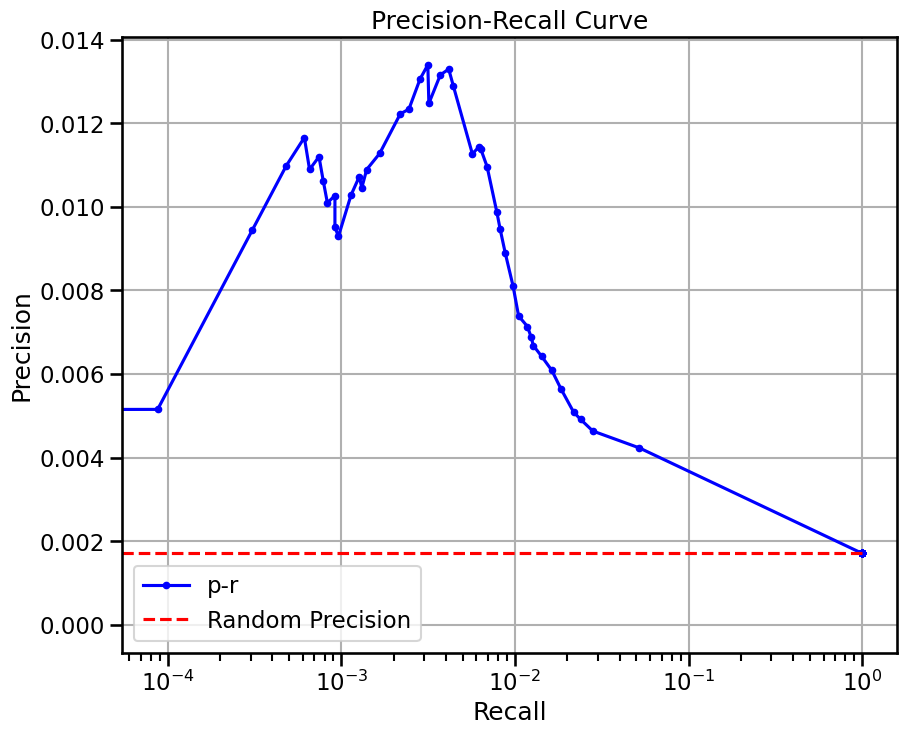

{'enriched_terms_Targets': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Pancreatic stellate cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Lymphatic Endothelial cells', 'celltype.gmt__Hepatocytes', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Classical Monocytes', 'celltype.gmt__Endothelial cells', 'celltype.gmt__Pericytes', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Myoblasts', 'celltype.gmt__Non-classical monocytes', 'celltype.gmt__Ductal cells', 'celltype.gmt__Epsilon cells', 'celltype.gmt__Melanocytes', 'celltype.gmt__Stromal cells', 'celltype.gmt__Endothelial', 'celltype.gmt__Leydig cells', 'celltype.gmt__Intermediate monocytes', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Immune cells', 'celltype.gmt__Odontob

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


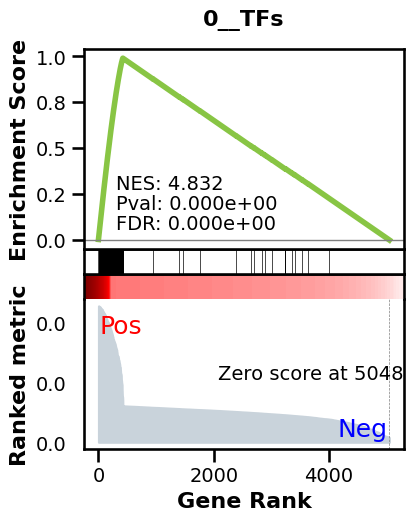

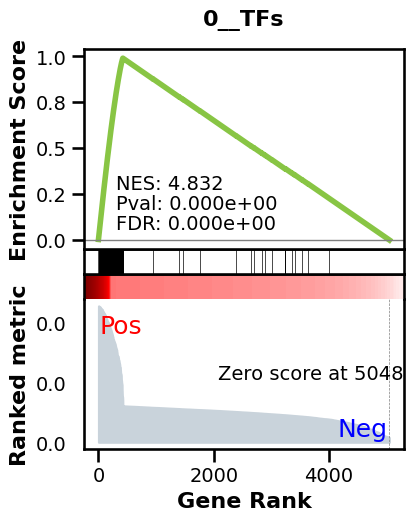

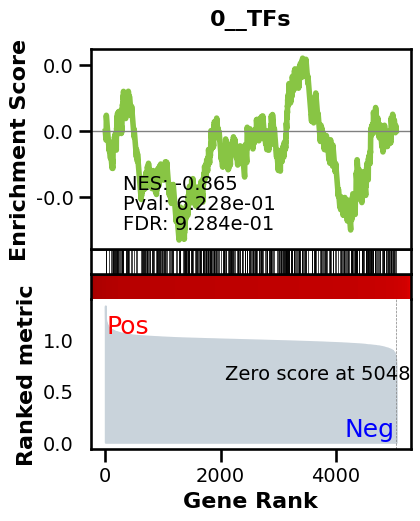

_________________________________________
TF specific enrichment


2024-05-02 16:44:42,440:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 16:44:42,442:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 16:44:42,631:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  1.639344262295082 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 3659 genes
intersection pct: 0.7246979599920776
precision:  0.009286947196204985 
recall:  0.41488896660255287 
random precision: 0.001709125592041374


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)

 48%|████▊     | 48/99 [00:01<00:01, 34.40it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:02<00:00, 34.28it/s]


Area Under Precision-Recall Curve (AUPRC):  0.007697824236668304
EPR: 7.449073644732775


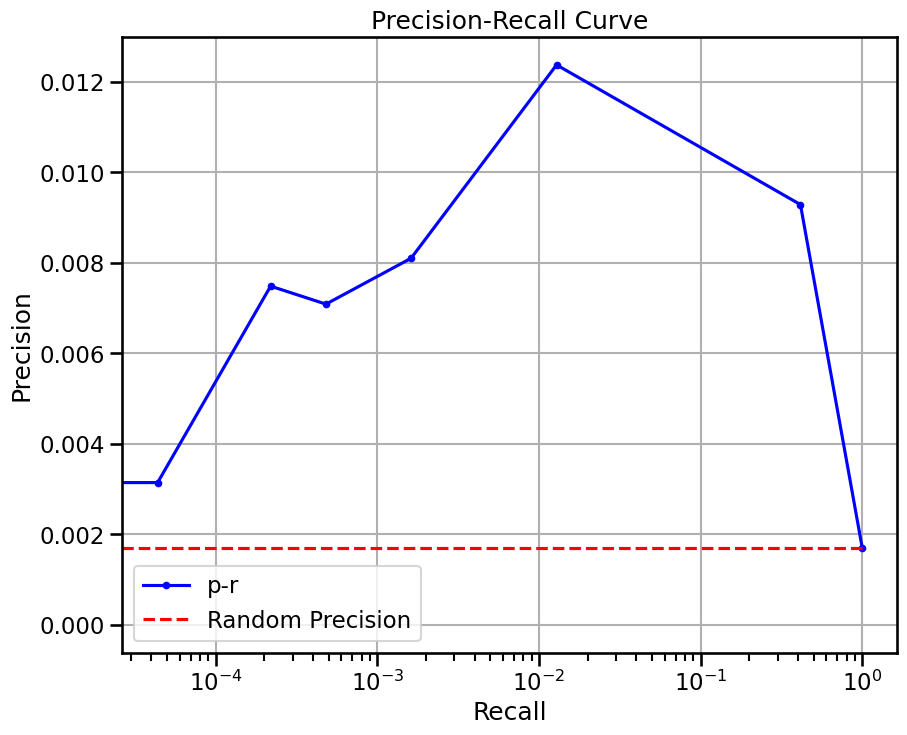

{'enriched_terms_Central': ['0__TFs', 'celltype.gmt__Microfold cells', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Satellite cells', 'celltype.gmt__Glycinergic amacrine cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Gamma (PP) cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Hepatic stellate cells'], 'significant_enriched_TFtargets': 1.639344262295082, 'precision': 0.009286947196204985, 'recall': 0.41488896660255287, 'rand_precision': 0.001709125592041374, 'auprc': 0.007697824236668304, 'EPR': 7.449073644732775}
genie3

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 68.31 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",
[rank: 0] Received SIGTERM: 15
[rank: 0] Received SIGTERM: 15


base enrichment
Top central genes: []


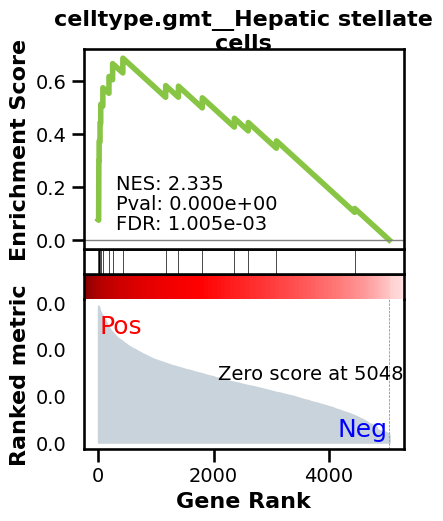

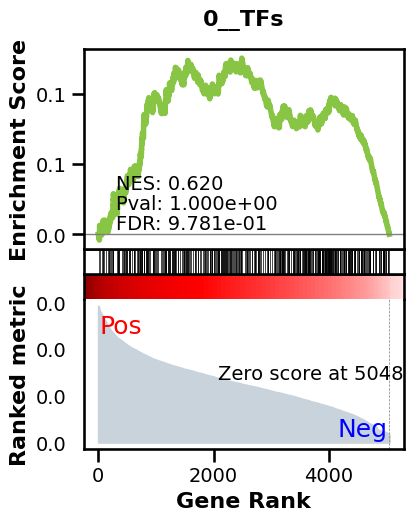

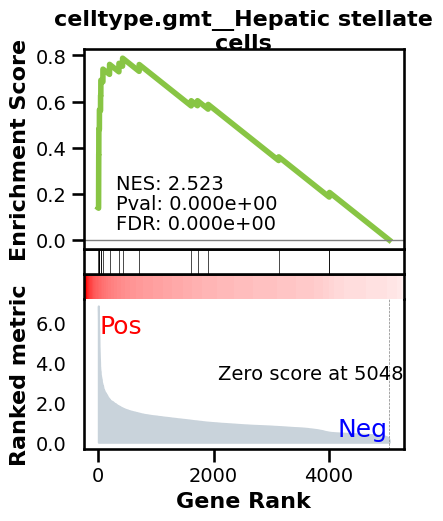

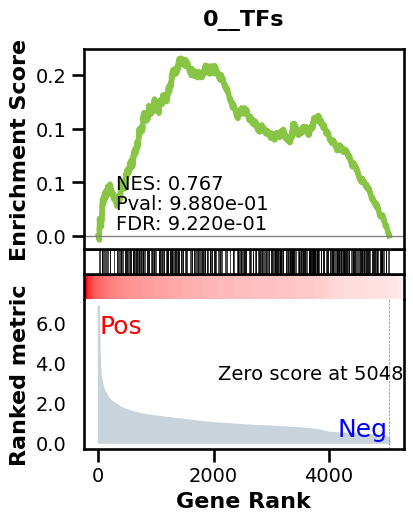

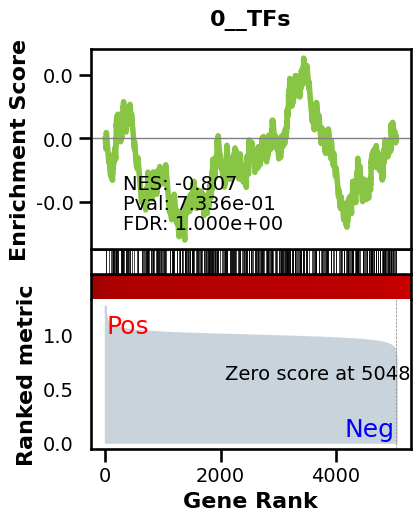

_________________________________________
TF specific enrichment


2024-05-02 16:46:57,537:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 16:46:57,539:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 16:46:57,741:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 3659 genes
intersection pct: 0.7246979599920776
precision:  0.0022316689248121566 
recall:  0.31933030250043715 
random precision: 0.001709125592041374


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)

 48%|████▊     | 48/99 [00:01<00:01, 36.64it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:02<00:00, 36.49it/s]


Area Under Precision-Recall Curve (AUPRC):  0.002015438015234214
EPR: 1.1772441644799234


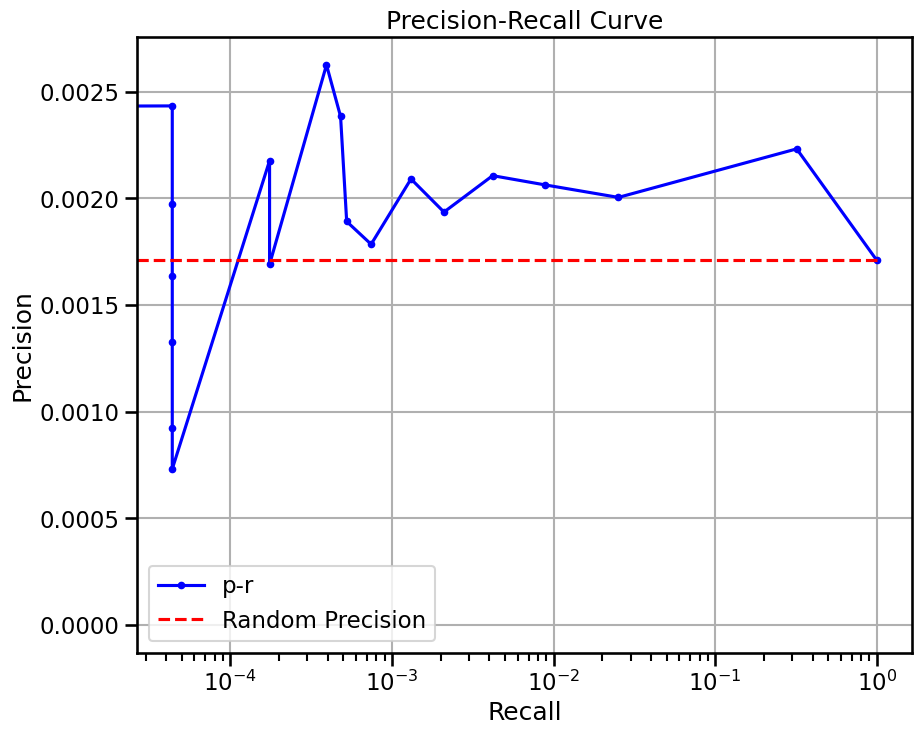

{'enriched_terms_Central': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Pericytes', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Adipocytes', 'celltype.gmt__Glycinergic amacrine cells', 'celltype.gmt__Leydig cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Pancreatic progenitor cells', 'celltype.gmt__Pro-B cells', 'celltype.gmt__Radial glial cells', 'celltype.gmt__Endometrium'], 'enriched_terms_Targets': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt

/tmp/ipykernel_198330/2234600996.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


mesangial cell
scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 168948004, sparsity: 1.0
base enrichment
too many genes for central computation


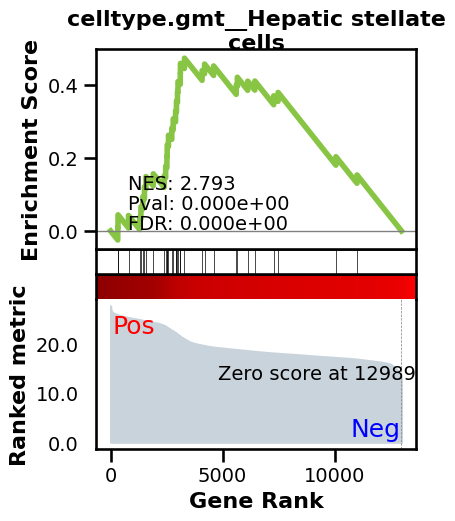

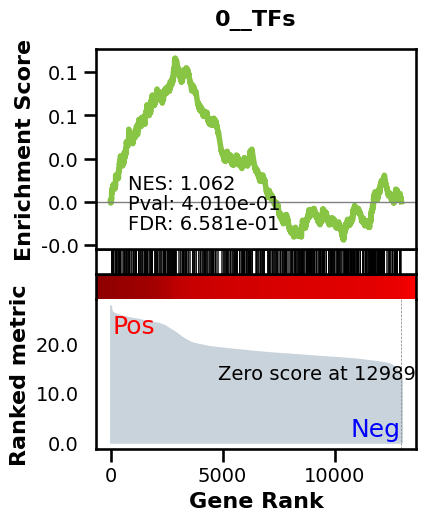

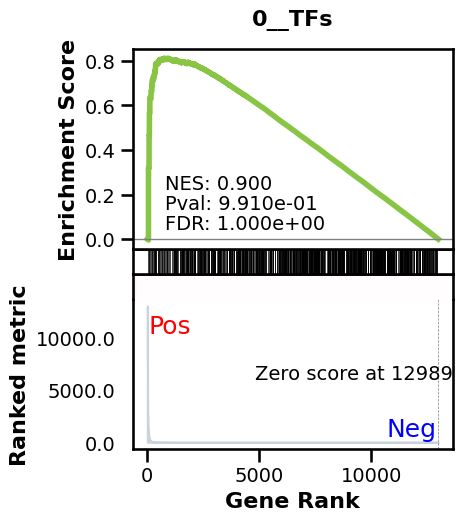

_________________________________________
TF specific enrichment


2024-05-02 16:48:37,605:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 16:48:37,607:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 16:48:37,841:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  6.097560975609756 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 7418 genes
intersection pct: 0.5710546574287914
precision:  0.0010208494330863672 
recall:  1.0 
random precision: 0.0010209870695206515



 97%|█████████▋| 96/99 [00:09<00:00, 10.29it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:09<00:00, 10.31it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0010900051104358742
EPR: 1.4485042260410377


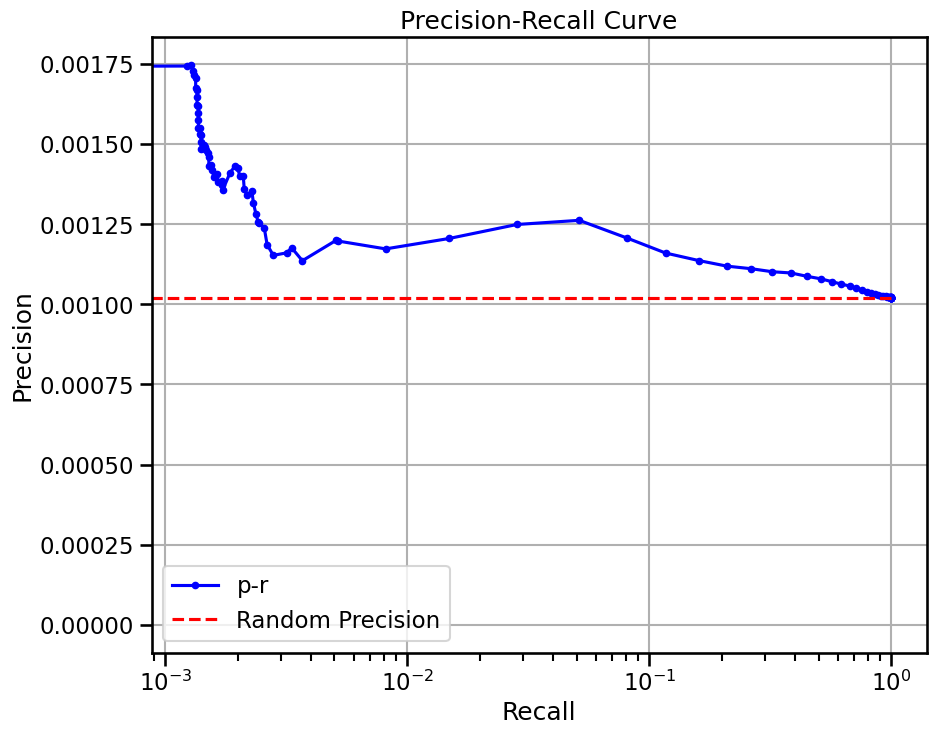

{'enriched_terms_Targets': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Adipose progenitor cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Podocytes', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Pancreatic stellate cells', 'celltype.gmt__Pulmonary alveolar type I cells', 'celltype.gmt__Endometrium', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Endothelial cells', 'celltype.gmt__Pericytes', 'celltype.gmt__Stromal cells', 'celltype.gmt__Ductal cells', 'celltype.gmt__Hepatocytes', 'celltype.gmt__Lymphatic Endothelial cells', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Immune cells', 'celltype.gmt__Endothelial'], 'significant_enriched_TFtargets': 6.097560975609756, 'precision': 0.0010208494330863672, 'recall': 1.0, 'r

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",
[rank: 0] Received SIGTERM: 15
[rank: 0] Received SIGTERM: 15


base enrichment
Top central genes: []


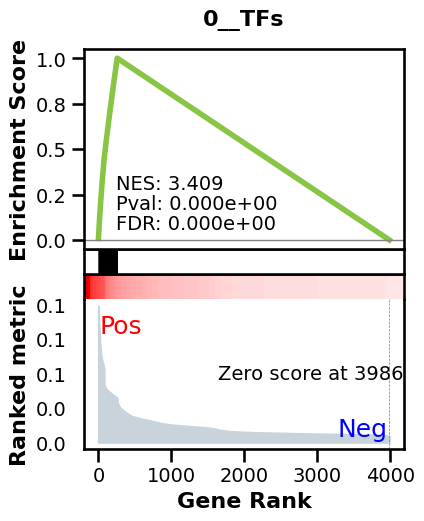

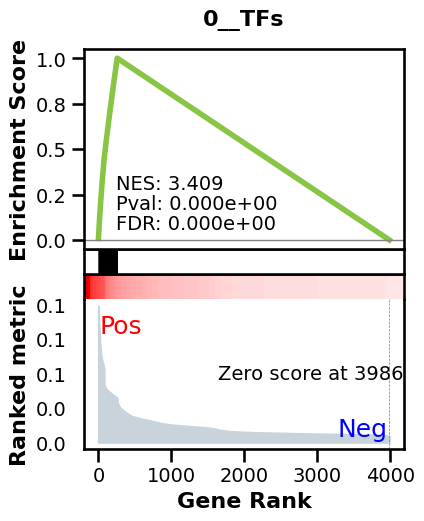

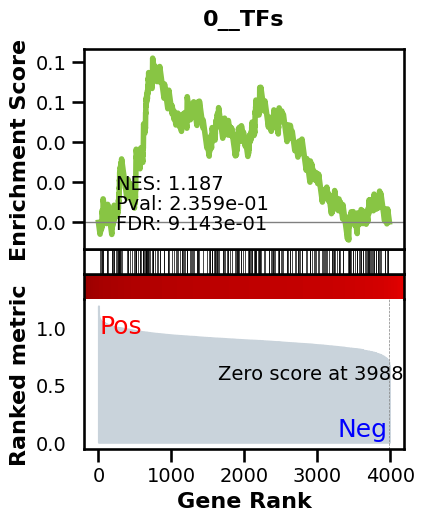

_________________________________________
TF specific enrichment


2024-05-02 16:50:35,918:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 16:50:35,920:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 16:50:36,116:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  6.976744186046512 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2885 genes
intersection pct: 0.7232389069942341
precision:  0.010398222752743791 
recall:  0.15135135135135136 
random precision: 0.0012451414245090945


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)

 47%|████▋     | 47/99 [00:00<00:00, 58.40it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:01<00:00, 57.72it/s]


Area Under Precision-Recall Curve (AUPRC):  0.006440386566104949
EPR: 7.162226562191433


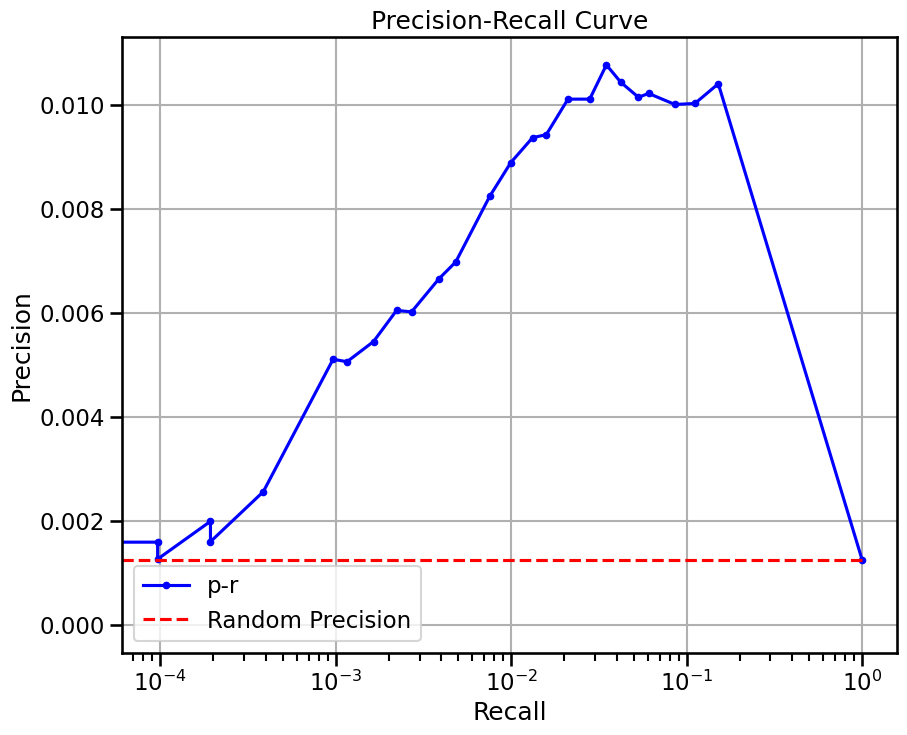

{'enriched_terms_Central': ['0__TFs', 'celltype.gmt__Mesangial cells'], 'significant_enriched_TFtargets': 6.976744186046512, 'precision': 0.010398222752743791, 'recall': 0.15135135135135136, 'rand_precision': 0.0012451414245090945, 'auprc': 0.006440386566104949, 'EPR': 7.162226562191433}
genie3

View of AnnData object with n_obs × n_vars = 10 × 12990
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts'

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


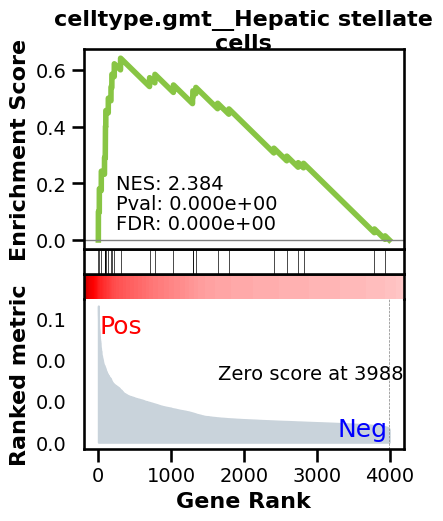

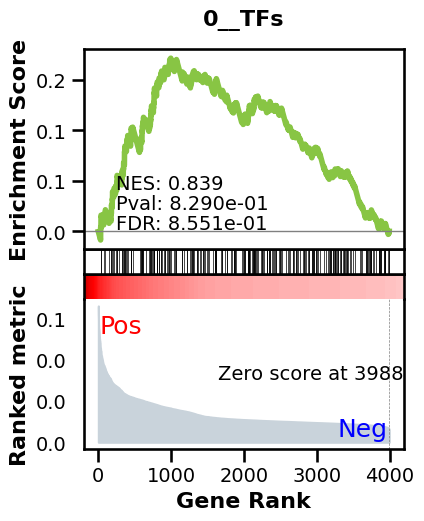

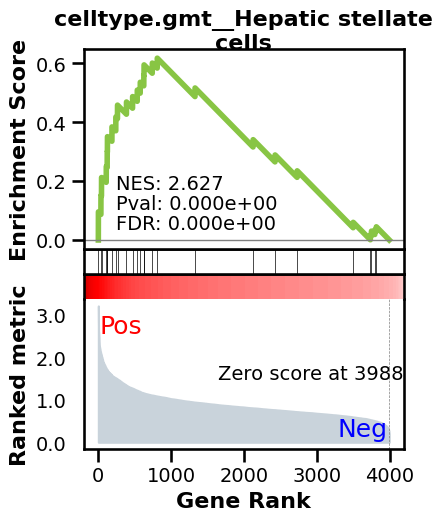

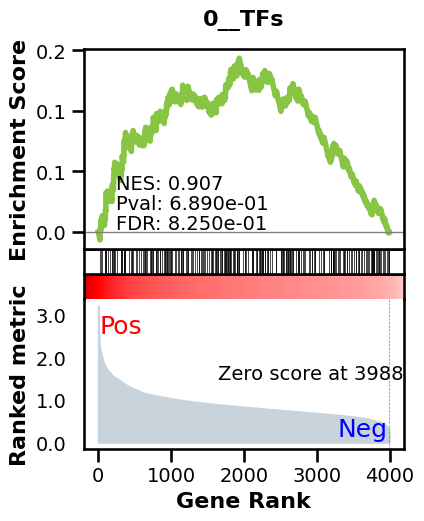

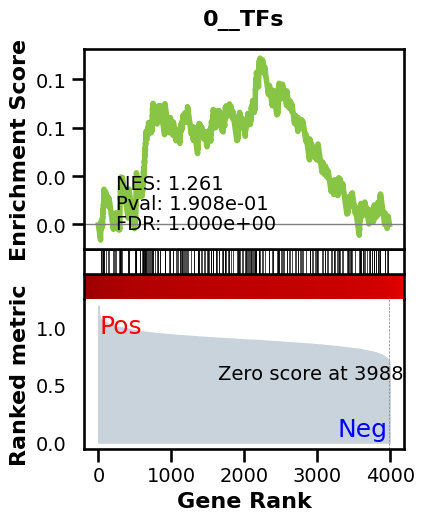

_________________________________________
TF specific enrichment


2024-05-02 16:51:34,476:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 16:51:34,478:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 16:51:34,675:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  2.3255813953488373 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2885 genes
intersection pct: 0.7232389069942341
precision:  0.0017635906706053525 
recall:  0.03088803088803089 
random precision: 0.0012451414245090945


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start

 44%|████▍     | 44/99 [00:00<00:00, 63.28it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:01<00:00, 59.62it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0015046334948403423
EPR: 1.0077976537526585


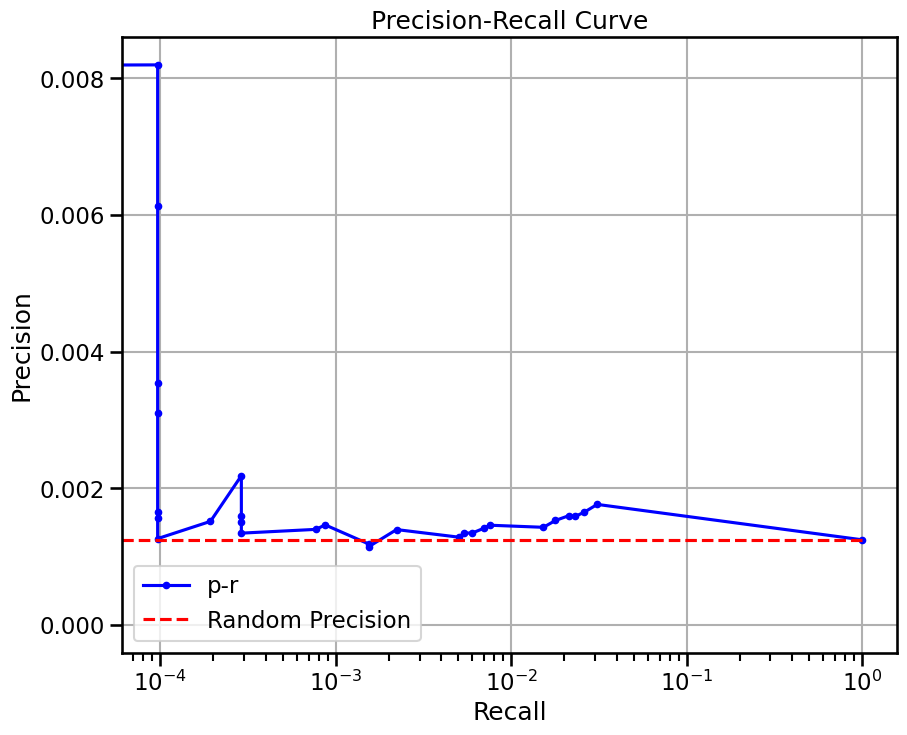

{'enriched_terms_Central': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Podocytes', 'celltype.gmt__Renal interstitium (Mesenchymal cells)'], 'enriched_terms_Targets': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Podocytes', 'celltype.gmt__Connecting tubule cells'], 'significant_enriched_TFtargets': 2.3255813953488373, 'precision': 0.0017635906706053525, 'recall': 0.03088803088803089, 'rand_precision': 0.0012451414245090945, 'auprc': 0.0015046334948403423, 'EPR': 1.0077976537526585}
______________________________
now with classifier


/tmp/ipykernel_198330/2234600996.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:325: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 8758 ...
doing regression....
metrics {'used_heads': 50, 'precision': 0.010648596321393998, 'random_precision': 0.0013416017527068612, 'recall': 0.003273809523809524, 'predicted_true': 2066.0, 'number_of_true': 6720.0, 'epr': 6.413852585153261}


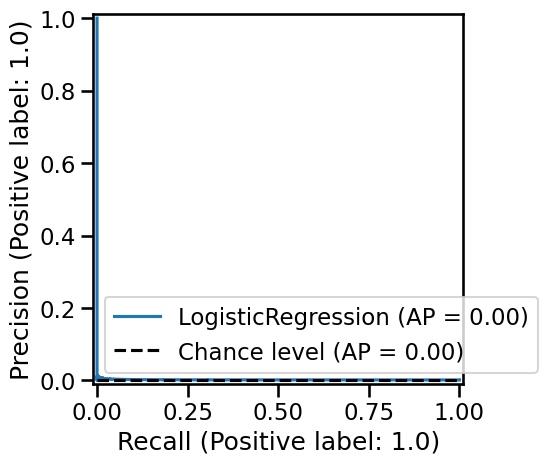

{'used_heads': 50, 'precision': 0.010648596321393998, 'random_precision': 0.0013416017527068612, 'recall': 0.003273809523809524, 'predicted_true': 2066.0, 'number_of_true': 6720.0, 'epr': 6.413852585153261}
base enrichment
Top central genes: []


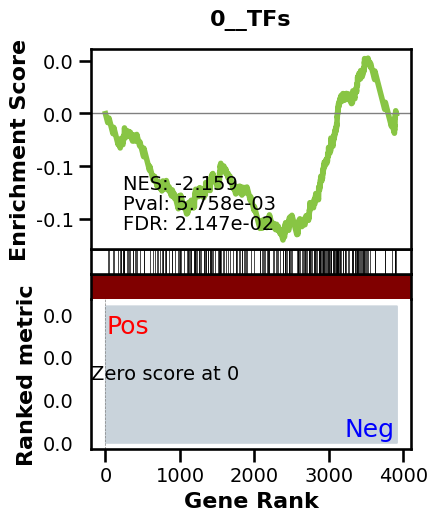

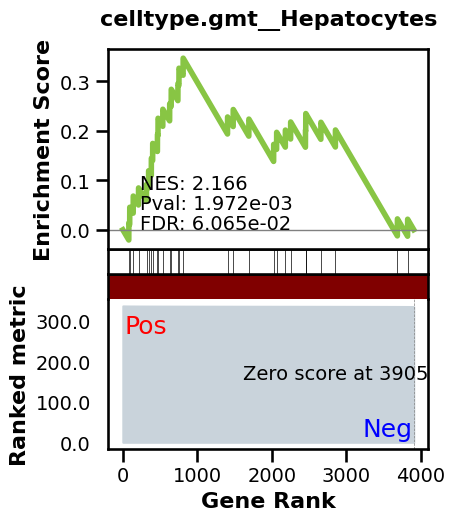

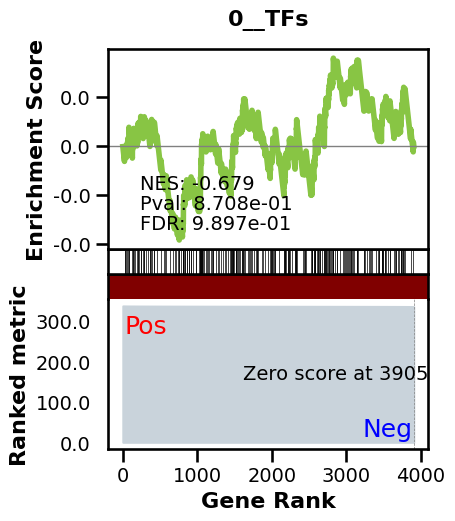

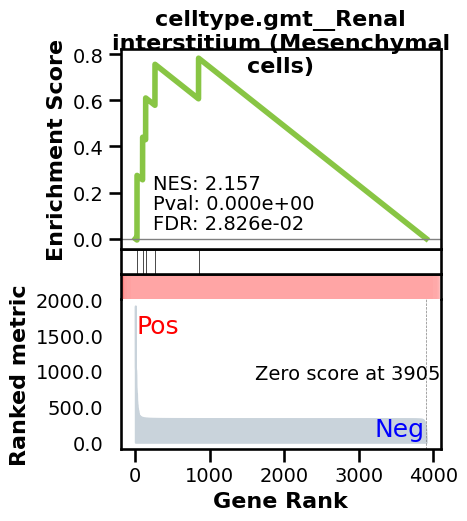

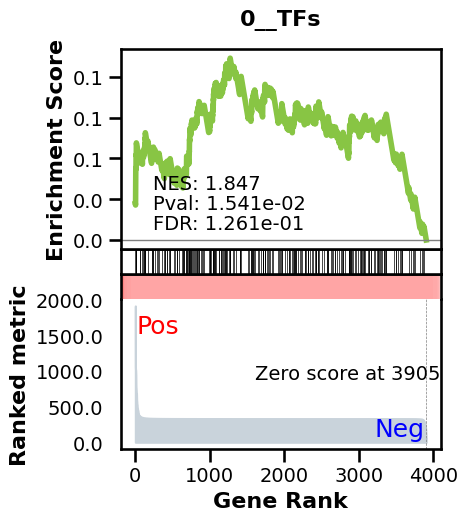

_________________________________________
TF specific enrichment


2024-05-02 17:01:29,728:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 17:01:29,732:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 17:01:29,932:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  7.142857142857143 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2675 genes
intersection pct: 0.6848438300051203
precision:  0.001223932221154686 
recall:  1.0 
random precision: 0.0012243899370189921



 98%|█████████▊| 97/99 [00:01<00:00, 65.98it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 65.91it/s]


Area Under Precision-Recall Curve (AUPRC):  0.002526015717367491
EPR: 6.809537596633253


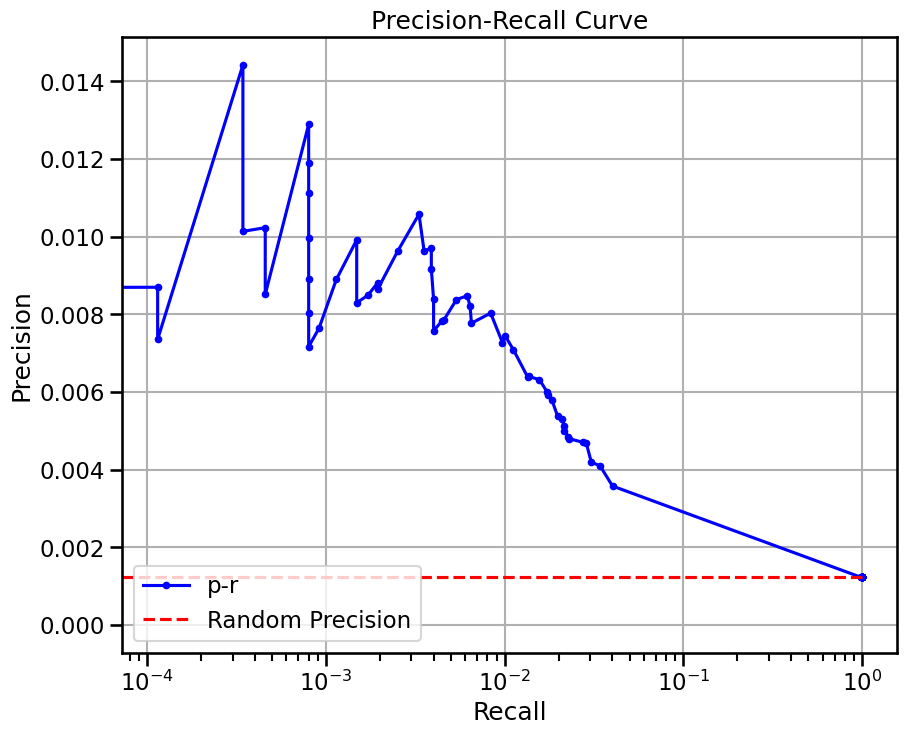

{'enriched_terms_Targets': ['celltype.gmt__Hepatocytes', 'celltype.gmt__Merkel cells', 'celltype.gmt__Pro-B cells', 'celltype.gmt__Basal cells (Airway progenitor cells)', 'celltype.gmt__Endothelial', 'celltype.gmt__Langerhans cells', 'celltype.gmt__Retinal pigment epithelial cells', 'celltype.gmt__Pulmonary alveolar type I cells'], 'enriched_terms_Regulators': ['celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Pro-B cells'], 'significant_enriched_TFtargets': 7.142857142857143, 'precision': 0.001223932221154686, 'recall': 1.0, 'rand_precision': 0.0012243899370189921, 'auprc': 0.002526015717367491, 'EPR': 6.809537596633253}
genie3_tf

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 24.46 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


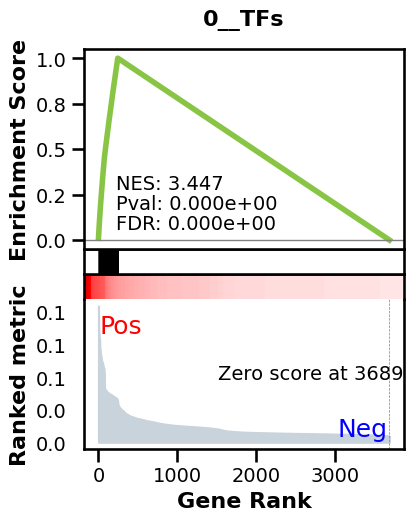

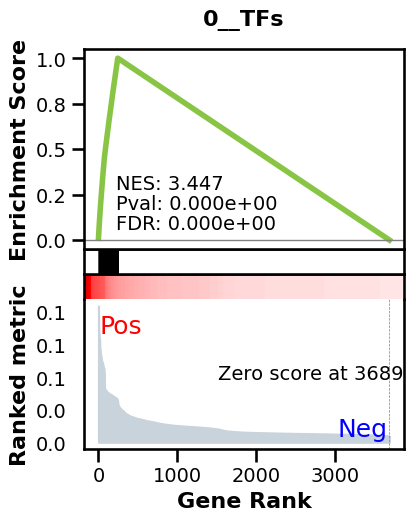

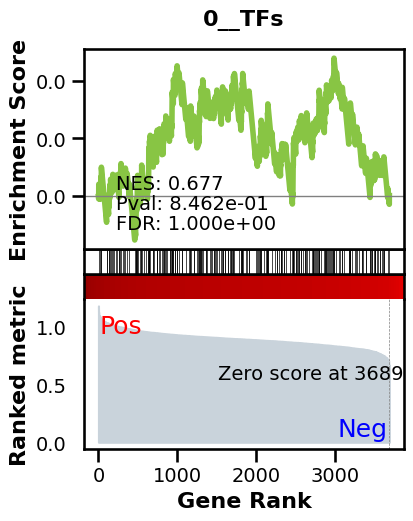

_________________________________________
TF specific enrichment


2024-05-02 17:02:31,969:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 17:02:31,971:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 17:02:32,202:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  9.523809523809524 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2670 genes
intersection pct: 0.7235772357723578
precision:  0.011361540971050056 
recall:  0.18386319293010445 
random precision: 0.0012226661221992553


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)

 44%|████▍     | 44/99 [00:00<00:00, 70.58it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:01<00:00, 69.21it/s]


Area Under Precision-Recall Curve (AUPRC):  0.007077464825009017
EPR: 6.951785689407579


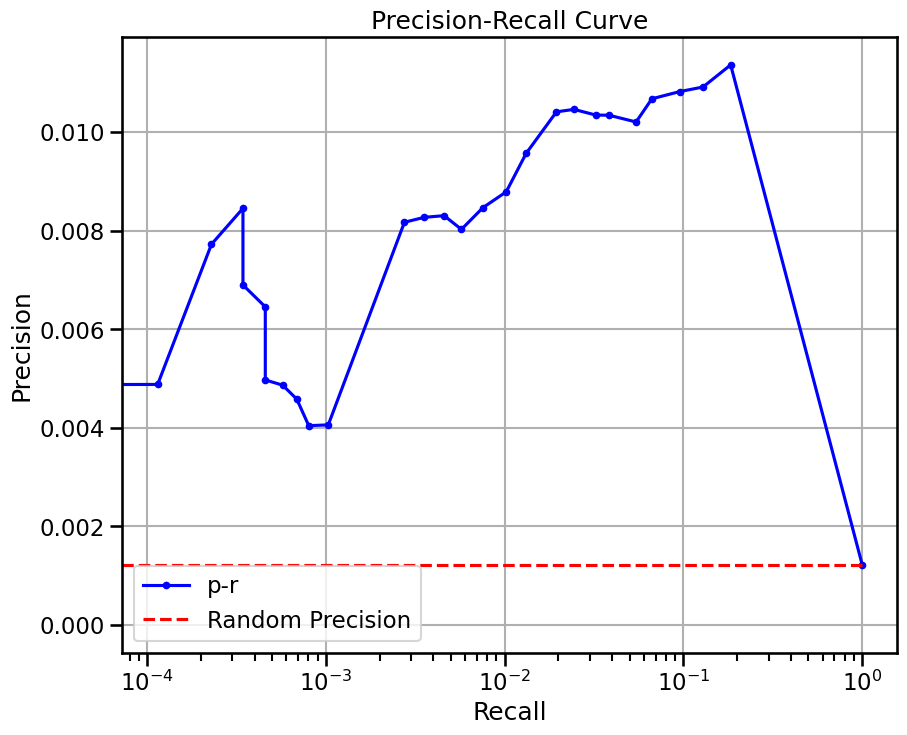

{'enriched_terms_Central': ['0__TFs', 'celltype.gmt__Perivascular cells'], 'significant_enriched_TFtargets': 9.523809523809524, 'precision': 0.011361540971050056, 'recall': 0.18386319293010445, 'rand_precision': 0.0012226661221992553, 'auprc': 0.007077464825009017, 'EPR': 6.951785689407579}
genie3

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 23.64 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


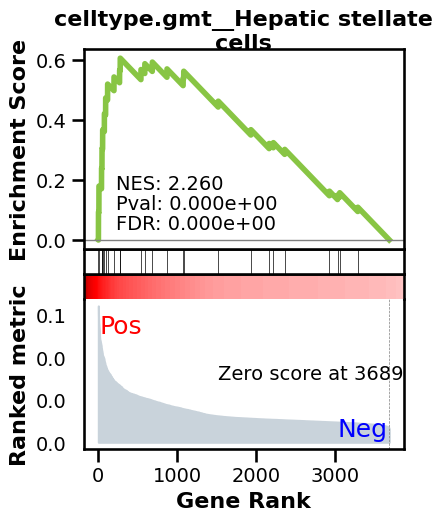

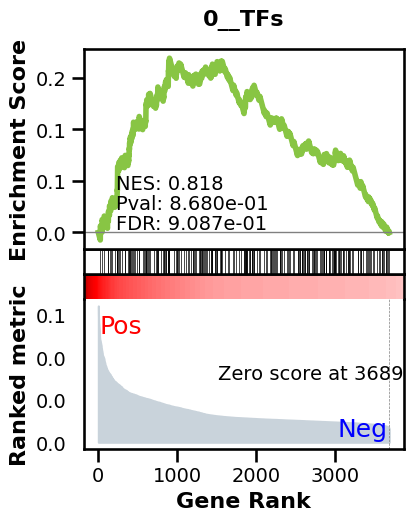

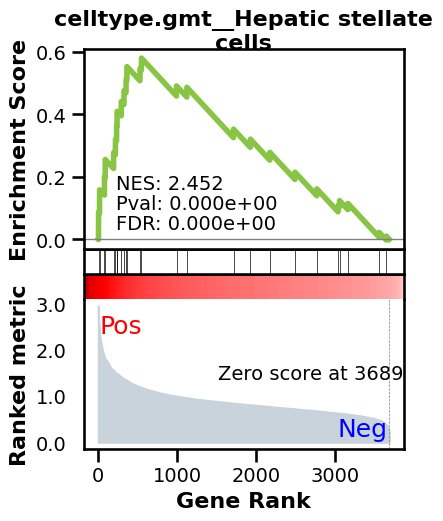

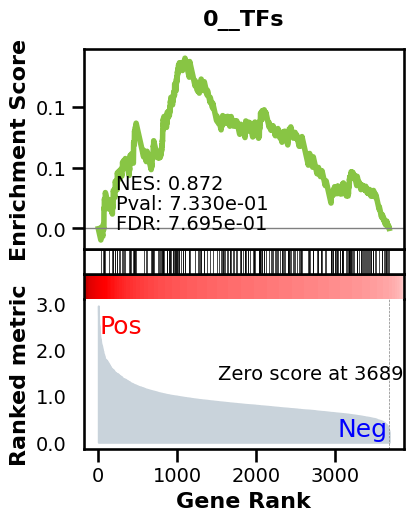

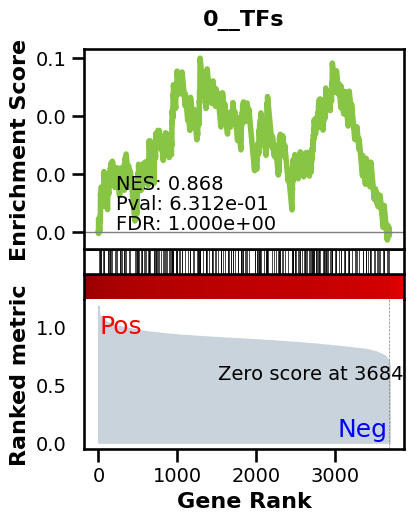

_________________________________________
TF specific enrichment


2024-05-02 17:03:26,393:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 17:03:26,396:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 17:03:26,615:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  2.380952380952381 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2670 genes
intersection pct: 0.7235772357723578
precision:  0.0018222777882619362 
recall:  0.035464248823596924 
random precision: 0.0012226661221992553


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start

 44%|████▍     | 44/99 [00:00<00:00, 69.75it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:01<00:00, 69.28it/s]


Area Under Precision-Recall Curve (AUPRC):  0.001524249941263339
EPR: 1.1267827302643767


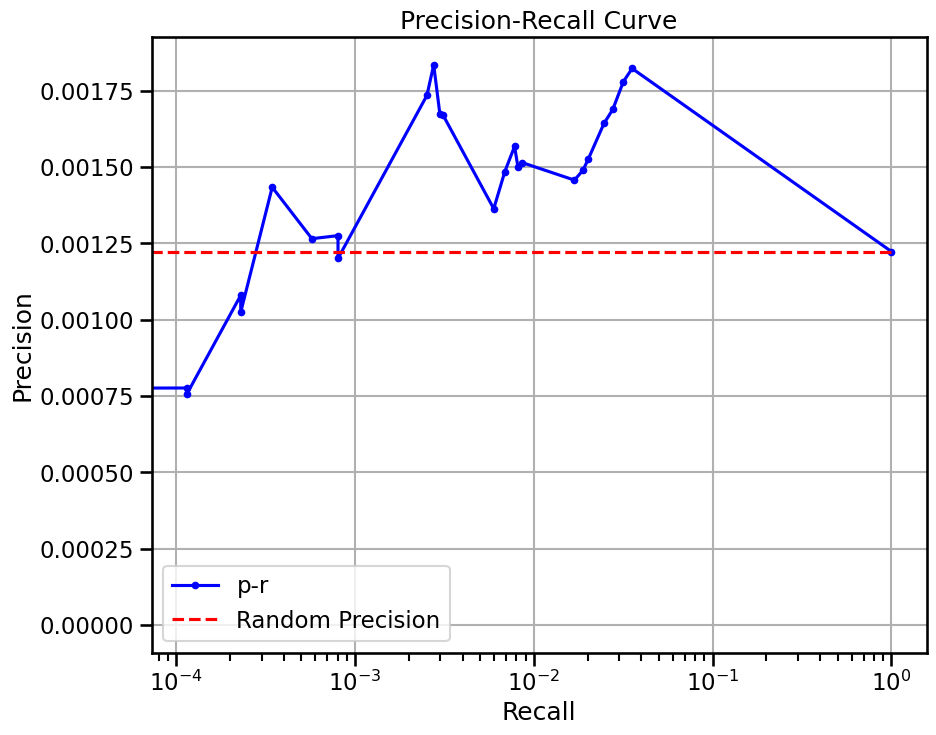

{'enriched_terms_Central': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Podocytes', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Pulmonary alveolar type I cells', 'celltype.gmt__Enteric glia cells'], 'enriched_terms_Targets': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Podocytes', 'celltype.gmt__Pulmonary alveolar type I cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Granulocytes', 'celltype.gmt__Immune cells'], 'significant_enriched_TFtargets': 2.380952380952381, 'precision': 0.0018222777882619362, 'recall': 0.03546424

/tmp/ipykernel_198330/2234600996.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


kidney collecting duct principal cell
scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment


2024-05-02 17:05:37,992:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 17:05:37,995:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 17:05:38,209:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  22.321428571428573 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



 98%|█████████▊| 97/99 [00:26<00:00,  3.85it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:26<00:00,  3.68it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0009965720455929342
EPR: 1.9006732484546502


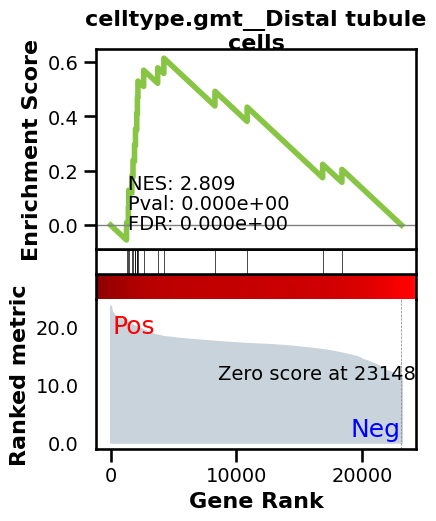

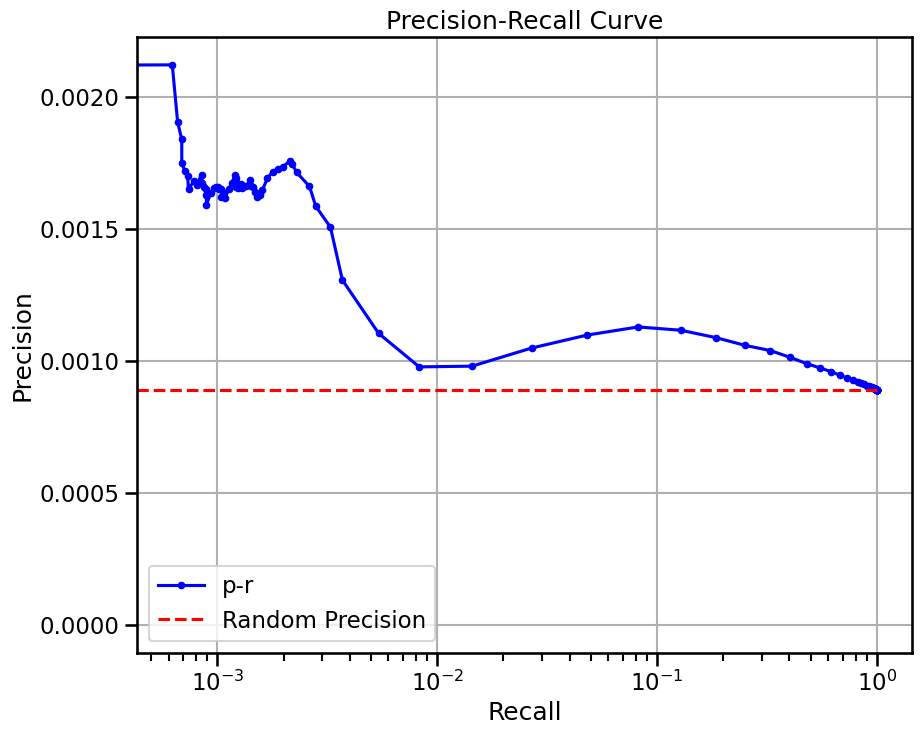

{'enriched_terms_Targets': ['celltype.gmt__Distal tubule cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Principal cells (Collecting duct system)', 'celltype.gmt__Enteric neurons'], 'significant_enriched_TFtargets': 22.321428571428573, 'precision': 0.0008896322223674437, 'recall': 1.0, 'rand_precision': 0.0008897036558203398, 'auprc': 0.0009965720455929342, 'EPR': 1.9006732484546502}
genie3 TF only

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 125.87 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-02 17:13:05,878:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 17:13:05,880:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 17:13:06,088:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.970873786407767 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 9597 genes
intersection pct: 0.686480686695279
precision:  0.005711639294182364 
recall:  0.2840106818894403 
random precision: 0.0010043454857258567


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)

 48%|████▊     | 48/99 [00:09<00:14,  3.62it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:19<00:00,  5.03it/s]


Area Under Precision-Recall Curve (AUPRC):  0.004263434793995835
EPR: 6.86143212177531


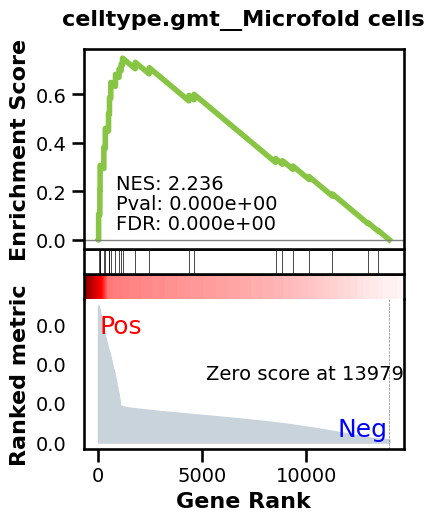

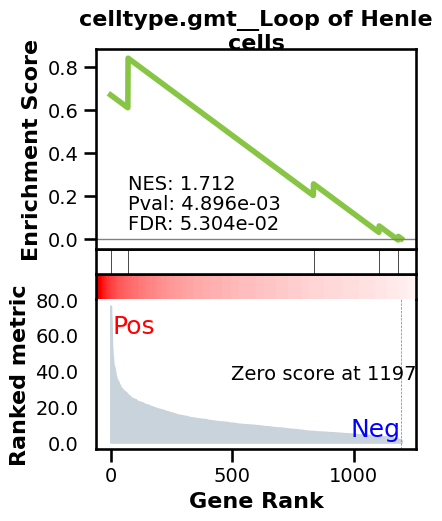

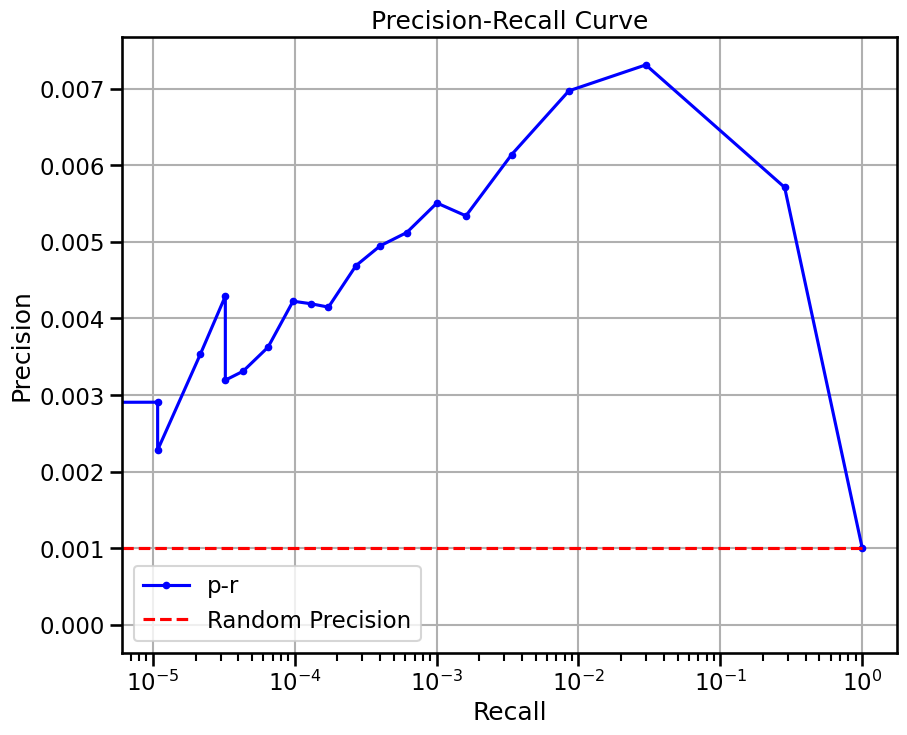

{'enriched_terms_Central': ['celltype.gmt__Microfold cells', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Principal cells (Collecting duct system)', 'celltype.gmt__Melanocytes', 'celltype.gmt__Renal Vesicle cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Glycinergic amacrine cells', 'celltype.gmt__Retinal progenitor cells'], 'enriched_terms_Targets': ['celltype.gmt__Loop of Henle cells'], 'significant_enriched_TFtargets': 0.970873786407767, 'precision': 0.005711639294182364, 'recall': 0.2840106818894403, 'rand_precision': 0.0010043454857258567, 'auprc': 0.004263434793995835, 'EPR': 6.86143212177531}
genie3

View of AnnData object with n_obs × n_vars = 455 × 23149
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', '

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-02 17:21:34,899:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 17:21:34,901:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 17:21:35,084:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 9597 genes
intersection pct: 0.686480686695279
precision:  0.0013238755752658384 
recall:  0.14774091012292823 
random precision: 0.0010043454857258567


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)

 49%|████▉     | 49/99 [00:09<00:09,  5.23it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 99/99 [00:19<00:00,  5.14it/s]


Area Under Precision-Recall Curve (AUPRC):  0.001166548719202189
EPR: 1.033495140693173


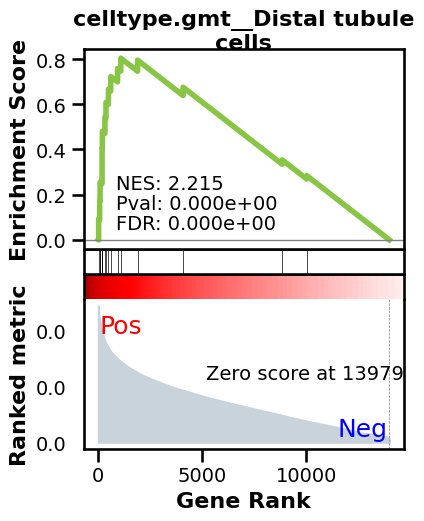

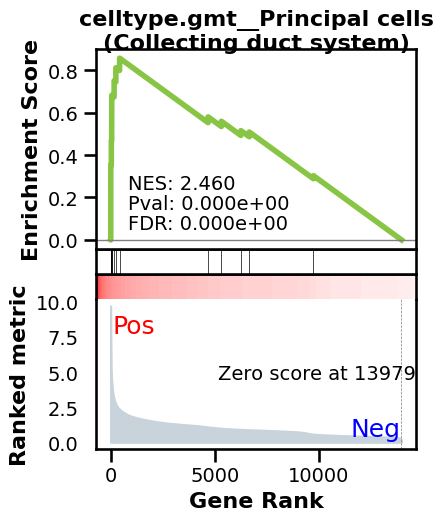

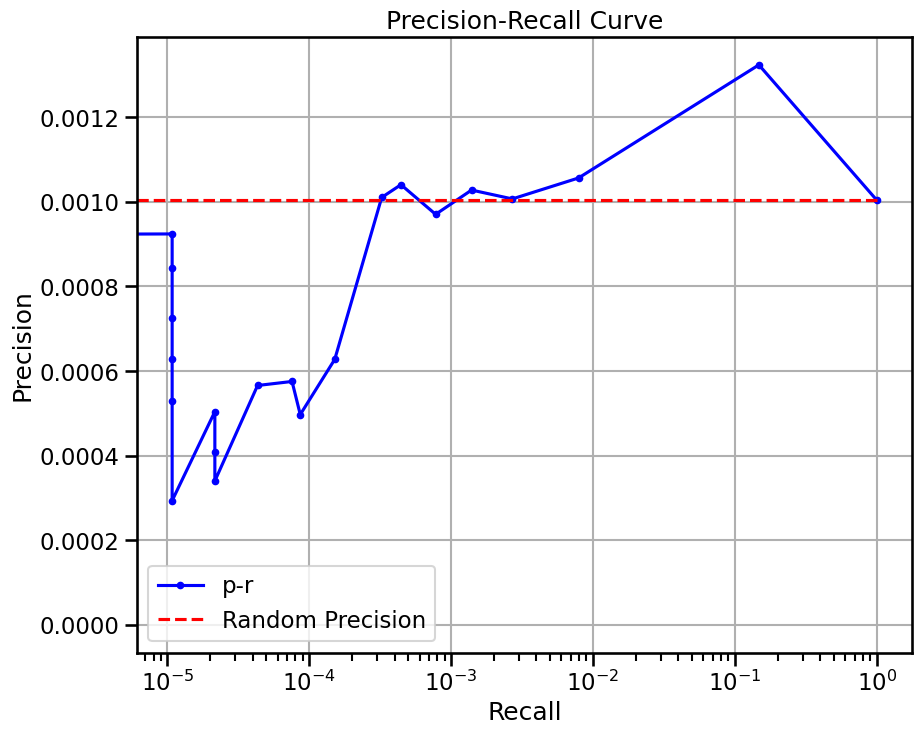

{'enriched_terms_Central': ['celltype.gmt__Distal tubule cells', 'celltype.gmt__Principal cells (Collecting duct system)', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Ductal cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Granulocytes', 'celltype.gmt__Basophils', 'celltype.gmt__Gamma (PP) cells'], 'enriched_terms_Targets': ['celltype.gmt__Principal cells (Collecting duct system)', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Ductal cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Gamma (PP) cells', 'celltype.gmt__Cholangiocytes', 'celltype.gmt__Proximal tubule cells', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Horizontal cells'], 'significant_enriched_TFtargets': 0.0, 'precision': 0.001323875

/tmp/ipykernel_198330/2234600996.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:325: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 21657 ...
doing regression....
metrics {'used_heads': 56, 'precision': 0.009388151505341535, 'random_precision': 0.00121056993893909, 'recall': 0.00401078763570984, 'predicted_true': 6178.0, 'number_of_true': 14461.0, 'epr': 5.134693340616774}


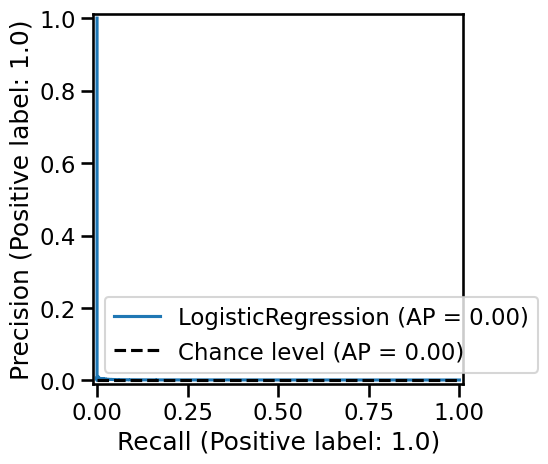

In [8]:
metrics = {}
for celltype in list(set(adata.obs.cell_type)):
    grn_inferer = GRNfer(model, adata,
        how="random expr",
        preprocess="softmax",
        head_agg='max',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=3000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print(celltype)
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[8:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_scprint'] = m
    print(m)
    print("genie3 TF only\n")
    subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
    grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_tf'] = m
    print(m)
    print("genie3\n")
    print(subadata)
    signal.signal(signal.SIGALRM, timeout_handler)
    signal.alarm(900)  # set a signal for 15 minutes
    try:
        grn = compute_genie3(subadata, nthreads=32)
        m = BenGRN(grn).scprint_benchmark()
        print(m)
        metrics[celltype+'_genie3'] = m
    except TimeoutException:
        print("The operation didn't finish within 30 minutes.")
    finally:
        signal.alarm(0)  # disable the alarm
    print("______________________________")
    print("now with classifier")
    grn_inferer = GRNfer(model, adata,
        how="most var across",
        preprocess="softmax",
        head_agg='none',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=6000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn, m = train_classifier(grn, C=0.1, train_size=0.3, class_weight={1: 100, 0: 1}, shuffle=False)
    grn.varp['GRN'] = grn.varp['classified']
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    print(m)
    m = BenGRN(grn).scprint_benchmark()
    print(m)
    metrics[celltype+'_scprint_class'] = m
    subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
    print("genie3_tf\n")
    grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_tf_mostvar'] = m
    print(m)
    print("genie3\n")
    grn = compute_genie3(subadata, nthreads=32)
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_mostvar'] = m
    print(m)
    print("__________________________________")

In [10]:
elem = list(set(adata.obs.cell_type) - set([
'kidney distal convoluted tubule epithelial cell',
 'kidney loop of Henle thick ascending limb epithelial cell',
 'kidney collecting duct principal cell', 
 'mesangial cell',
  'blood vessel smooth muscle cell',
]))
elem

['macrophage',
 'kidney interstitial fibroblast',
 'podocyte',
 'leukocyte',
 'endothelial cell',
 'kidney proximal convoluted tubule epithelial cell',
 'kidney granular cell',
 'kidney collecting duct intercalated cell',
 'macula densa epithelial cell']

/tmp/ipykernel_231158/4025348686.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


macrophage
scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/torch/utils/tensorboard/__init__.py:4: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if not hasattr(tensorboard, "__version__") or LooseVersion(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/torch/utils/tensorboard/__init__.py:6: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  ) < LooseVersion("1.15"):
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 534303225, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment


2024-05-02 20:15:48,332:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 20:15:48,336:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 20:15:48,563:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  20.535714285714285 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12439 genes
intersection pct: 0.5383217206906998
precision:  0.0008912049366710657 
recall:  1.0 
random precision: 0.0008912765884588669


 98%|█████████▊| 97/99 [00:23<00:00,  4.10it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:24<00:00,  4.06it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0009801752834808525
EPR: 1.645467805207713


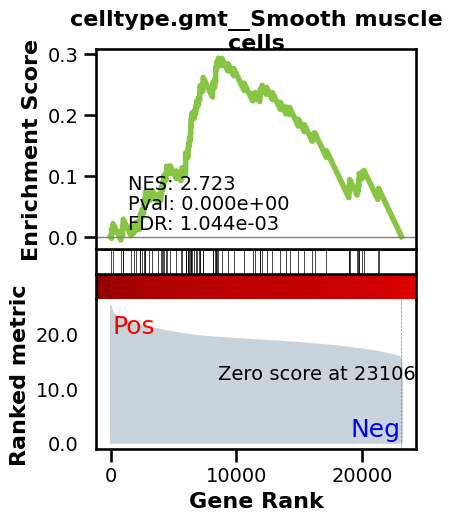

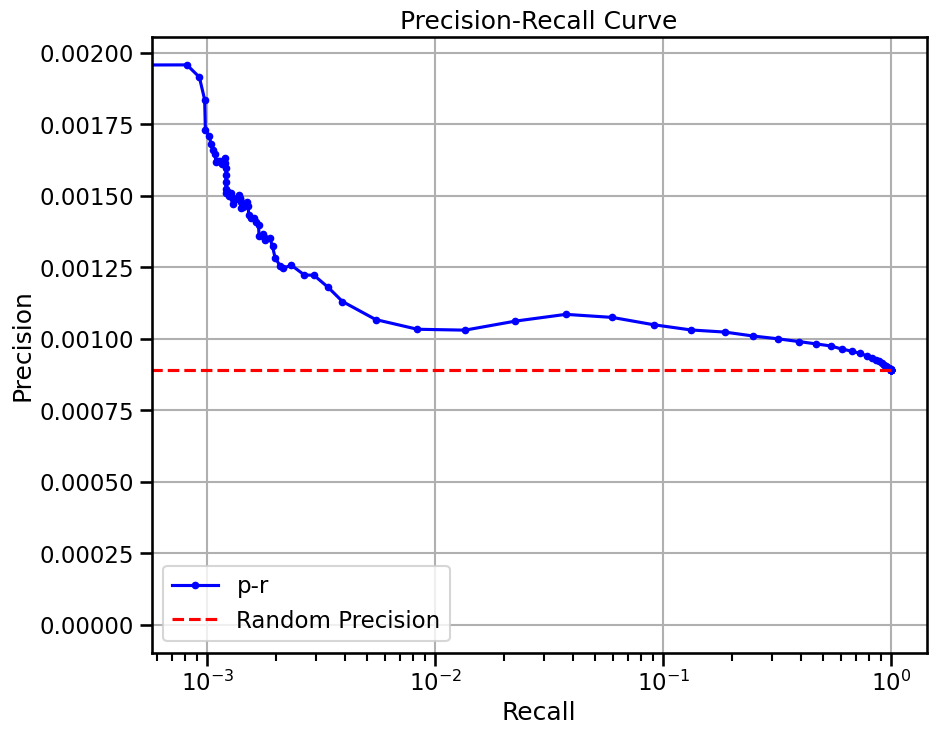

{'enriched_terms_Targets': ['celltype.gmt__Smooth muscle cells', 'celltype.gmt__Proximal tubule cells', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Hepatocytes', 'celltype.gmt__Principal cells (Collecting duct system)', 'celltype.gmt__Podocytes', 'celltype.gmt__Enteric neurons'], 'significant_enriched_TFtargets': 20.535714285714285, 'precision': 0.0008912049366710657, 'recall': 1.0, 'rand_precision': 0.0008912765884588669, 'auprc': 0.0009801752834808525, 'EPR': 1.645467805207713}
genie3 TF only

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 58.03 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


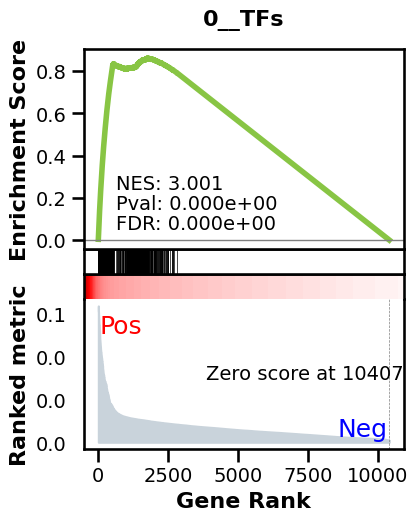

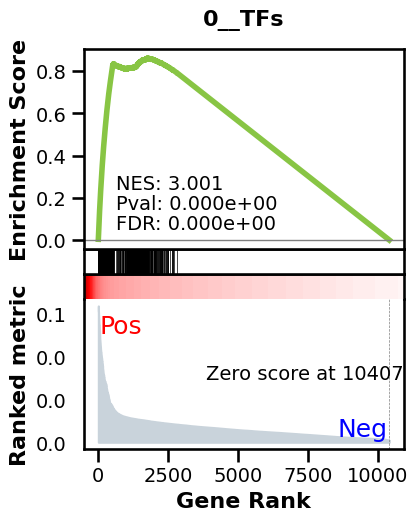

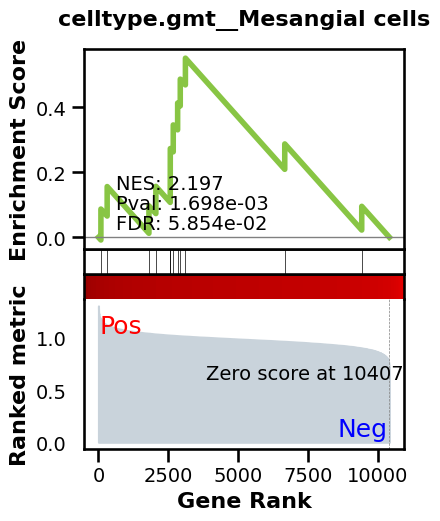

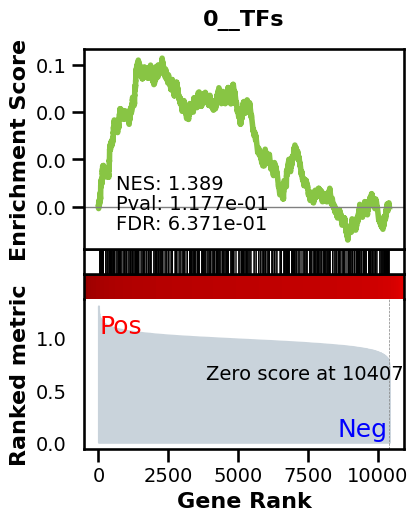

_________________________________________
TF specific enrichment


2024-05-02 20:20:33,823:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 20:20:33,825:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 20:20:34,032:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  5.376344086021505 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 7361 genes
intersection pct: 0.7072444273635665
precision:  0.00900703209142882 
recall:  0.17163627766777978 
random precision: 0.0012492026130665138


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 48%|████▊     | 48/99 [00:05<00:05,  9.35it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:10<00:00,  9.32it/s]


Area Under Precision-Recall Curve (AUPRC):  0.005717122915554777
EPR: 6.340289014431156


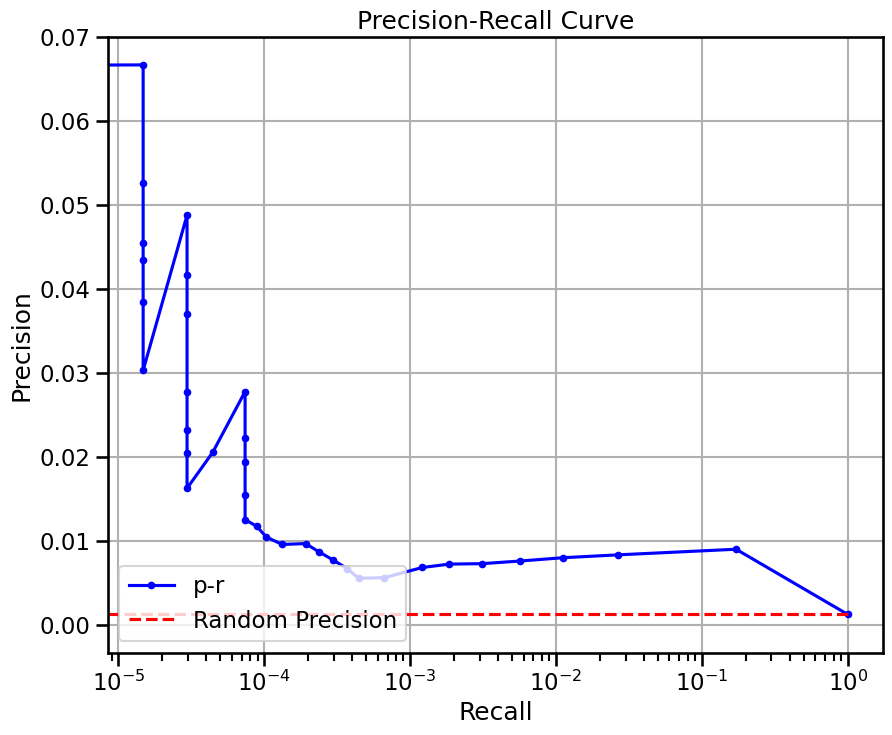

{'enriched_terms_Central': ['0__TFs', 'celltype.gmt__Melanocytes', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Renal Vesicle cells', 'celltype.gmt__Microfold cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Horizontal cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Glycinergic amacrine cells', 'celltype.gmt__Rod photoreceptor cells', 'celltype.gmt__Principal cells (Collecting duct system)', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)'], 'enriched_terms_Regulators': ['celltype.gmt__Mesangial cells'], 'significant_enriched_TFtargets': 5.376344086021505, 'precision': 0.00900703209142882, 'recall': 0.17163627766777978, 'rand_precision': 0.0012492026130665138, 'auprc': 0.005717122915554777, 'EPR': 6.340289014431156}
genie3

View of AnnData object with n_obs × n_vars = 88 × 23107
    obs: 'donor_id', 'self_reported_e

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


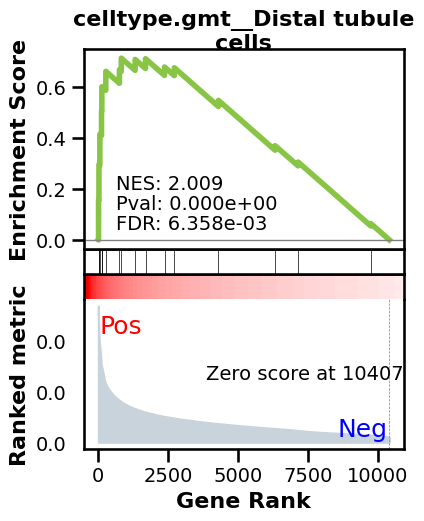

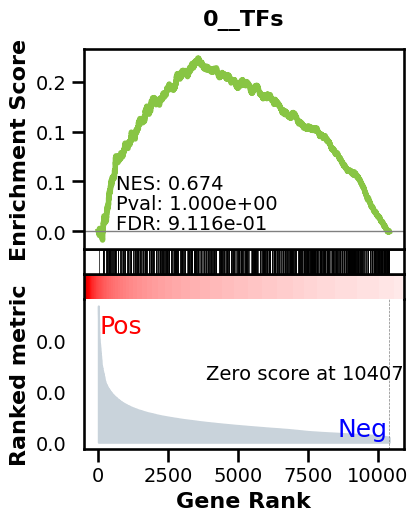

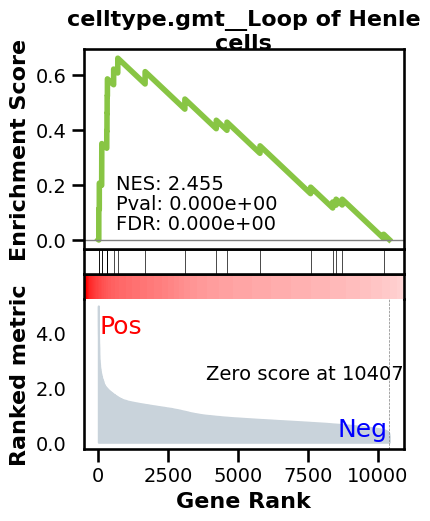

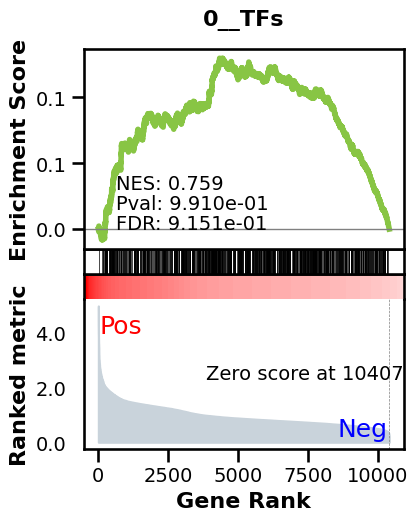

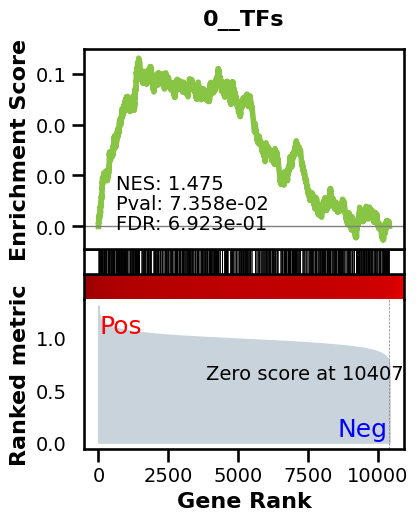

_________________________________________
TF specific enrichment


2024-05-02 20:23:33,305:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 20:23:33,307:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 20:23:33,506:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  2.150537634408602 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 7361 genes
intersection pct: 0.7072444273635665
precision:  0.001613364662623875 
recall:  0.03558024764325187 
random precision: 0.0012492026130665138


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 48%|████▊     | 48/99 [00:05<00:05,  9.57it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:10<00:00,  9.59it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0014315172020694137
EPR: 1.0172712692788004


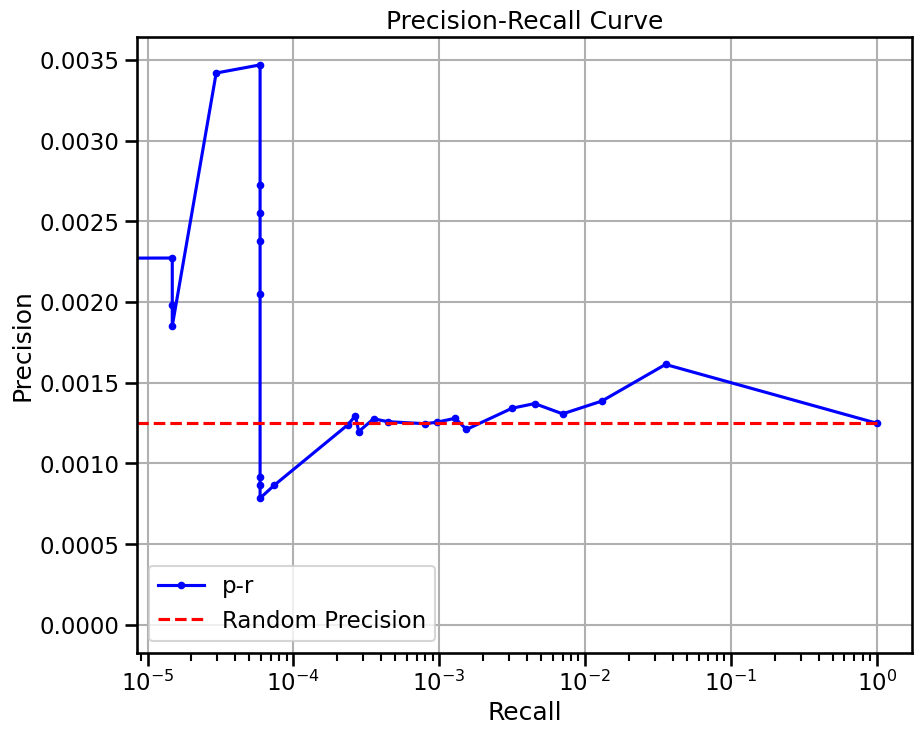

{'enriched_terms_Central': ['celltype.gmt__Distal tubule cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Proximal tubule cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Immune cells', 'celltype.gmt__Gamma (PP) cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)'], 'enriched_terms_Targets': ['celltype.gmt__Loop of Henle cells', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Leydig cells', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Proximal tubule cells', 'celltype.gmt__Immune cells', 'celltype.gmt__Gamma (PP) cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Principal cells (Collecting duct system)'], 'significant_enriched_TFtargets': 2.150

/tmp/ipykernel_231158/4025348686.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:325: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 18080 ...
doing regression....
metrics {'used_heads': 53, 'precision': 0.008725459644749143, 'random_precision': 0.0012258548302774921, 'recall': 0.002309278350515464, 'predicted_true': 3209.0, 'number_of_true': 12125.0, 'epr': 3.656674221059488}


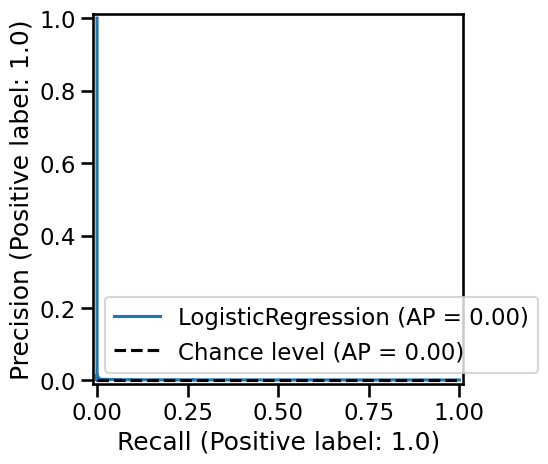

{'used_heads': 53, 'precision': 0.008725459644749143, 'random_precision': 0.0012258548302774921, 'recall': 0.002309278350515464, 'predicted_true': 3209.0, 'number_of_true': 12125.0, 'epr': 3.656674221059488}
base enrichment
Top central genes: []


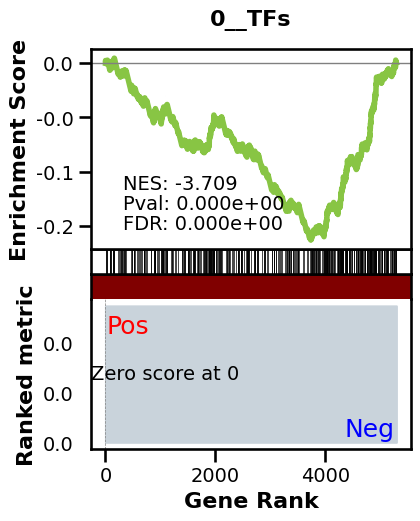

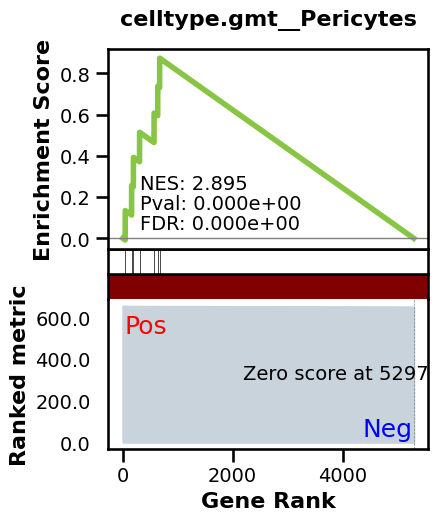

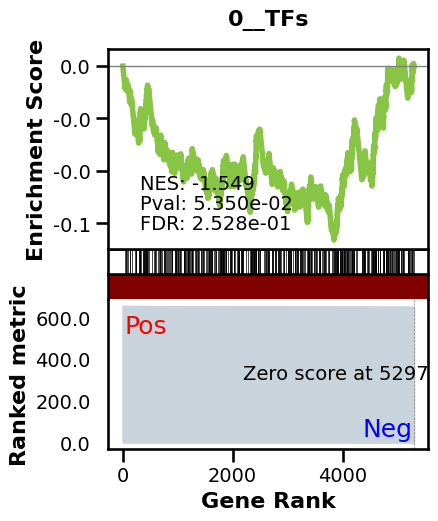

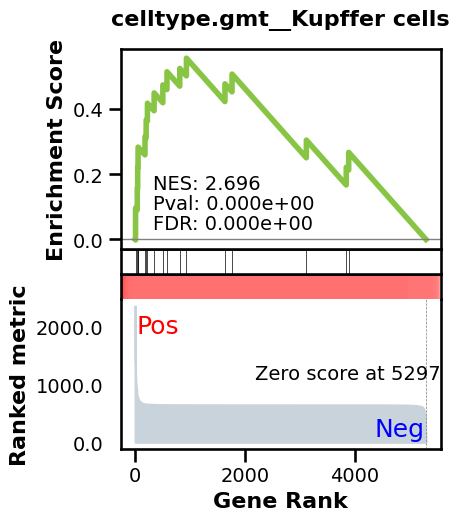

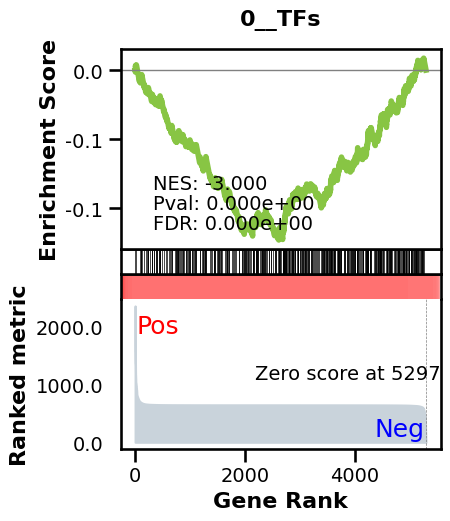

_________________________________________
TF specific enrichment


2024-05-02 20:36:41,367:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 20:36:41,370:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 20:36:41,561:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  4.545454545454546 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 3759 genes
intersection pct: 0.7095130237825594
precision:  0.0012795397280454372 
recall:  1.0 
random precision: 0.00127988021227323


 97%|█████████▋| 96/99 [00:02<00:00, 38.94it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:02<00:00, 37.71it/s]


Area Under Precision-Recall Curve (AUPRC):  0.00224019817736689
EPR: 4.446686888330567


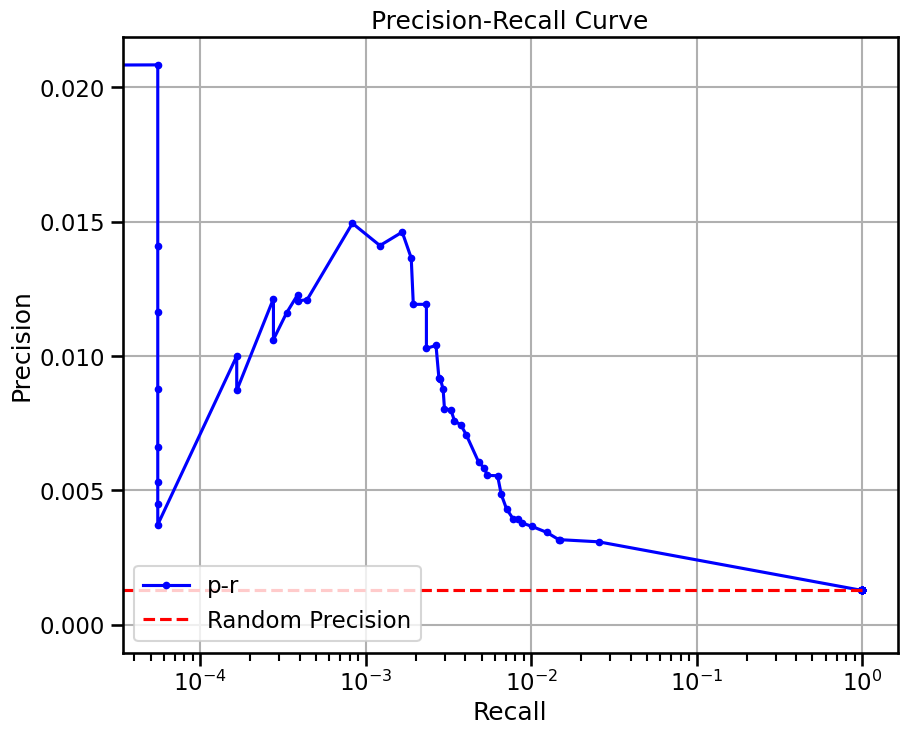

{'enriched_terms_Targets': ['celltype.gmt__Pericytes', 'celltype.gmt__Adipose progenitor cells', 'celltype.gmt__Endometrium', 'celltype.gmt__Lymphatic Endothelial cells', 'celltype.gmt__Immune system cells', 'celltype.gmt__Cholangiocytes', 'celltype.gmt__Enteric neurons', 'celltype.gmt__Alveolar macrophages', 'celltype.gmt__Kupffer cells', 'celltype.gmt__Astrocytes', 'celltype.gmt__Extracellular matrix cells', 'celltype.gmt__Stromal cells', 'celltype.gmt__Endothelial', 'celltype.gmt__Epsilon cells'], 'enriched_terms_Regulators': ['celltype.gmt__Kupffer cells', 'celltype.gmt__Plasma B cells', 'celltype.gmt__Memory B cells', 'celltype.gmt__Naive B cells', 'celltype.gmt__Pro-B cells', 'celltype.gmt__Naive CD4+ T cells', 'celltype.gmt__Effector CD4+ T cells', 'celltype.gmt__Lymphatic Endothelial cells', 'celltype.gmt__-T cells', 'celltype.gmt__Granulocytes'], 'significant_enriched_TFtargets': 4.545454545454546, 'precision': 0.0012795397280454372, 'recall': 1.0, 'rand_precision': 0.00127988

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


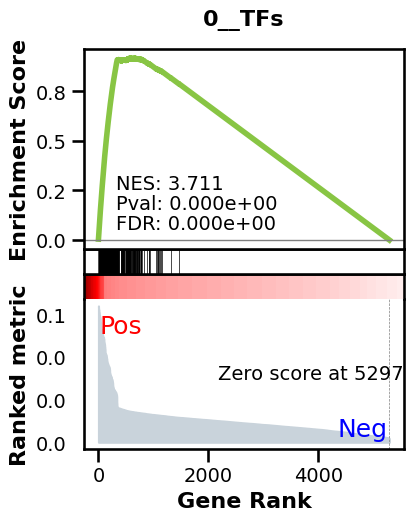

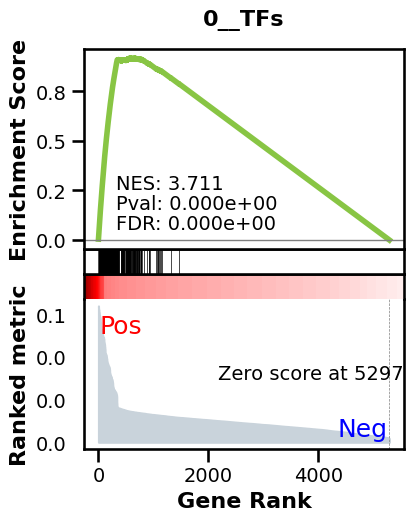

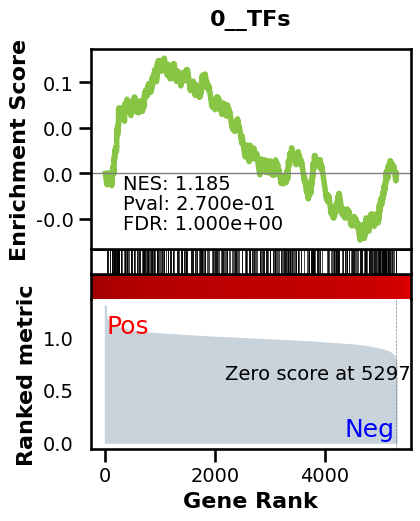

_________________________________________
TF specific enrichment


2024-05-02 20:38:04,692:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 20:38:04,694:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 20:38:04,878:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  4.545454545454546 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 3759 genes
intersection pct: 0.7095130237825594
precision:  0.008934261928585345 
recall:  0.2992809734513274 
random precision: 0.00127988021227323


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 48%|████▊     | 48/99 [00:01<00:01, 39.09it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:02<00:00, 39.04it/s]


Area Under Precision-Recall Curve (AUPRC):  0.006330911057351414
EPR: 5.995848654092347


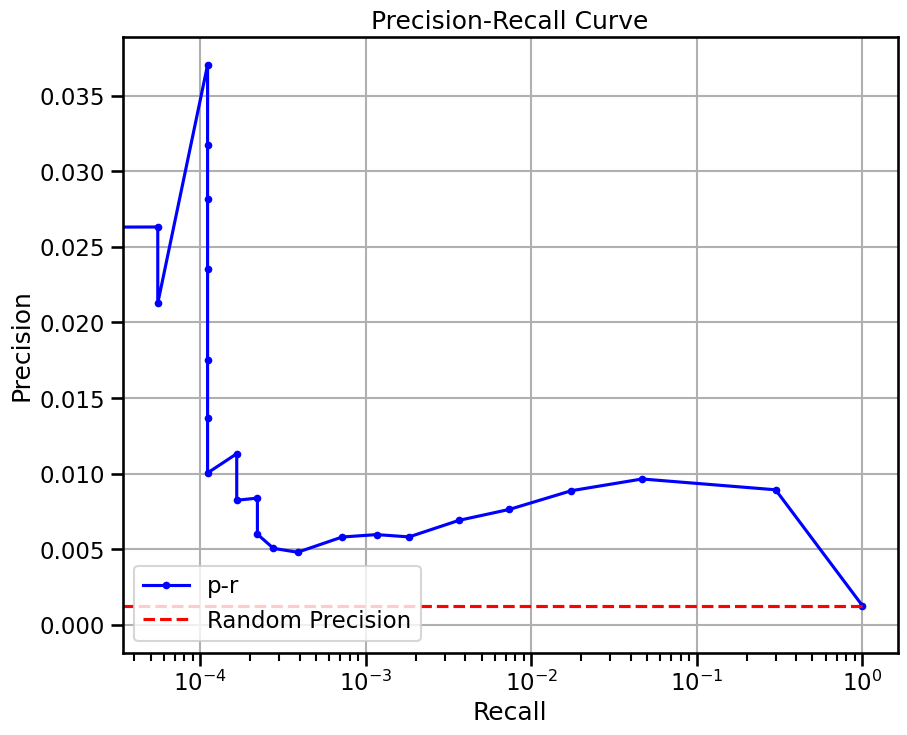

{'enriched_terms_Central': ['0__TFs'], 'significant_enriched_TFtargets': 4.545454545454546, 'precision': 0.008934261928585345, 'recall': 0.2992809734513274, 'rand_precision': 0.00127988021227323, 'auprc': 0.006330911057351414, 'EPR': 5.995848654092347}
genie3

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 33.49 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


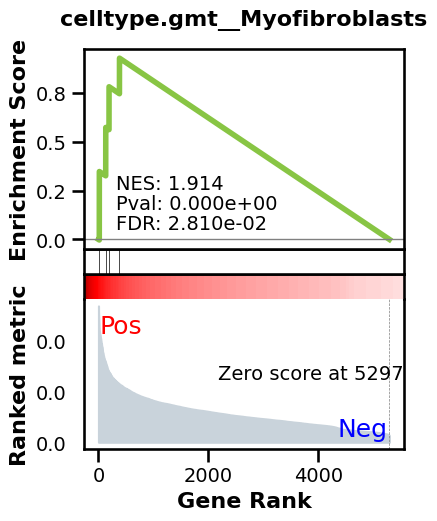

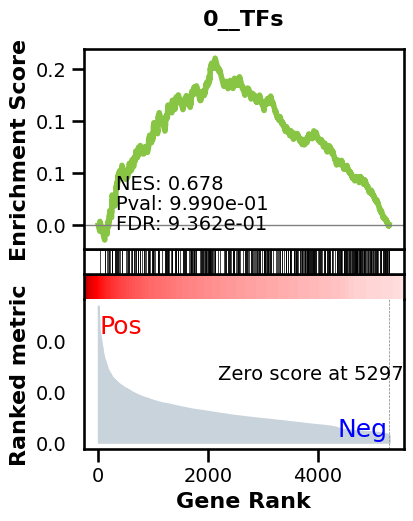

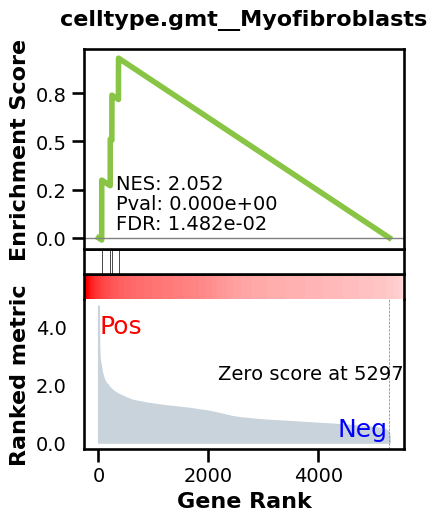

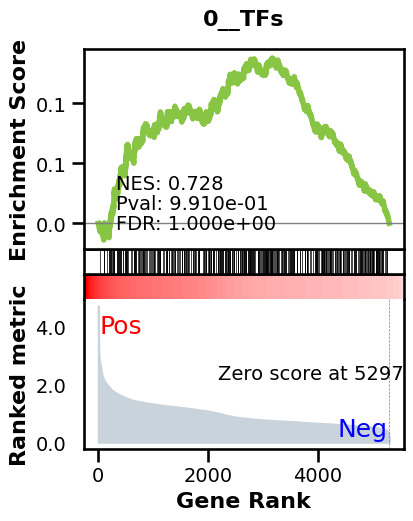

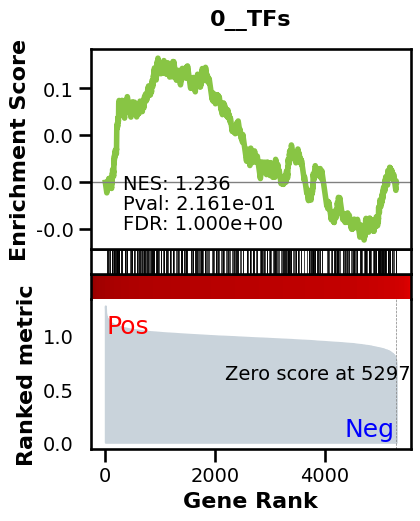

_________________________________________
TF specific enrichment


2024-05-02 20:39:23,594:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 20:39:23,596:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 20:39:23,795:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  2.272727272727273 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 3759 genes
intersection pct: 0.7095130237825594
precision:  0.0017153683533550172 
recall:  0.08733407079646018 
random precision: 0.00127988021227323


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 48%|████▊     | 48/99 [00:01<00:01, 39.72it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:02<00:00, 38.44it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0014970800707831981
EPR: 0.6476371843258449


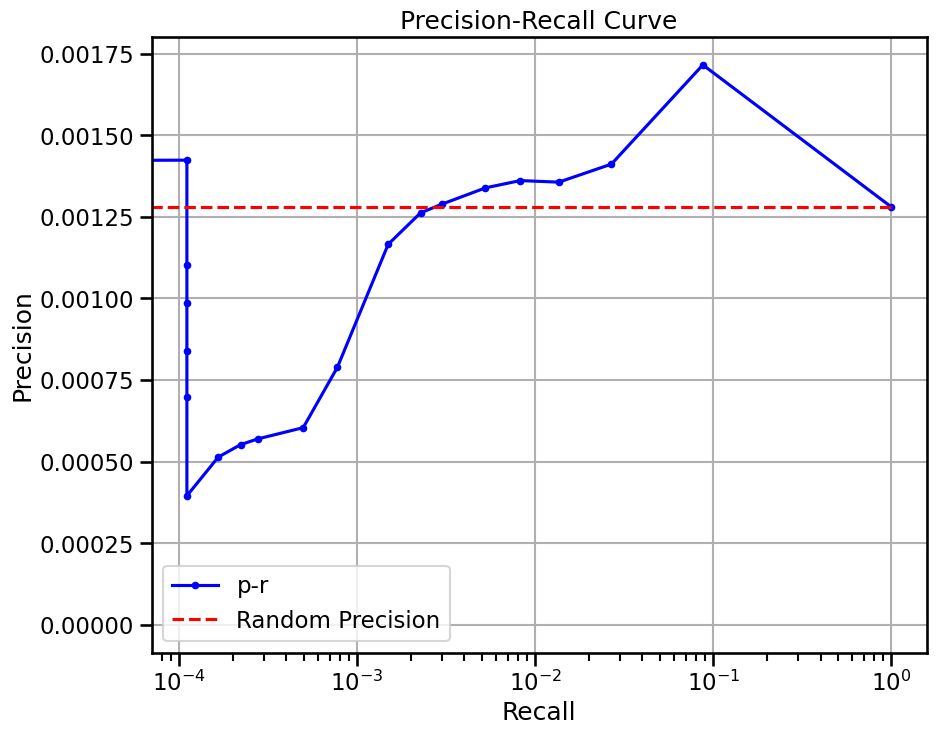

{'enriched_terms_Central': ['celltype.gmt__Myofibroblasts'], 'enriched_terms_Targets': ['celltype.gmt__Myofibroblasts', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Immune cells'], 'significant_enriched_TFtargets': 2.272727272727273, 'precision': 0.0017153683533550172, 'recall': 0.08733407079646018, 'rand_precision': 0.00127988021227323, 'auprc': 0.0014970800707831981, 'EPR': 0.6476371843258449}
__________________________________


/tmp/ipykernel_231158/4025348686.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


kidney interstitial fibroblast
scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment


2024-05-02 20:41:39,019:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 20:41:39,021:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 20:41:39,222:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  24.107142857142858 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:23<00:00,  4.06it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:24<00:00,  4.05it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0009551140554200913
EPR: 1.7288406236830192


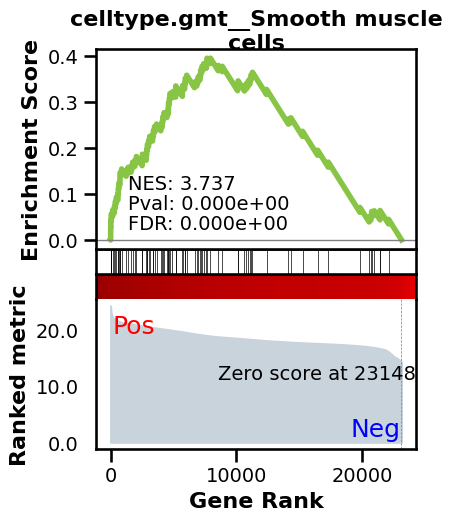

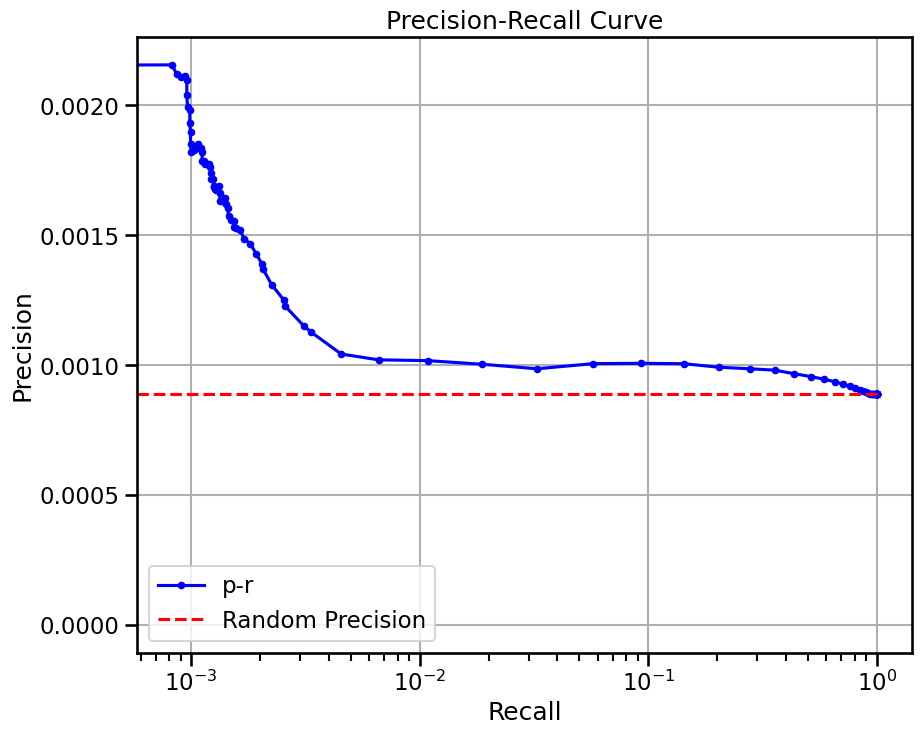

{'enriched_terms_Targets': ['celltype.gmt__Smooth muscle cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Podocytes', 'celltype.gmt__Lymphatic Endothelial cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Extracellular matrix cells', 'celltype.gmt__Hepatocytes', 'celltype.gmt__Adipose progenitor cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Enteric neurons', 'celltype.gmt__Pericytes', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Endothelial', 'celltype.gmt__Endometrium', 'celltype.gmt__Embryonic stem cells'], 'significant_enriched_TFtargets': 24.107142857142858, 'precision': 0.0008896322223674437, 'recall': 1.0, 'rand_precision': 0.0008897036558203398, 'auprc': 0.0009551140554200913, 'EPR': 1.7288406236830192}
genie3 TF only

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 102.50 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-02 20:47:50,374:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 20:47:50,376:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 20:47:50,595:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 9181 genes
intersection pct: 0.6963743932038835
precision:  0.007390423035847446 
recall:  0.2672717069906978 
random precision: 0.0010994810491212908


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 48%|████▊     | 48/99 [00:07<00:08,  6.34it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:15<00:00,  6.35it/s]


Area Under Precision-Recall Curve (AUPRC):  0.005139557522240802
EPR: 6.647507896683766


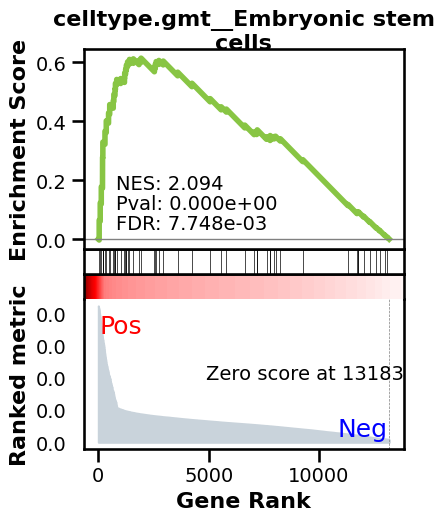

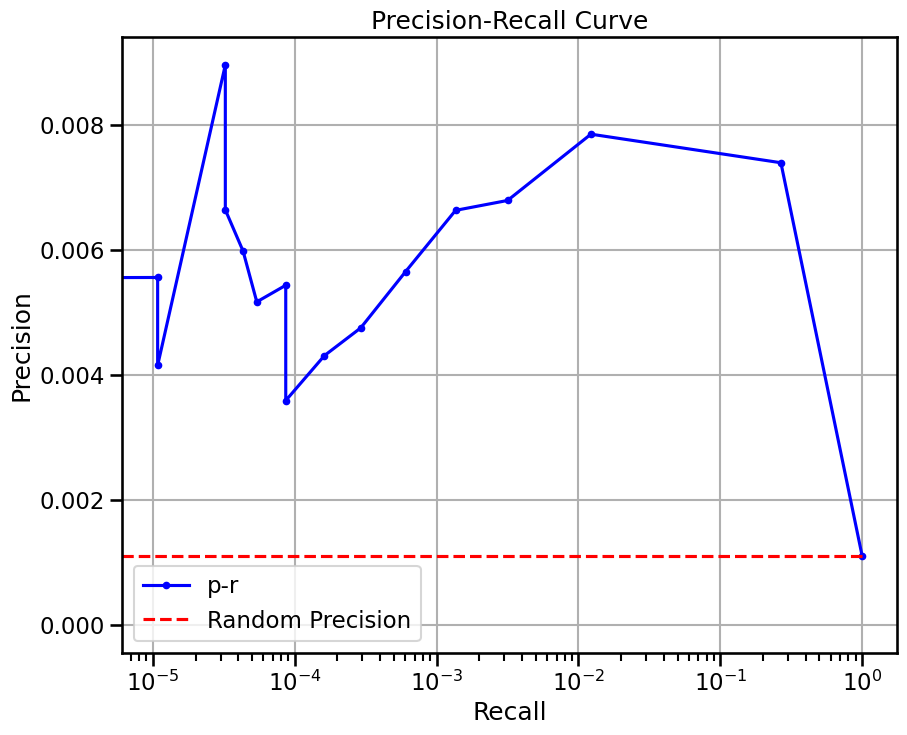

{'enriched_terms_Central': ['celltype.gmt__Embryonic stem cells', 'celltype.gmt__Microfold cells', 'celltype.gmt__Melanocytes', 'celltype.gmt__Renal Vesicle cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Satellite cells', 'celltype.gmt__Glycinergic amacrine cells', 'celltype.gmt__Hepatoblasts', 'celltype.gmt__Horizontal cells', 'celltype.gmt__Endometrium', 'celltype.gmt__Radial glial cells', 'celltype.gmt__Ionocytes', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Gamma (PP) cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Dopaminergic neurons', 'celltype.gmt__

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-02 20:53:45,465:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 20:53:45,467:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 20:53:45,664:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  2.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 9181 genes
intersection pct: 0.6963743932038835
precision:  0.0015873903315950647 
recall:  0.10540003884920035 
random precision: 0.0010994810491212908


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 48%|████▊     | 48/99 [00:07<00:08,  6.24it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:15<00:00,  6.24it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0013489162165694053
EPR: 1.0601638945822984


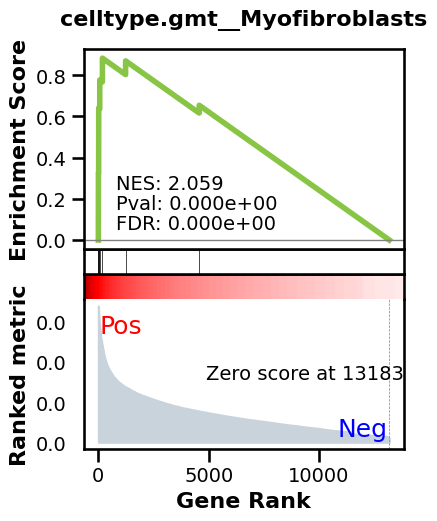

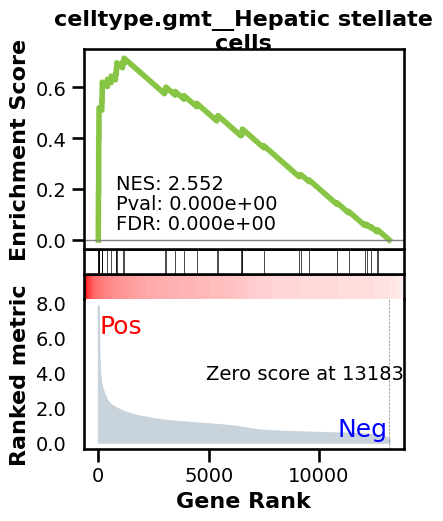

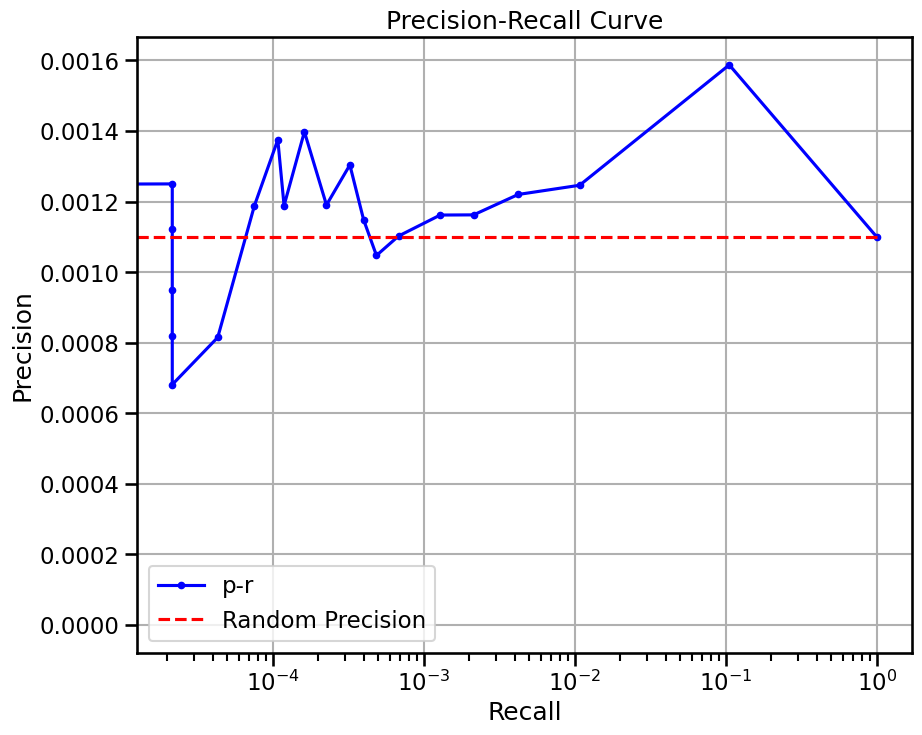

{'enriched_terms_Central': ['celltype.gmt__Myofibroblasts', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Endothelial cells', 'celltype.gmt__Horizontal cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Principal cells (Collecting duct system)', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Proximal tubule cells', 'celltype.gmt__Immune cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Glutamatergic neurons', 'celltype.gmt__Radial glial cells', 'celltype.gmt__Leydig cells'], 'enriched_te

/tmp/ipykernel_231158/4025348686.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:325: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 17566 ...
doing regression....
metrics {'used_heads': 60, 'precision': 0.006541291905151268, 'random_precision': 0.0013141903977737098, 'recall': 0.00518326545723806, 'predicted_true': 8561.0, 'number_of_true': 10804.0, 'epr': 5.270107658193271}


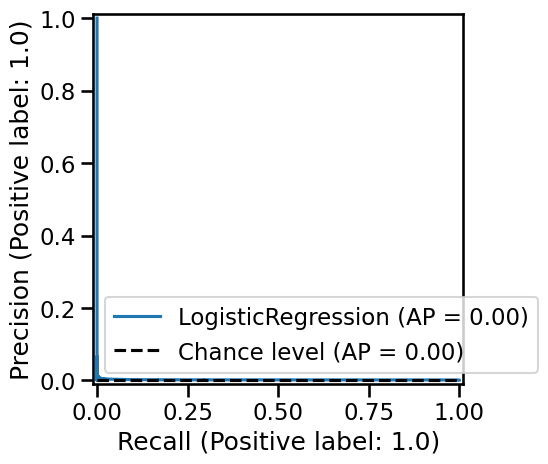

{'used_heads': 60, 'precision': 0.006541291905151268, 'random_precision': 0.0013141903977737098, 'recall': 0.00518326545723806, 'predicted_true': 8561.0, 'number_of_true': 10804.0, 'epr': 5.270107658193271}
base enrichment
Top central genes: []


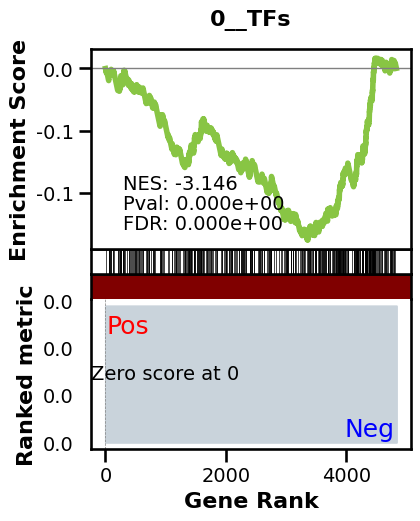

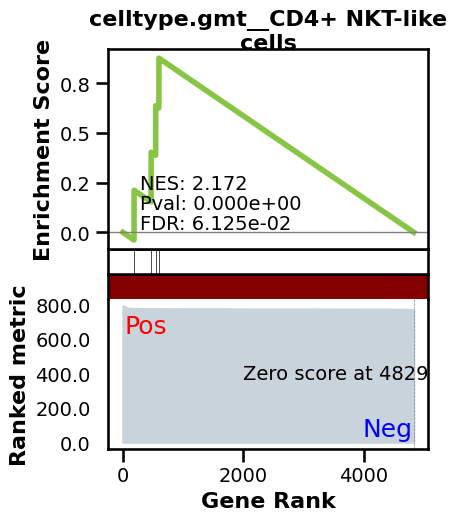

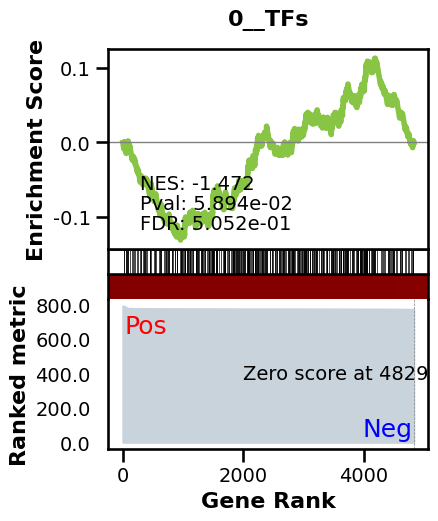

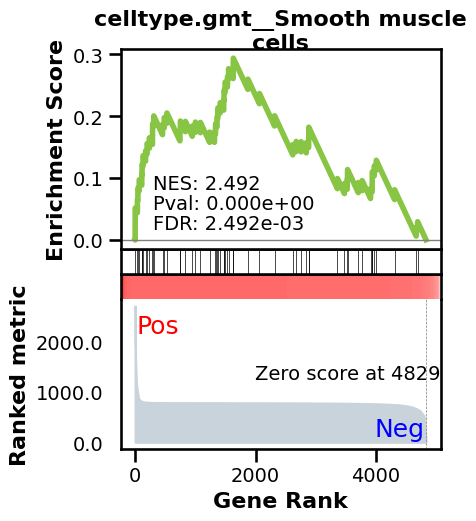

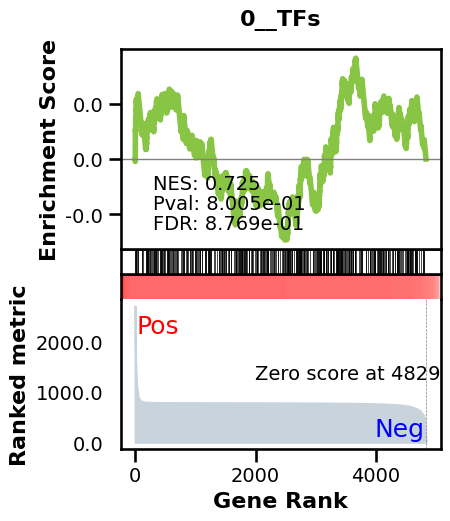

_________________________________________
TF specific enrichment


2024-05-02 21:04:27,518:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 21:04:27,524:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 21:04:27,722:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  24.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 3427 genes
intersection pct: 0.7095238095238096
precision:  0.0014957006057987646 
recall:  1.0 
random precision: 0.0014961371792388694


 97%|█████████▋| 96/99 [00:02<00:00, 45.91it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:02<00:00, 45.78it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0022268273845667264
EPR: 5.122857809155146


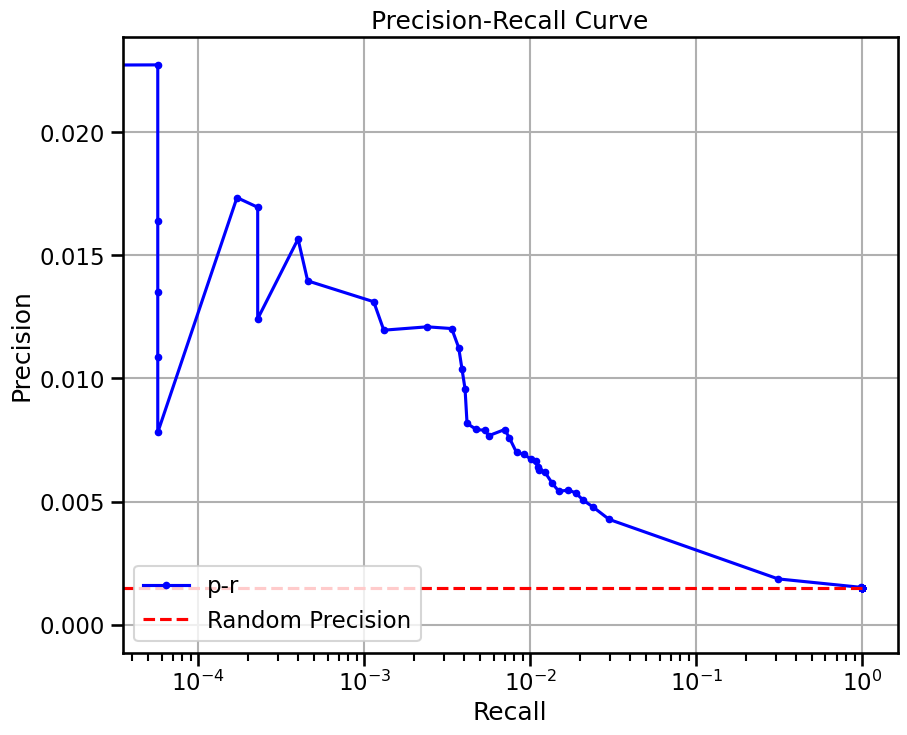

{'enriched_terms_Targets': ['celltype.gmt__CD4+ NKT-like cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Neutrophils'], 'enriched_terms_Regulators': ['celltype.gmt__Smooth muscle cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Plasma B cells', 'celltype.gmt__Memory B cells', 'celltype.gmt__Naive B cells', 'celltype.gmt__Effector CD4+ T cells', 'celltype.gmt__-T cells', 'celltype.gmt__Naive CD4+ T cells', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Myoblasts', 'celltype.gmt__Microglial cells', 'celltype.gmt__Langerhans cells', 'celltype.gmt__Memory CD4+ T cells'], 'significant_enriched_TFtargets': 24.0, 'precision': 0.0014957006057987646, 'recall': 1.0, 'rand_precision': 0.0014961371792388694, 'auprc': 0.0022268273845667264, 'EPR': 5.122857809155146}
genie3_tf

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 39.20 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


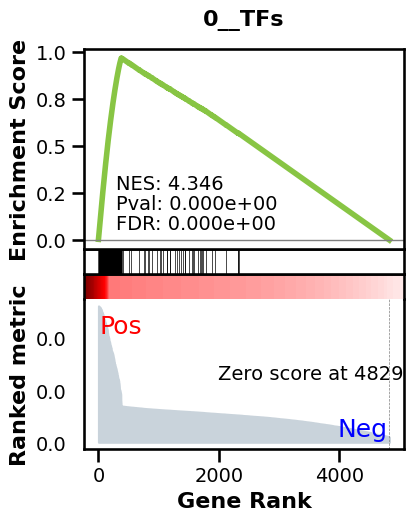

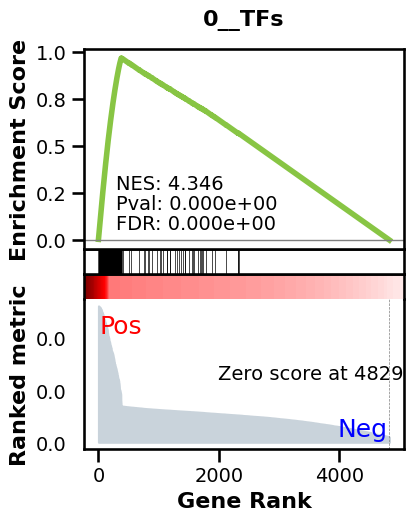

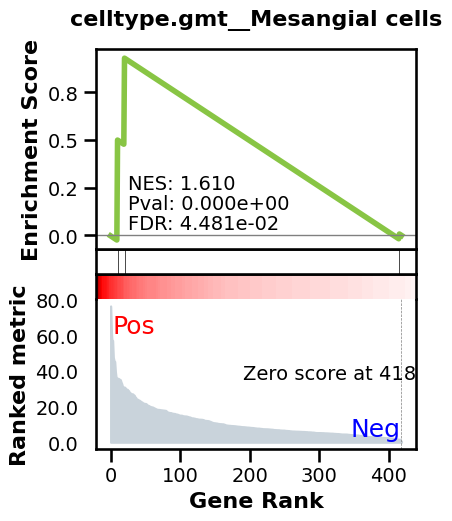

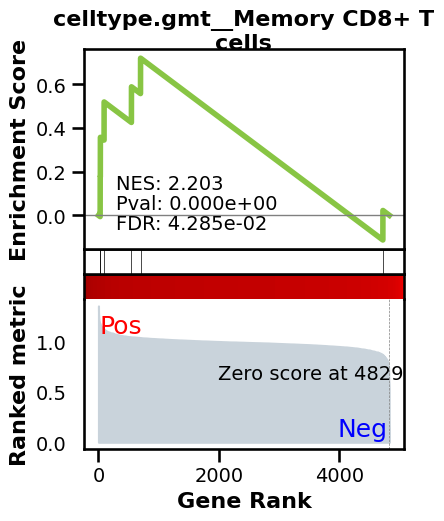

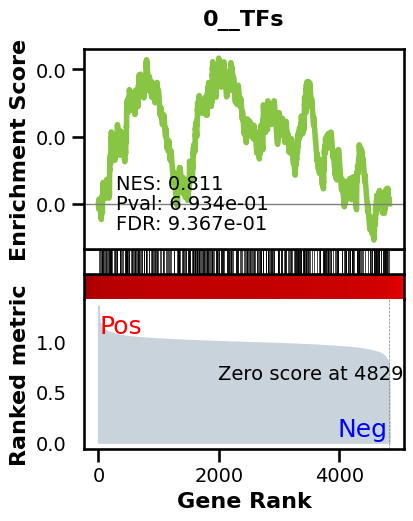

_________________________________________
TF specific enrichment


2024-05-02 21:06:12,940:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 21:06:12,942:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 21:06:13,135:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 3427 genes
intersection pct: 0.7095238095238096
precision:  0.008680763475516589 
recall:  0.37549812137083 
random precision: 0.0014961371792388694


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 45%|████▌     | 45/99 [00:01<00:01, 43.47it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:02<00:00, 45.05it/s]


Area Under Precision-Recall Curve (AUPRC):  0.007315513778830369
EPR: 7.882319337043217


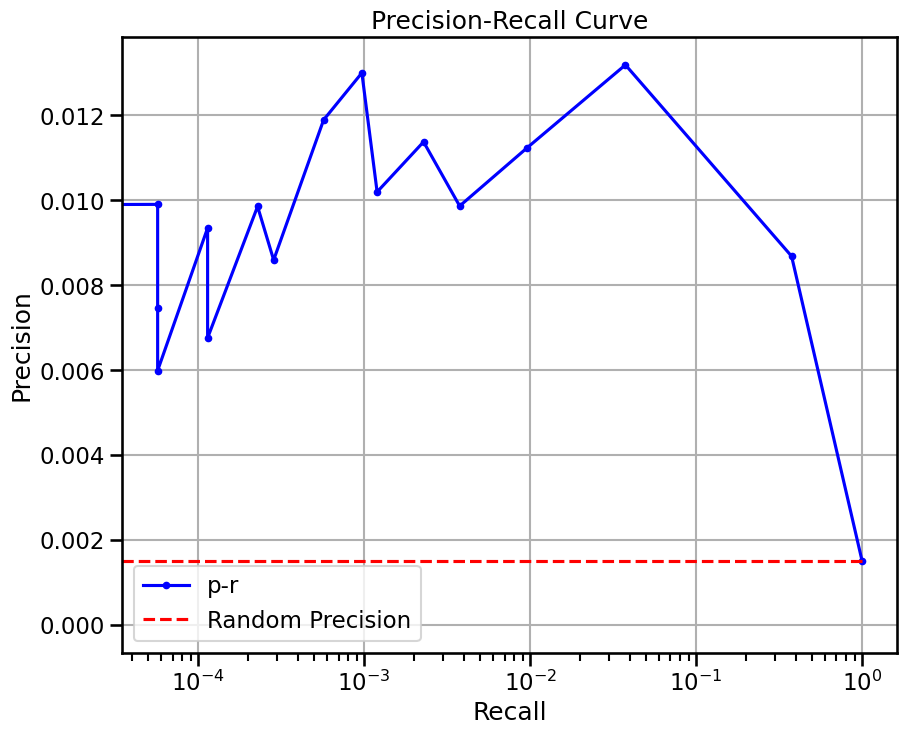

{'enriched_terms_Central': ['0__TFs', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Microfold cells', 'celltype.gmt__Satellite cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Myofibroblasts'], 'enriched_terms_Targets': ['celltype.gmt__Mesangial cells'], 'enriched_terms_Regulators': ['celltype.gmt__Memory CD8+ T cells', 'celltype.gmt__Naive CD8+ T cells', 'celltype.gmt__Effector CD8+ T cells'], 'significant_enriched_TFtargets': 0.0, 'precision': 0.008680763475516589, 'recall': 0.37549812137083, 'rand_precision': 0.0014961371792388694, 'auprc': 0.007315513778830369, 'EPR': 7.882319337043217}
genie3

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 52.48 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


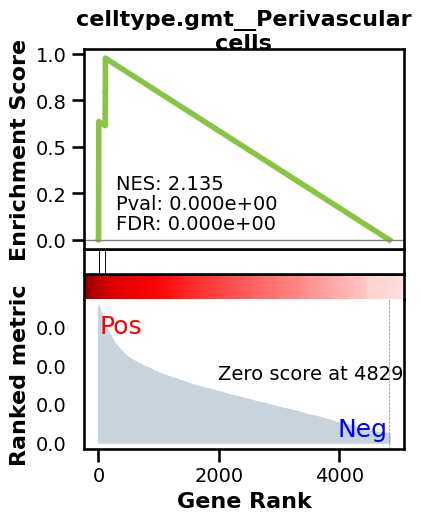

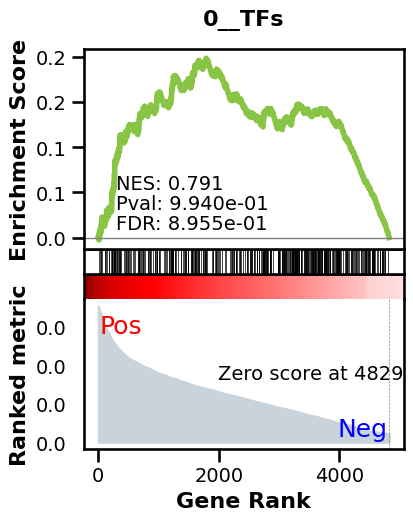

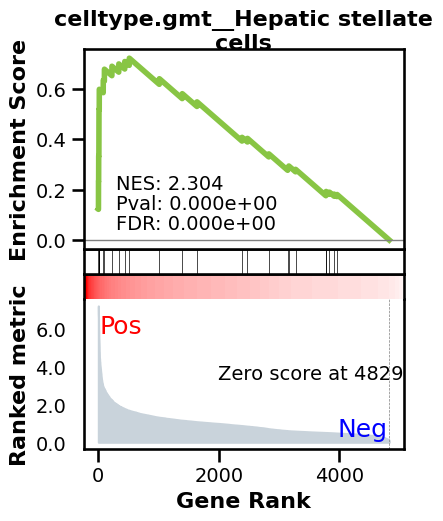

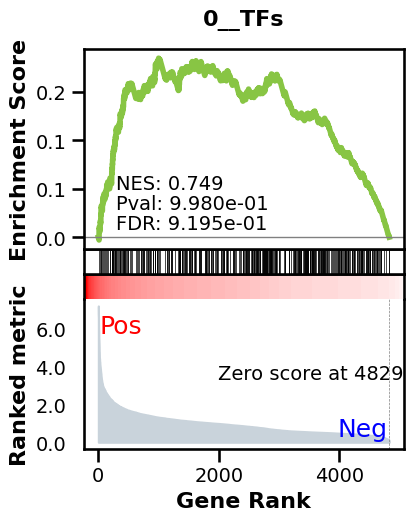

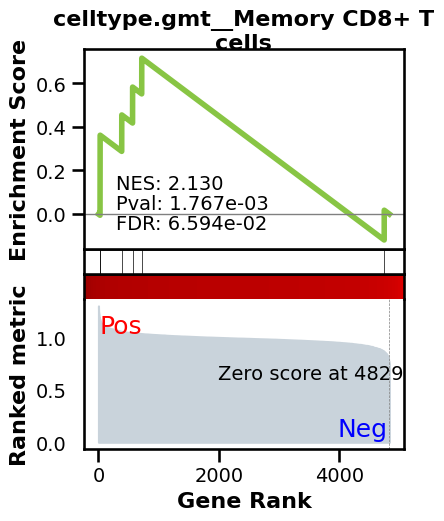

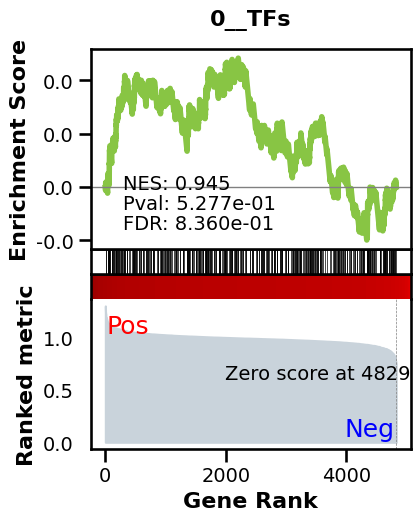

_________________________________________
TF specific enrichment


2024-05-02 21:08:01,145:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 21:08:01,147:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 21:08:01,368:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 3427 genes
intersection pct: 0.7095238095238096
precision:  0.002247843510313483 
recall:  0.272799726744848 
random precision: 0.0014961371792388694


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 44%|████▍     | 44/99 [00:00<00:01, 46.51it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:02<00:00, 44.45it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0019065980377166968
EPR: 0.9892706425060035


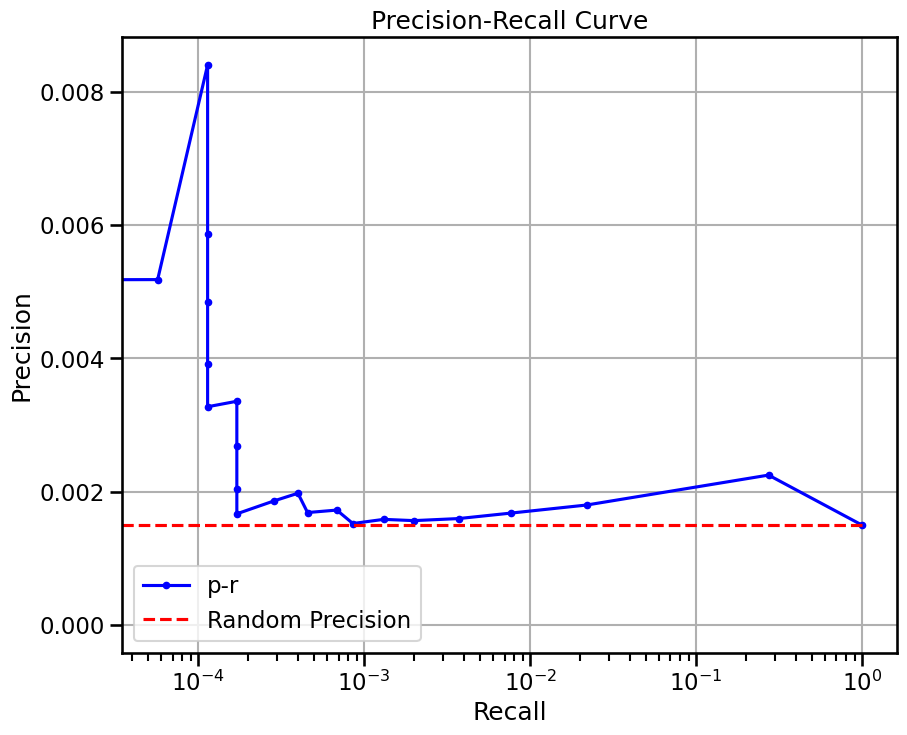

{'enriched_terms_Central': ['celltype.gmt__Perivascular cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Myeloid Dendritic cells', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Plasmacytoid Dendritic cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Endothelial cells'], 'enriched_terms_Targets': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Renal interstitium (Mesenchymal cell

/tmp/ipykernel_231158/4025348686.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


podocyte
scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment


2024-05-02 21:10:17,129:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 21:10:17,131:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 21:10:17,369:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  14.285714285714286 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:23<00:00,  4.10it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:24<00:00,  4.10it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0009756889818673848
EPR: 1.5571126832822308


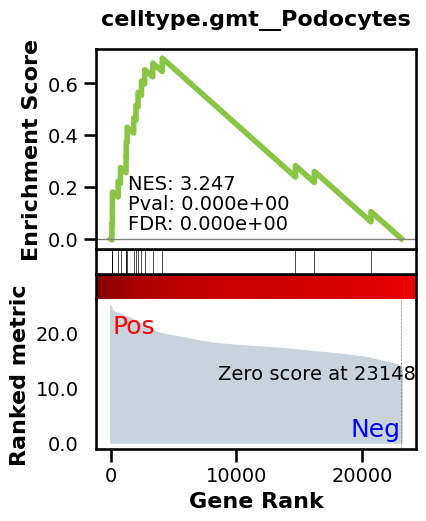

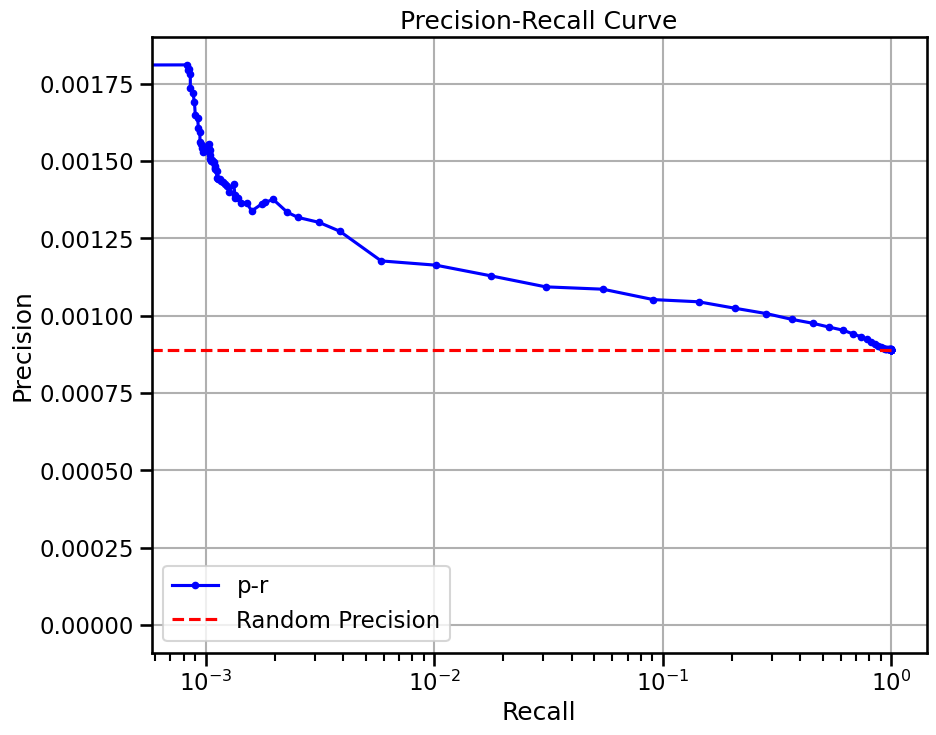

{'enriched_terms_Targets': ['celltype.gmt__Podocytes', 'celltype.gmt__Enteric neurons', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Adipose progenitor cells', 'celltype.gmt__Hepatocytes'], 'significant_enriched_TFtargets': 14.285714285714286, 'precision': 0.0008896322223674437, 'recall': 1.0, 'rand_precision': 0.0008897036558203398, 'auprc': 0.0009756889818673848, 'EPR': 1.5571126832822308}
genie3 TF only

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 126.21 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-02 21:17:18,695:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 21:17:18,697:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 21:17:18,892:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 9531 genes
intersection pct: 0.6892536881689326
precision:  0.00636874263984326 
recall:  0.30499005878284924 
random precision: 0.0010188655938323753


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 48%|████▊     | 48/99 [00:08<00:08,  5.78it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:17<00:00,  5.77it/s]


Area Under Precision-Recall Curve (AUPRC):  0.004541585437428582
EPR: 5.71767210486293


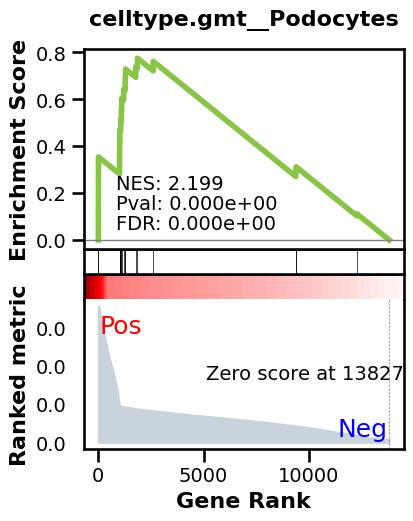

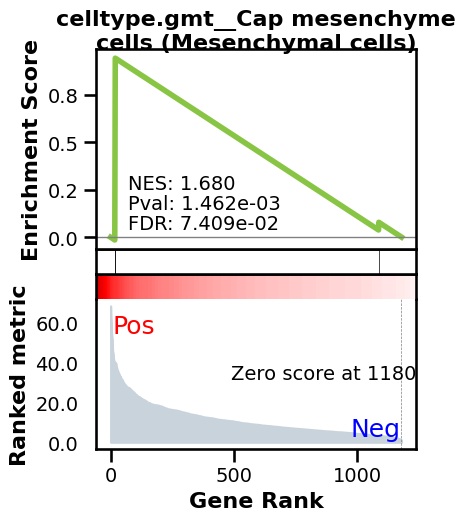

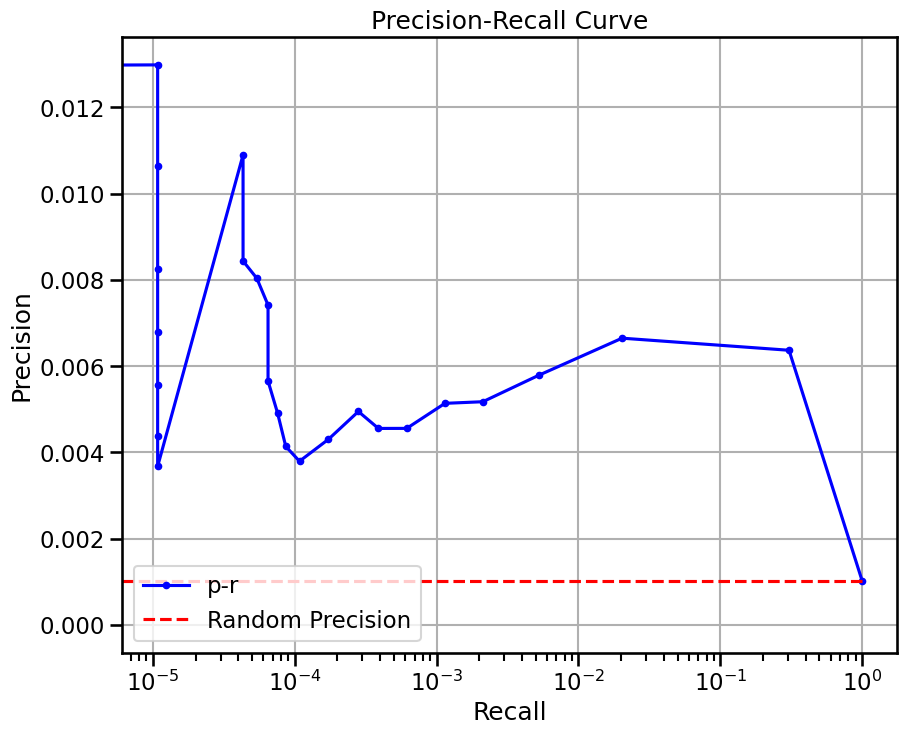

{'enriched_terms_Central': ['celltype.gmt__Podocytes', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Melanocytes', 'celltype.gmt__Microfold cells', 'celltype.gmt__Glycinergic amacrine cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Renal Vesicle cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Satellite cells', 'celltype.gmt__Endometrium', 'celltype.gmt__Gamma (PP) cells', 'celltype.gmt__Hepatoblasts', 'celltype.gmt__Dopaminergic neurons', 'celltype.gmt__Basophils', 'celltype.gmt__Cholinergic GABAergic amacrine cells', 'celltype.gmt__Tachykinin GABAergic amacrine cells', 'celltype.gmt__Starburst amacrine cells', 'celltype.gmt__Horizontal cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__GABAergic amacrine cells', 'celltype.gmt__Microglial cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Endothelial cells', 'celltype.gmt__Sertoli cells', 'celltype.gmt__Radial glial cells', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)'], 'enriched_t

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-02 21:25:14,432:INFO - Downloading and generating Enrichr library gene sets...
2024-05-02 21:25:14,434:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-02 21:25:14,624:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.9615384615384616 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 9531 genes
intersection pct: 0.6892536881689326
precision:  0.001396380146852812 
recall:  0.1509552213001383 
random precision: 0.0010188655938323753


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 49%|████▉     | 49/99 [00:08<00:09,  5.52it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:17<00:00,  5.52it/s]


Area Under Precision-Recall Curve (AUPRC):  0.001211845875698978
EPR: 1.0713201850848724


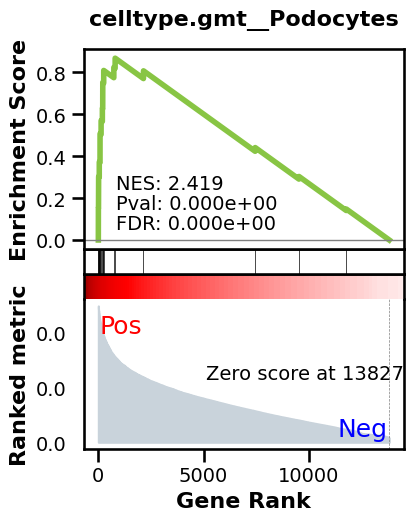

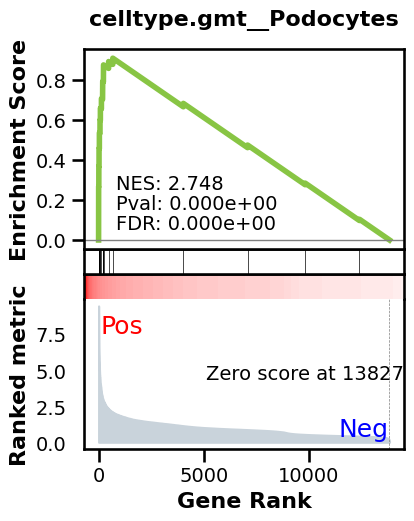

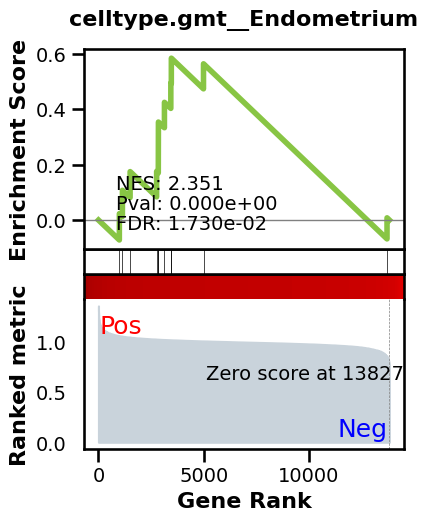

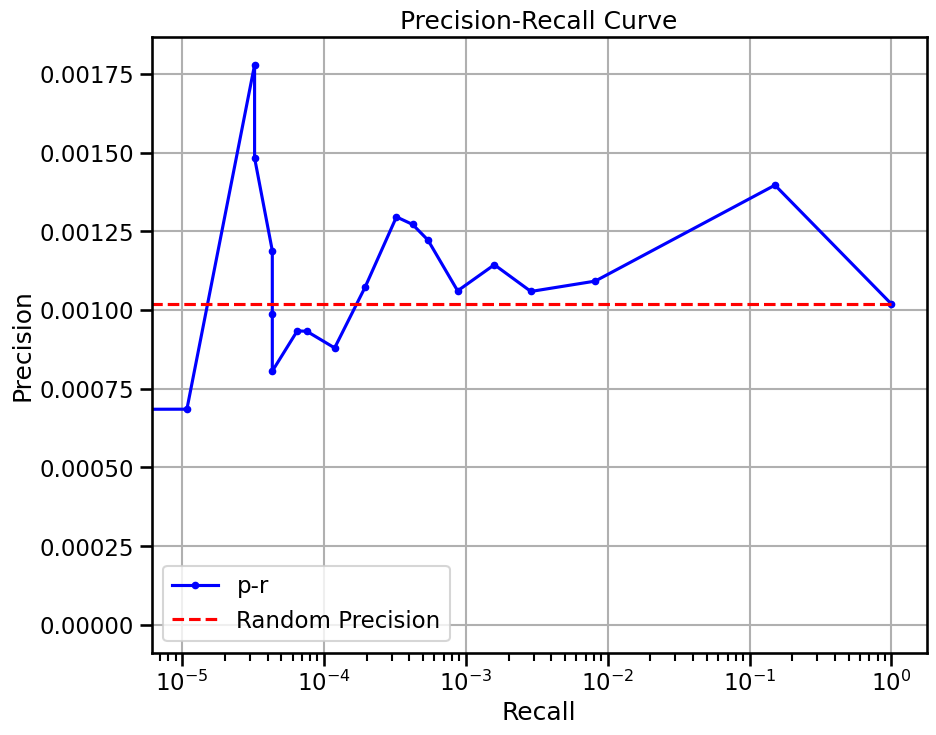

{'enriched_terms_Central': ['celltype.gmt__Podocytes', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Endothelial cells'], 'enriched_terms_Targets': ['celltype.gmt__Podocytes', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Immune cells', 'celltype.gmt__Pulmonary alveolar type I cells', 'celltype.gmt__Radial glial cells', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Neural Progenitor cells', 'celltype.gmt__Horizontal cells', 'celltype.gmt__Adipose progenitor cells', 'celltype.gmt__Parietal cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Glutamatergic neurons', 'celltype.gmt__Stromal cells', 'celltype.gmt__Spermatocytes'], 'enriched_terms_Regulators': ['celltype.gmt__Endometrium', 'celltype.gmt__Mesothelial cells'], 'significant_enriched_TFtargets': 0.9615384615384616, 'precision': 0.001396380146852812, 'recall': 0.1509552213001383, 'rand_precision'

/tmp/ipykernel_231158/4025348686.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:325: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 23639 ...
doing regression....
metrics {'used_heads': 56, 'precision': 0.004903964037597058, 'random_precision': 0.0014024767645218577, 'recall': 0.0007215007215007215, 'predicted_true': 2447.0, 'number_of_true': 16632.0, 'epr': 3.366049354090338}


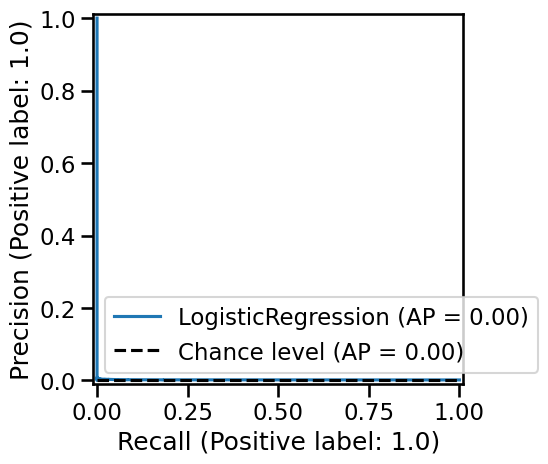

: 

In [11]:
metrics = {}
for celltype in elem:
    grn_inferer = GRNfer(model, adata,
        how="random expr",
        preprocess="softmax",
        head_agg='max',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=3000, 
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print(celltype)
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[8:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_scprint'] = m
    print(m)
    print("genie3 TF only\n")
    subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
    grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_tf'] = m
    print(m)
    print("genie3\n")
    print(subadata)
    signal.signal(signal.SIGALRM, timeout_handler)
    signal.alarm(900)  # set a signal for 15 minutes
    try:
        grn = compute_genie3(subadata, nthreads=32)
        m = BenGRN(grn).scprint_benchmark()
        print(m)
        metrics[celltype+'_genie3'] = m
    except TimeoutException:
        print("The operation didn't finish within 30 minutes.")
    finally:
        signal.alarm(0)  # disable the alarm
    print("______________________________")
    print("now with classifier")
    grn_inferer = GRNfer(model, adata,
        how="most var across",
        preprocess="softmax",
        head_agg='none',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=6000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn, m = train_classifier(grn, C=0.1, train_size=0.3, class_weight={1: 100, 0: 1}, shuffle=False)
    grn.varp['GRN'] = grn.varp['classified']
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    print(m)
    m = BenGRN(grn).scprint_benchmark()
    print(m)
    metrics[celltype+'_scprint_class'] = m
    subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
    print("genie3_tf\n")
    grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_tf_mostvar'] = m
    print(m)
    print("genie3\n")
    grn = compute_genie3(subadata, nthreads=32)
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_mostvar'] = m
    print(m)
    print("__________________________________")

In [8]:
elem = list(set(adata.obs.cell_type) - set([
 'kidney collecting duct principal cell', 
 'mesangial cell',
  'blood vessel smooth muscle cell',
   'podocyte',
 'macrophage',
  'kidney collecting duct intercalated cell',
  
'kidney proximal convoluted tubule epithelial cell',
'kidney distal convoluted tubule epithelial cell',
 'kidney loop of Henle thick ascending limb epithelial cell',
]))
elem

['leukocyte',
 'kidney interstitial fibroblast',
 'endothelial cell',
 'macula densa epithelial cell',
 'kidney granular cell']

/tmp/ipykernel_263526/4025348686.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


leukocyte
scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/torch/utils/tensorboard/__init__.py:4: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if not hasattr(tensorboard, "__version__") or LooseVersion(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/torch/utils/tensorboard/__init__.py:6: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  ) < LooseVersion("1.15"):
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment


2024-05-03 09:16:33,120:INFO - Downloading and generating Enrichr library gene sets...
2024-05-03 09:16:33,131:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-03 09:16:33,364:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  27.678571428571427 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:26<00:00,  3.64it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:26<00:00,  3.67it/s]


Area Under Precision-Recall Curve (AUPRC):  0.000920946301999123
EPR: 1.8270178718818548


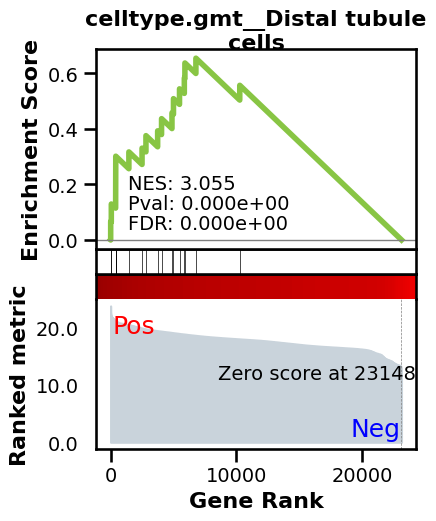

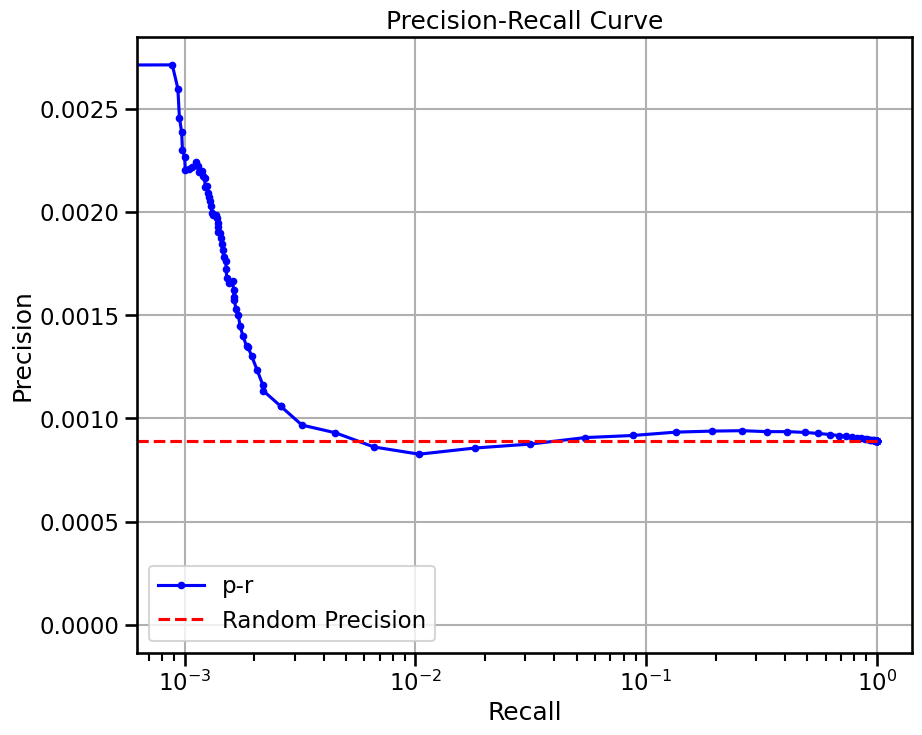

{'enriched_terms_Targets': ['celltype.gmt__Distal tubule cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Podocytes', 'celltype.gmt__Hepatocytes', 'celltype.gmt__Proximal tubule cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Enterocytes', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Myocytes', 'celltype.gmt__Adipose progenitor cells', 'celltype.gmt__Lymphatic Endothelial cells', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Pulmonary alveolar type II cells', 'celltype.gmt__Endometrium', 'celltype.gmt__Adipocytes', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Enteric neurons', 'celltype.gmt__Retinal pigment epithelial cells', 'celltype.gmt__Foveolar cells', 'celltype.gmt__Paneth cells'], 'significant_enriched_TFtargets': 27.678571428571427, 'precision': 0.0008896322223674437, 'recall': 1.0, 'rand_precision': 0.0008897036558203398, 'auprc': 0.000920946301999123, 'EPR': 1.8270178718818

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-03 09:26:37,610:INFO - Downloading and generating Enrichr library gene sets...
2024-05-03 09:26:37,612:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-03 09:26:37,836:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 9744 genes
intersection pct: 0.6916033785222514
precision:  0.006721257867308773 
recall:  0.3102043675814168 
random precision: 0.001052479764428573


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:688: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 48%|████▊     | 48/99 [01:34<02:22,  2.79s/it]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [03:54<00:00,  2.37s/it]


Area Under Precision-Recall Curve (AUPRC):  0.004816946358742323
EPR: 7.1174302207463125


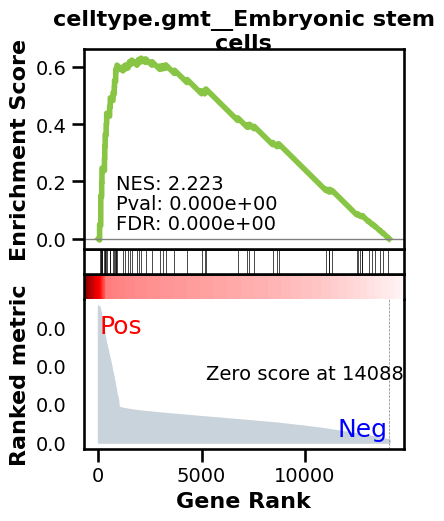

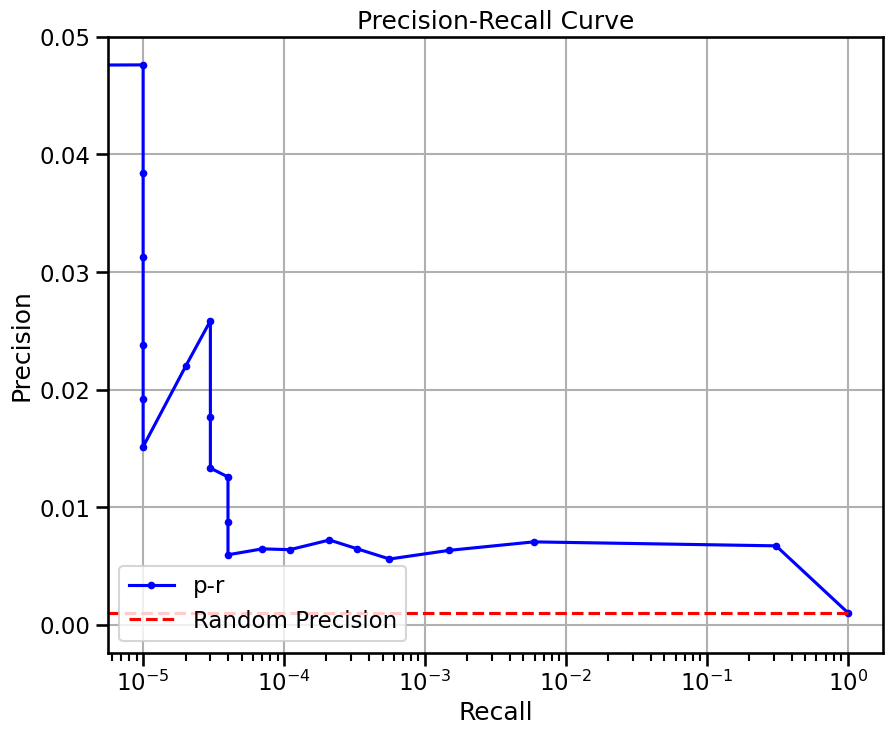

{'enriched_terms_Central': ['celltype.gmt__Embryonic stem cells', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Microfold cells', 'celltype.gmt__Renal Vesicle cells', 'celltype.gmt__Melanocytes', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Satellite cells', 'celltype.gmt__Horizontal cells', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Podocytes', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Glycinergic amacrine cells', 'celltype.gmt__Hepatoblasts', 'celltype.gmt__Proximal tubule cells', 'celltype.gmt__Principal cells (Collecting duct system)', 'celltype.gmt__Foveolar cells'], 'significant_enriched_TFtargets': 0.0, 'precision': 0.006721257867308773, 'recall': 0.3102043675814168, 'rand_precision': 0.001052479764428573, 'auprc': 0.004816946358742323, 'EPR': 7.1174302207463125}
genie3

View of AnnData object

/tmp/ipykernel_263526/4025348686.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

In [9]:
metrics = {}
for celltype in elem:
    grn_inferer = GRNfer(model, adata,
        how="random expr",
        preprocess="softmax",
        head_agg='max',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=3000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print(celltype)
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[8:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_scprint'] = m
    print(m)
    print("genie3 TF only\n")
    subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
    grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_tf'] = m
    print(m)
    print("genie3\n")
    print(subadata)
    signal.signal(signal.SIGALRM, timeout_handler)
    signal.alarm(900)  # set a signal for 15 minutes
    try:
        grn = compute_genie3(subadata, nthreads=32)
        m = BenGRN(grn).scprint_benchmark()
        print(m)
        metrics[celltype+'_genie3'] = m
    except TimeoutException:
        print("The operation didn't finish within 30 minutes.")
    finally:
        signal.alarm(0)  # disable the alarm
    print("______________________________")
    print("now with classifier")
    grn_inferer = GRNfer(model, adata,
        how="most var across",
        preprocess="softmax",
        head_agg='none',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=6000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn, m = train_classifier(grn, C=0.1, train_size=0.3, class_weight={1: 100, 0: 1}, shuffle=False)
    grn.varp['GRN'] = grn.varp['classified']
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    print(m)
    m = BenGRN(grn).scprint_benchmark()
    print(m)    
    metrics[celltype+'_scprint_class'] = m
    subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
    print("genie3_tf\n")
    grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_tf_mostvar'] = m
    print(m)
    print("genie3\n")
    grn = compute_genie3(subadata, nthreads=32)
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_mostvar'] = m
    print(m)
    print("__________________________________")

now with classifier


/tmp/ipykernel_283278/4205974138.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:170: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/torch/utils/tensorboard/__init__.py:4: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if not hasattr(tensorboard, "__version__") or LooseVersion(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/torch/utils/tensorboard/__init__.py:6: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  ) < LooseVersion("1.15"):
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:325: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 4614 ...
doing regression....
metrics {'used_heads': 46, 'precision': 0.00423908435777872, 'random_precision': 0.0009903002260915421, 'recall': 0.004422821760283061, 'predicted_true': 2359.0, 'number_of_true': 2261.0, 'epr': 4.043711096353271}


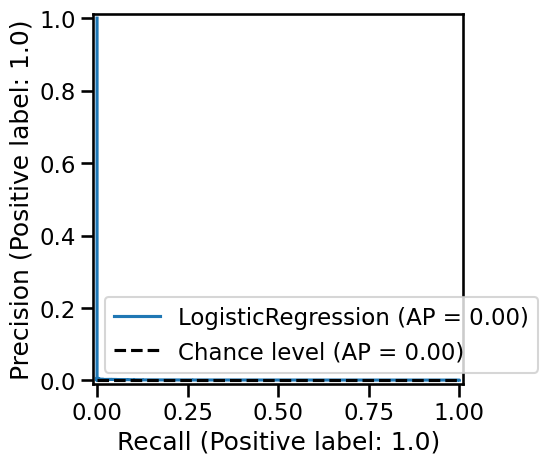

{'used_heads': 46, 'precision': 0.00423908435777872, 'random_precision': 0.0009903002260915421, 'recall': 0.004422821760283061, 'predicted_true': 2359.0, 'number_of_true': 2261.0, 'epr': 4.043711096353271}
base enrichment
Top central genes: []


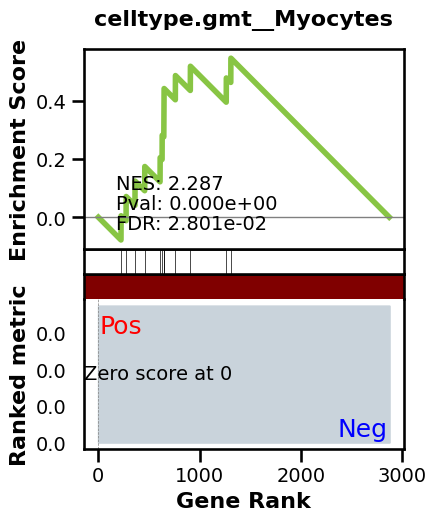

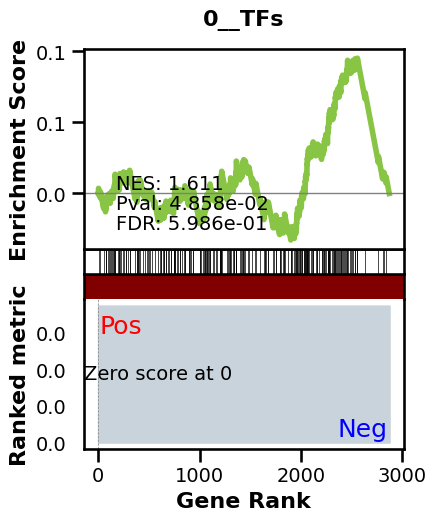

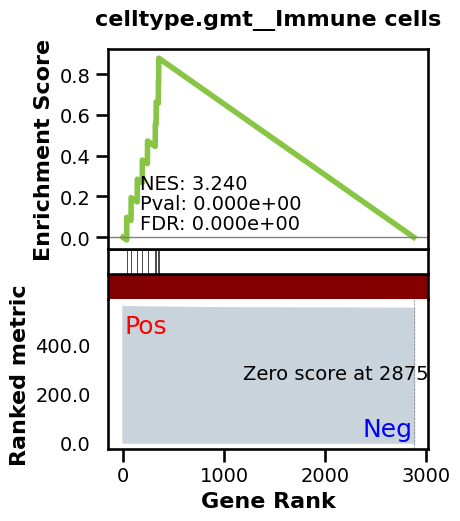

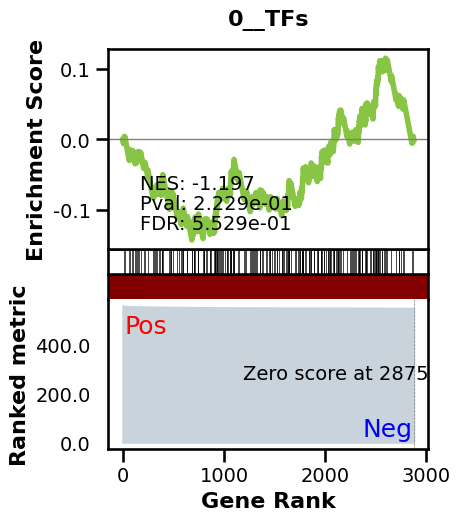

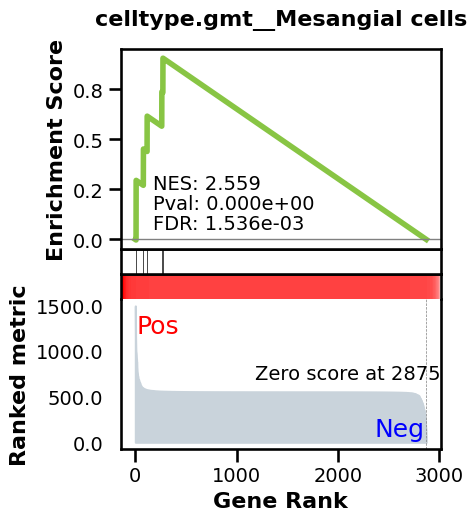

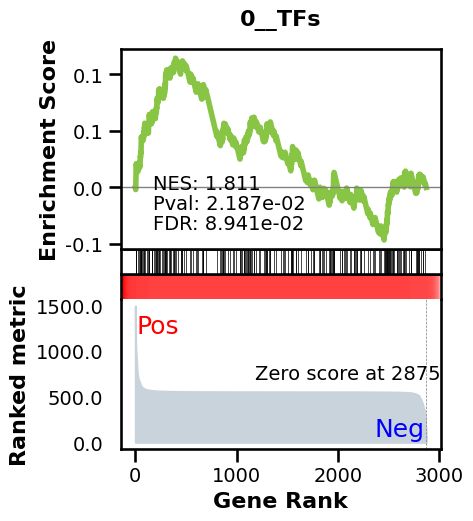

_________________________________________
TF specific enrichment


2024-05-03 10:30:59,513:INFO - Downloading and generating Enrichr library gene sets...
2024-05-03 10:30:59,516:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-03 10:30:59,766:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  10.526315789473685 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:170: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 1806 genes
intersection pct: 0.6279554937413073
precision:  0.0014146275059510013 
recall:  1.0 
random precision: 0.0014154112331011127


 97%|█████████▋| 96/99 [00:00<00:00, 138.51it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:694: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 127.42it/s]


Area Under Precision-Recall Curve (AUPRC):  0.002236663198486636
EPR: 5.2688556663679185


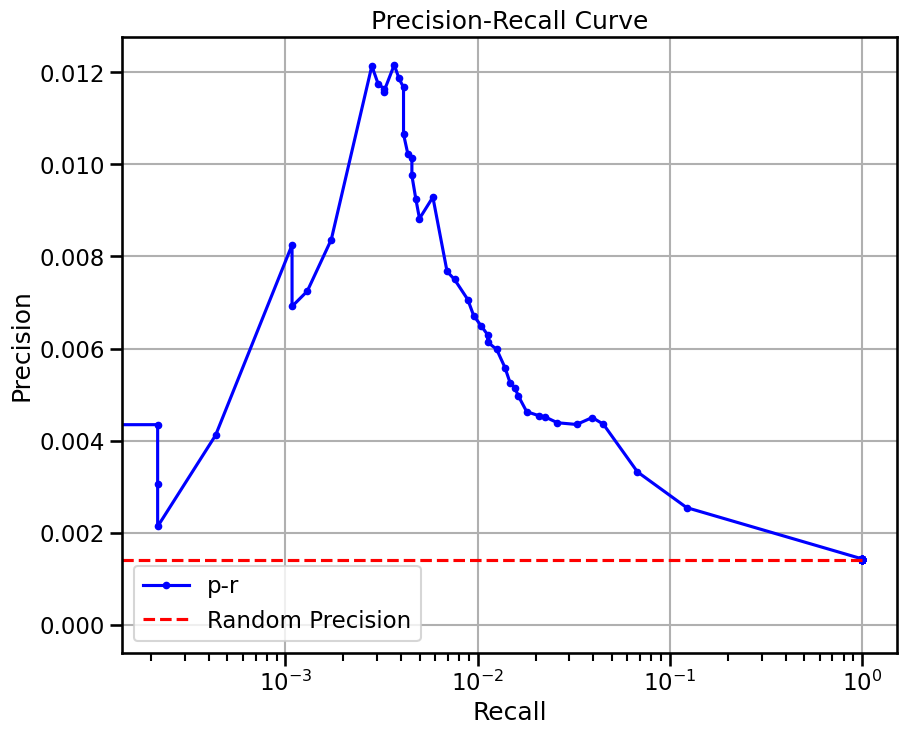

{'enriched_terms_Central': ['celltype.gmt__Myocytes', 'celltype.gmt__Enterocytes'], 'enriched_terms_Targets': ['celltype.gmt__Immune cells', 'celltype.gmt__Naive CD8+ T cells', 'celltype.gmt__Immune system cells', 'celltype.gmt__Effector CD8+ T cells', 'celltype.gmt__CD8+ NKT-like cells', 'celltype.gmt__Non-classical monocytes', 'celltype.gmt__Memory CD8+ T cells', 'celltype.gmt__-T cells', 'celltype.gmt__Intermediate monocytes', 'celltype.gmt__Classical Monocytes', 'celltype.gmt__Effector CD4+ T cells', 'celltype.gmt__Naive CD4+ T cells', 'celltype.gmt__CD4+ NKT-like cells', 'celltype.gmt__Memory CD4+ T cells', 'celltype.gmt__Plasma B cells', 'celltype.gmt__Naive B cells', 'celltype.gmt__Memory B cells', 'celltype.gmt__Pro-B cells', 'celltype.gmt__Kupffer cells', 'celltype.gmt__Pre-B cells', 'celltype.gmt__Microfold cells', 'celltype.gmt__Natural killer cells', 'celltype.gmt__Granulocytes', 'celltype.gmt__Hematopoietic cells', 'celltype.gmt__Neutrophils', 'celltype.gmt__Alveolar macro

NameError: name 'metrics' is not defined

In [6]:
celltype="leukocyte"
print("now with classifier")
grn_inferer = GRNfer(model, adata,
    how="most var across",
    preprocess="softmax",
    head_agg='none',
    filtration="none",
    forward_mode="none",
    organisms=adata.obs['organism_ontology_term_id'][0],
    apc=False,
    symmetrize=False,
    num_genes=6000,
    max_cells=1024,
    doplot=False,
    batch_size=32,
)
print("scprint\n")
grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
grn, m = train_classifier(grn, C=0.1, train_size=0.3, class_weight={1: 100, 0: 1}, shuffle=False)
grn.varp['GRN'] = grn.varp['classified']
grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
print(m)
m = BenGRN(grn).scprint_benchmark()
print(m)    
metrics[celltype+'_scprint_class'] = m
subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
print("genie3_tf\n")
grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
m = BenGRN(grn).scprint_benchmark()
metrics[celltype+'_genie3_tf_mostvar'] = m
print(m)
print("genie3\n")
grn = compute_genie3(subadata, nthreads=32)
m = BenGRN(grn).scprint_benchmark()
metrics[celltype+'_genie3_mostvar'] = m
print(m)
print("__________________________________")

### we have 50% of the omnipath coming from protein interaction type stuff. the model doesn't get necessarily a ton better without it. #
### we have 75% less sources in the transcript only dataset and similar amount of targets. 
### in the end we get that most transcript level ground truth doesn't overlap the ppi level one. so dropping it would help in the results but on both side. and it should not help too much with EPR

In [5]:
elem = ['kidney interstitial fibroblast','endothelial cell']

In [3]:
adata

NameError: name 'adata' is not defined

/tmp/ipykernel_373412/357431744.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


kidney interstitial fibroblast
scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:169: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/torch/utils/tensorboard/__init__.py:4: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if not hasattr(tensorboard, "__version__") or LooseVersion(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/torch/utils/tensorboard/__init__.py:6: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  ) < LooseVersion("1.15"):
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment


2024-05-03 19:02:23,342:INFO - Downloading and generating Enrichr library gene sets...
2024-05-03 19:02:23,346:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-03 19:02:23,569:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  25.892857142857142 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:108: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if i in genes and j in genes:


intersection of 11721 genes
intersection pct: 0.5063285671087304
precision:  0.0005819036884212376 
recall:  1.0 
random precision: 0.0005819533389065977


 98%|█████████▊| 97/99 [00:23<00:00,  4.24it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:661: RuntimeWarning: invalid value encountered in long_scalars
  metrics["auprc"] = auprc
100%|██████████| 99/99 [00:23<00:00,  4.19it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0006382443569628404
EPR: 1.634803634892032


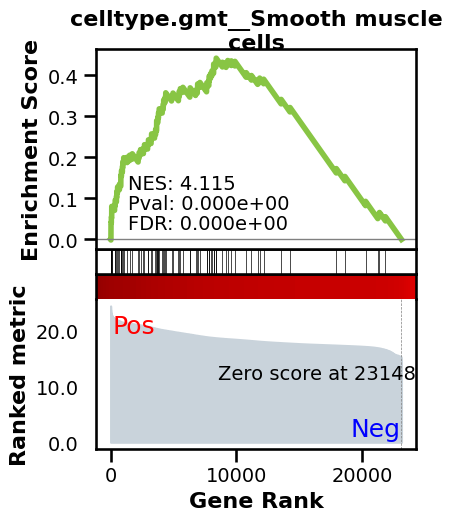

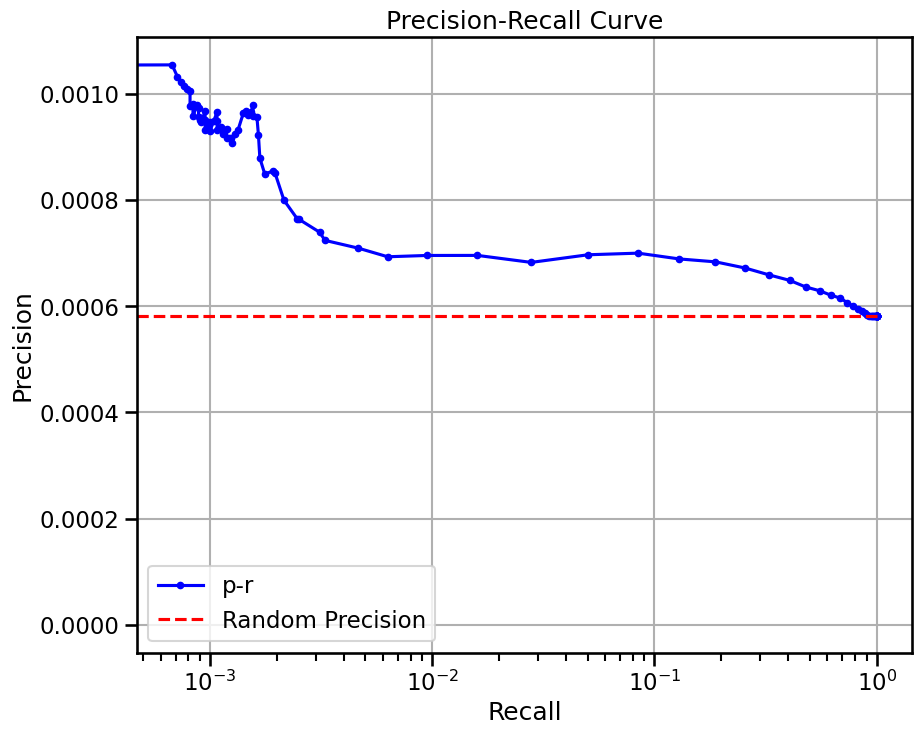

{'enriched_terms_Targets': ['celltype.gmt__Smooth muscle cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Podocytes', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Hepatocytes', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Pericytes', 'celltype.gmt__Enteric neurons', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Acinar cells', 'celltype.gmt__Extracellular matrix cells', 'celltype.gmt__Endometrium', 'celltype.gmt__Pulmonary alveolar type II cells', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Lymphatic Endothelial cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Adipose progenitor cells', 'celltype.gmt__Principal cells (Collecting duct system)', 'celltype.gmt__Myocytes', 'celltype.gmt__Pancreatic stellate cells', 'celltype.gmt__Odontoblasts', 'celltype.gmt__Endothelial', 'celltype.gmt__Clara cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Connecting

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-03 19:08:28,581:INFO - Downloading and generating Enrichr library gene sets...
2024-05-03 19:08:28,583:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-03 19:08:28,790:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:108: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if i in genes and j in genes:


intersection of 8763 genes
intersection pct: 0.6646692961165048
precision:  0.007486053364906692 
recall:  0.4568012936510992 
random precision: 0.0006765440059797811


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:655: RuntimeWarning: invalid value encountered in log10
  if 1.0 not in recall_list:
 48%|████▊     | 48/99 [00:07<00:07,  6.67it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:661: RuntimeWarning: invalid value encountered in long_scalars
  metrics["auprc"] = auprc
100%|██████████| 99/99 [00:14<00:00,  6.61it/s]


Area Under Precision-Recall Curve (AUPRC):  0.005746041198247971
EPR: 11.543575346894515


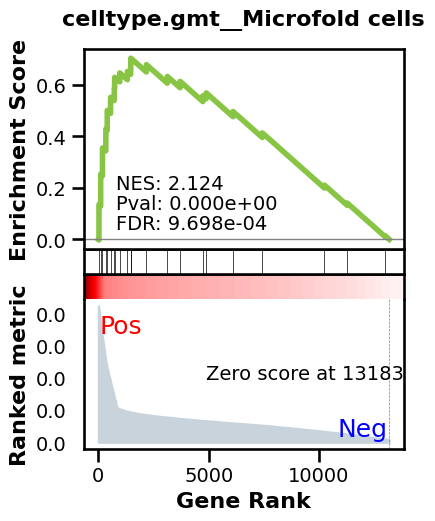

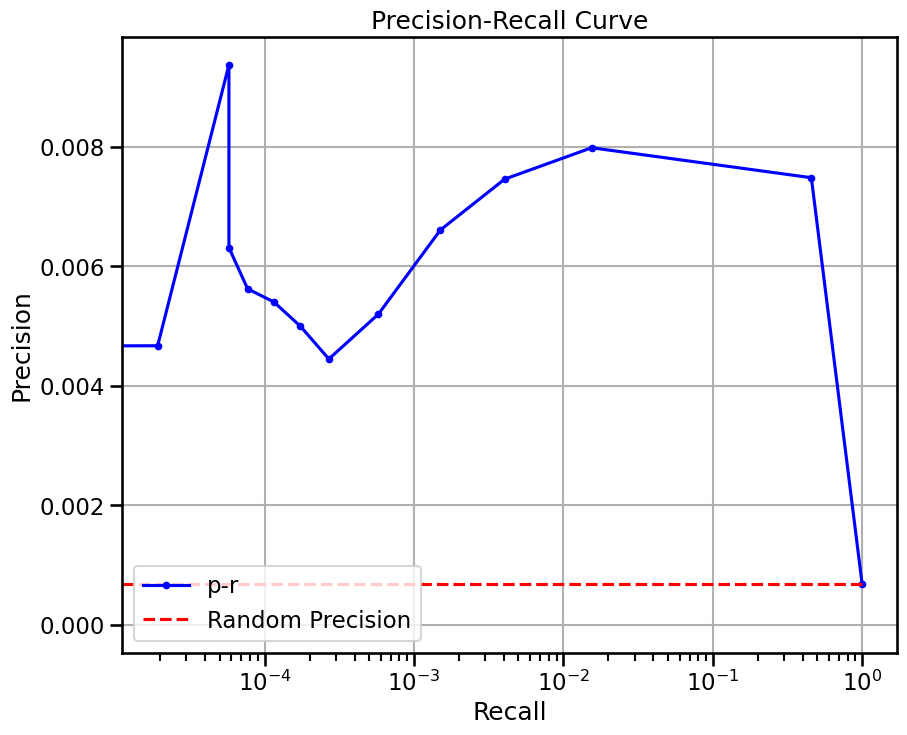

{'enriched_terms_Central': ['celltype.gmt__Microfold cells', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Melanocytes', 'celltype.gmt__Renal Vesicle cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Glycinergic amacrine cells', 'celltype.gmt__Satellite cells', 'celltype.gmt__Horizontal cells', 'celltype.gmt__Hepatoblasts', 'celltype.gmt__Radial glial cells', 'celltype.gmt__Ionocytes', 'celltype.gmt__Endometrium', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Gamma (PP) cells', 'celltype.gmt__Stromal cells', 'celltype.gmt__Leydig cells', 'celltype.gmt__Proximal tubule ce

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []
_________________________________________
TF specific enrichment


2024-05-03 19:14:21,156:INFO - Downloading and generating Enrichr library gene sets...
2024-05-03 19:14:21,158:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-03 19:14:21,359:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  2.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:108: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if i in genes and j in genes:


intersection of 8763 genes
intersection pct: 0.6646692961165048
precision:  0.0009340875766178558 
recall:  0.10349208793747353 
random precision: 0.0006765440059797811


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:655: RuntimeWarning: invalid value encountered in log10
  if 1.0 not in recall_list:
 49%|████▉     | 49/99 [00:07<00:07,  6.78it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:661: RuntimeWarning: invalid value encountered in long_scalars
  metrics["auprc"] = auprc
100%|██████████| 99/99 [00:14<00:00,  6.80it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0008094148505829465
EPR: 1.3094574789965883


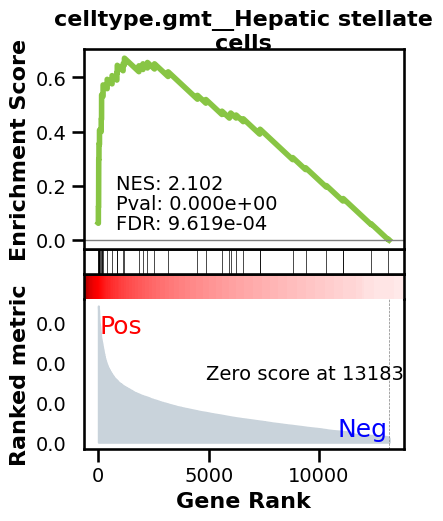

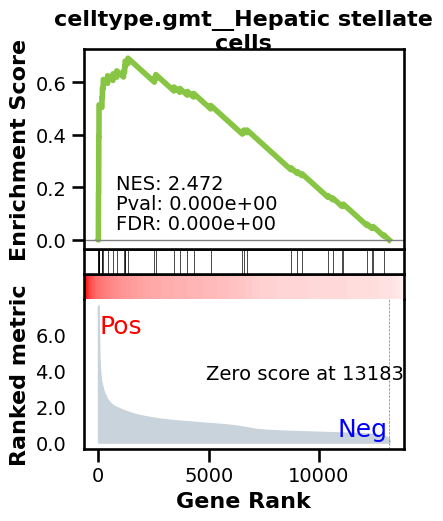

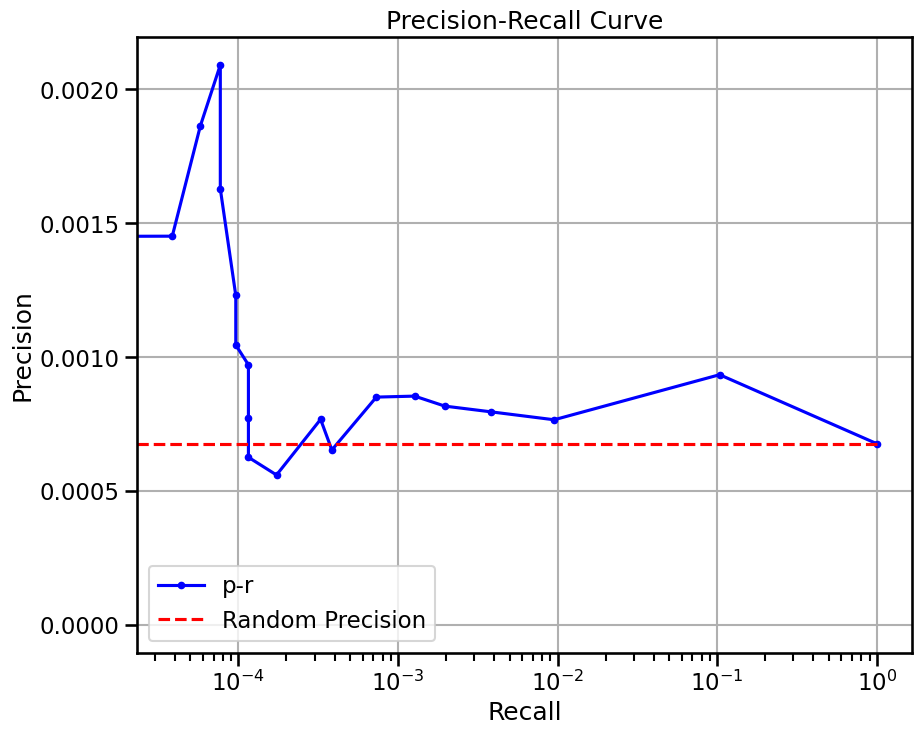

{'enriched_terms_Central': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__-intercalated cells (Collecting duct system)', 'celltype.gmt__Distal tubule cells', 'celltype.gmt__Loop of Henle cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Endothelial cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Principal cells (Collecting duct system)', 'celltype.gmt__Connecting tubule cells', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Horizontal cells', 'celltype.gmt__Proximal tubule cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Immune cells', 'celltype.gmt__Leydig cells', 'celltype.gmt__Glutamatergic neurons', 'celltype.gmt__Radial glial cells', 'celltype.gmt

/tmp/ipykernel_373412/357431744.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:169: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:263: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if i in genes and j in genes:


true elem 17566 ...
doing regression....
metrics {'used_heads': 60, 'precision': 0.006541291905151268, 'random_precision': 0.0013141903977737098, 'recall': 0.00518326545723806, 'predicted_true': 8561.0, 'number_of_true': 10804.0, 'epr': 5.270107658193271}


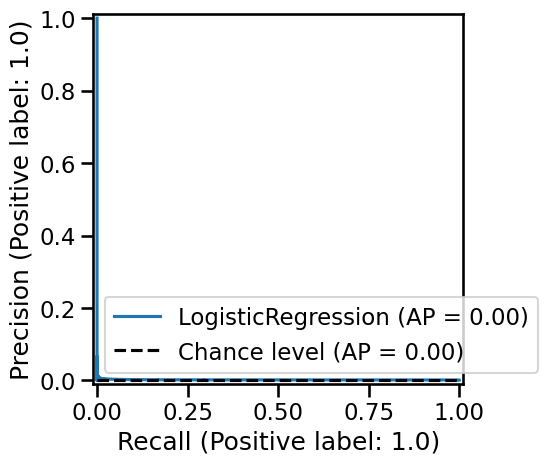

{'used_heads': 60, 'precision': 0.006541291905151268, 'random_precision': 0.0013141903977737098, 'recall': 0.00518326545723806, 'predicted_true': 8561.0, 'number_of_true': 10804.0, 'epr': 5.270107658193271}
base enrichment
Top central genes: []


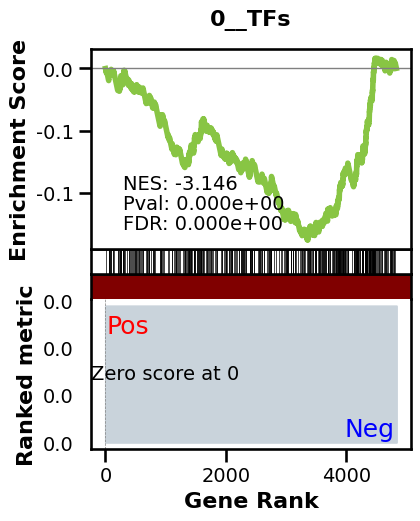

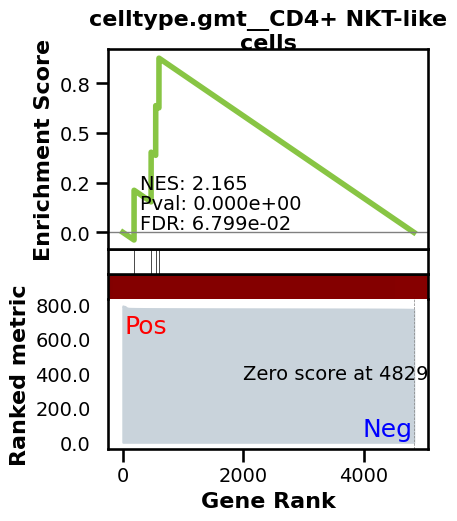

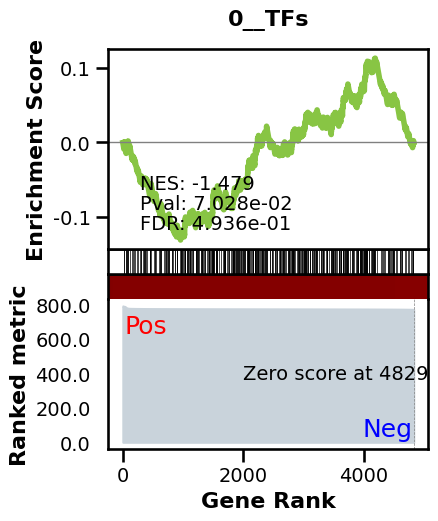

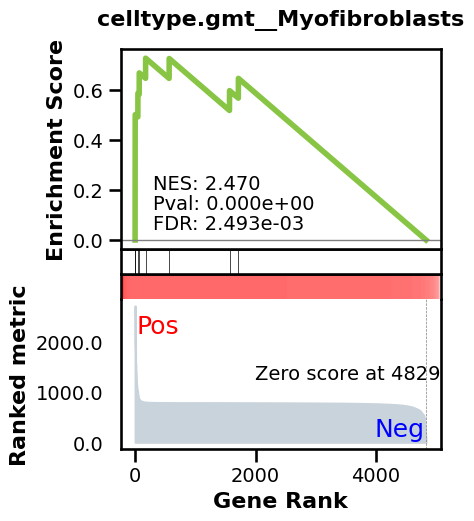

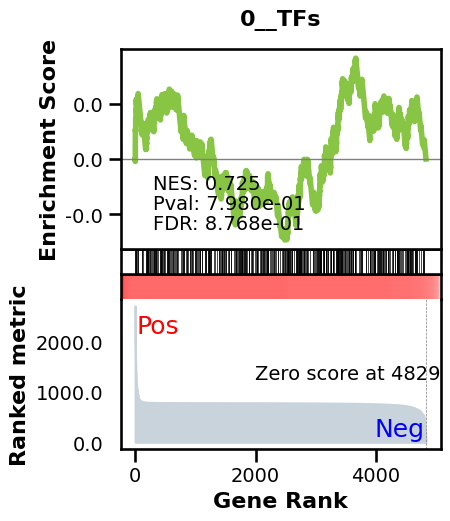

_________________________________________
TF specific enrichment


2024-05-03 19:28:05,254:INFO - Downloading and generating Enrichr library gene sets...
2024-05-03 19:28:05,262:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-03 19:28:05,455:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  24.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:108: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if i in genes and j in genes:


intersection of 3274 genes
intersection pct: 0.6778467908902691
precision:  0.0009484959337913081 
recall:  1.0 
random precision: 0.0009487857278437956


 94%|█████████▍| 93/99 [00:01<00:00, 52.90it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:661: RuntimeWarning: invalid value encountered in long_scalars
  metrics["auprc"] = auprc
100%|██████████| 99/99 [00:02<00:00, 48.51it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0015828049943099678
EPR: 5.647233311928809


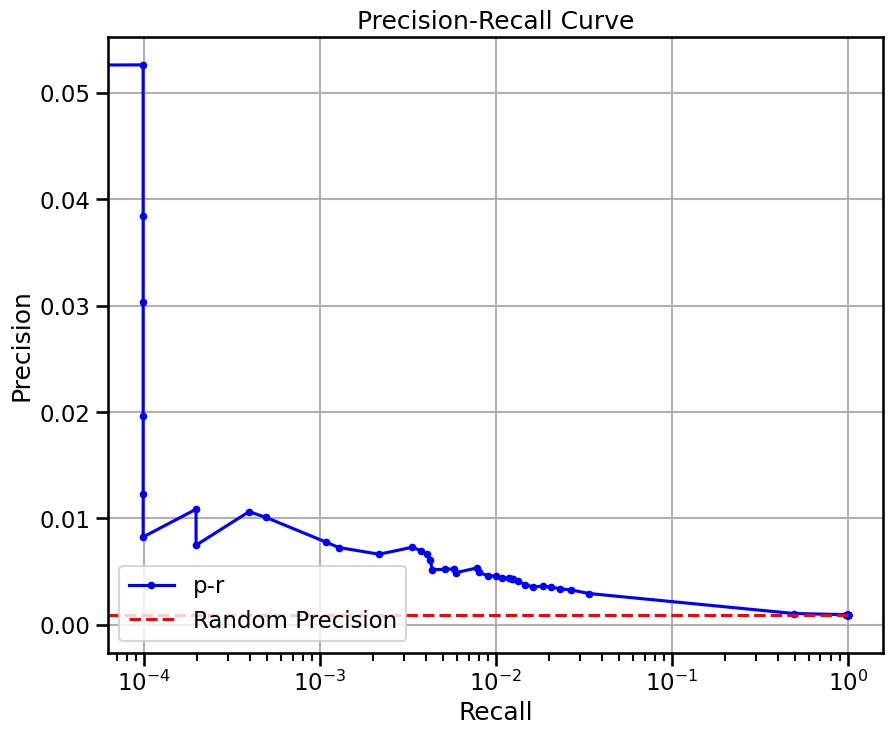

{'enriched_terms_Targets': ['celltype.gmt__CD4+ NKT-like cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Neutrophils'], 'enriched_terms_Regulators': ['celltype.gmt__Myofibroblasts', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Plasma B cells', 'celltype.gmt__Memory B cells', 'celltype.gmt__Naive B cells', 'celltype.gmt__-T cells', 'celltype.gmt__Effector CD4+ T cells', 'celltype.gmt__Naive CD4+ T cells', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Myoblasts', 'celltype.gmt__Microglial cells', 'celltype.gmt__Langerhans cells', 'celltype.gmt__Memory CD4+ T cells'], 'significant_enriched_TFtargets': 24.0, 'precision': 0.0009484959337913081, 'recall': 1.0, 'rand_precision': 0.0009487857278437956, 'auprc': 0.0015828049943099678, 'EPR': 5.647233311928809}
genie3_tf

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 37.83 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


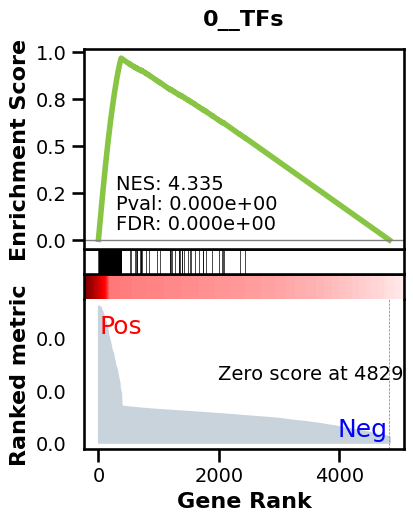

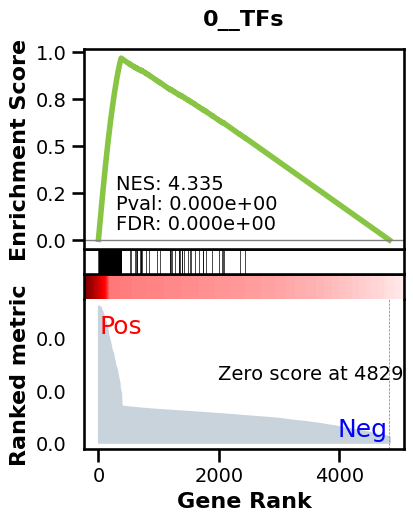

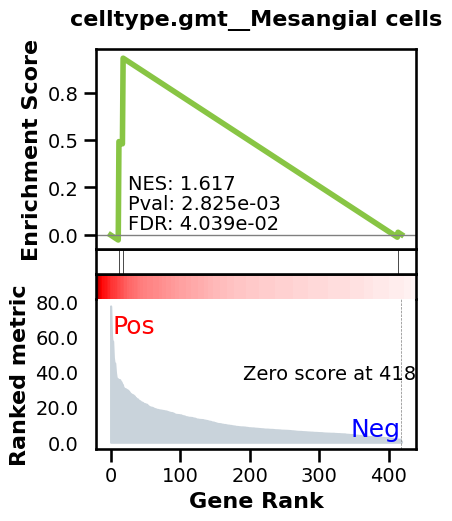

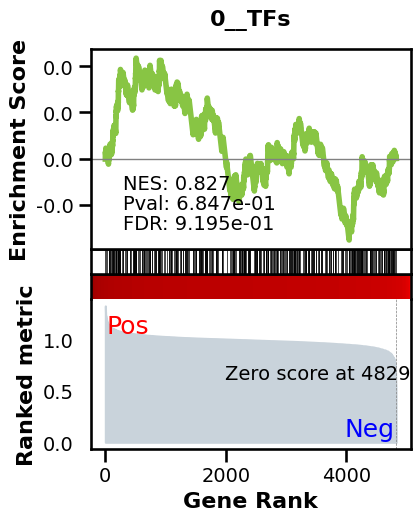

_________________________________________
TF specific enrichment


2024-05-03 19:29:40,946:INFO - Downloading and generating Enrichr library gene sets...
2024-05-03 19:29:40,957:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-03 19:29:41,174:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:108: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if i in genes and j in genes:


intersection of 3274 genes
intersection pct: 0.6778467908902691
precision:  0.008591436541375461 
recall:  0.6101111438969214 
random precision: 0.0009487857278437956


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:655: RuntimeWarning: divide by zero encountered in log10
  if 1.0 not in recall_list:
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
 46%|████▋     | 46/99 [00:00<00:01, 51.25it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:661: RuntimeWarning: invalid value encountered in long_scalars
  metrics["auprc"] = auprc
100%|██████████| 99/99 [00:01<00:00, 51.12it/s]


Area Under Precision-Recall Curve (AUPRC):  0.008937629150909393
EPR: 12.389628425038984


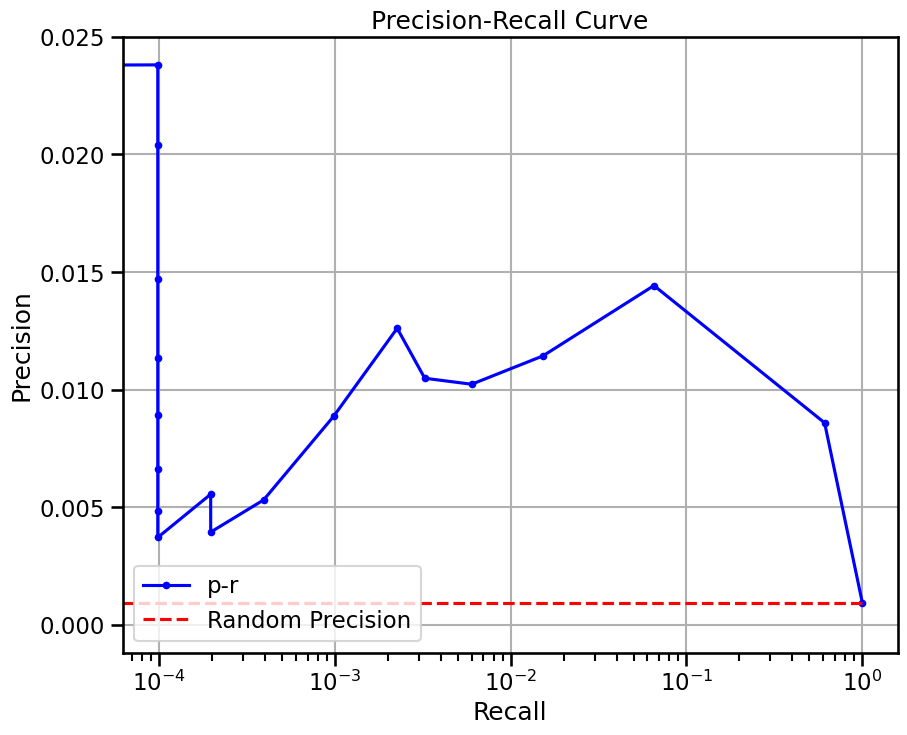

{'enriched_terms_Central': ['0__TFs', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Microfold cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Hepatoblasts', 'celltype.gmt__Satellite cells', 'celltype.gmt__Renal interstitium (Mesenchymal cells)'], 'enriched_terms_Targets': ['celltype.gmt__Mesangial cells'], 'significant_enriched_TFtargets': 0.0, 'precision': 0.008591436541375461, 'recall': 0.6101111438969214, 'rand_precision': 0.0009487857278437956, 'auprc': 0.008937629150909393, 'EPR': 12.389628425038984}
genie3

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 52.41 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


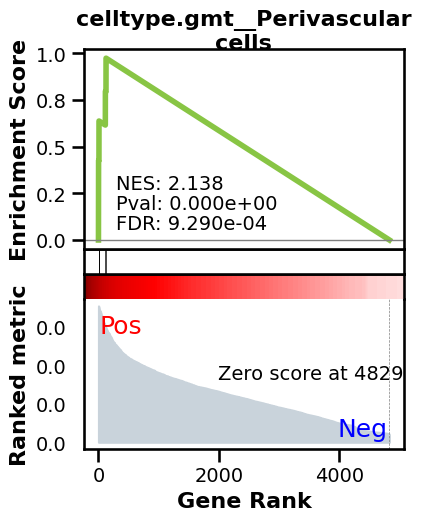

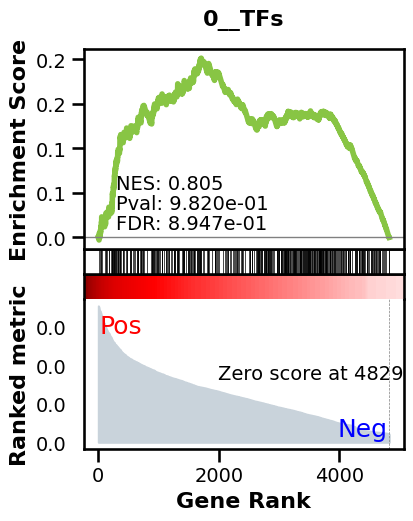

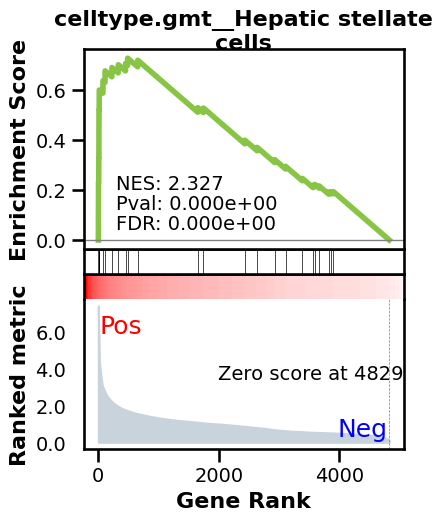

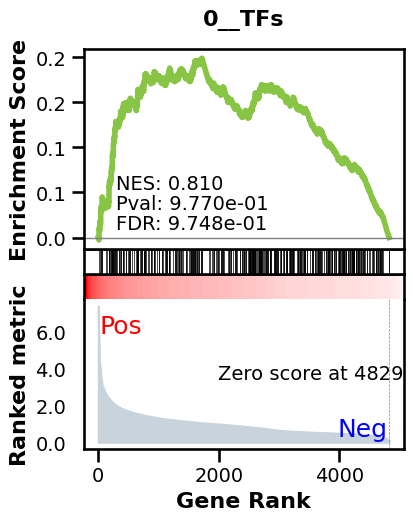

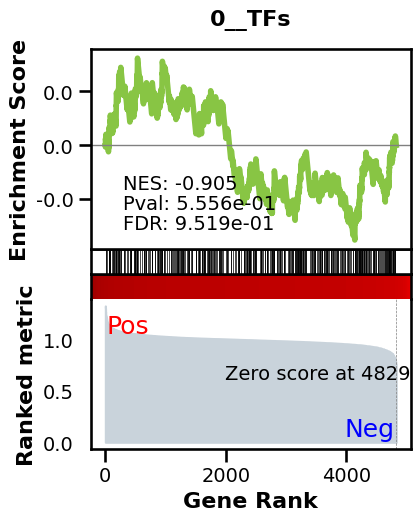

_________________________________________
TF specific enrichment


2024-05-03 19:31:26,089:INFO - Downloading and generating Enrichr library gene sets...
2024-05-03 19:31:26,091:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-03 19:31:26,276:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:108: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if i in genes and j in genes:


intersection of 3274 genes
intersection pct: 0.6778467908902691
precision:  0.001351206508815841 
recall:  0.26782728435133274 
random precision: 0.0009487857278437956


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:655: RuntimeWarning: invalid value encountered in log10
  if 1.0 not in recall_list:
 46%|████▋     | 46/99 [00:00<00:01, 52.00it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:661: RuntimeWarning: invalid value encountered in long_scalars
  metrics["auprc"] = auprc
100%|██████████| 99/99 [00:01<00:00, 51.33it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0011977270299739868
EPR: 1.3485571460877317


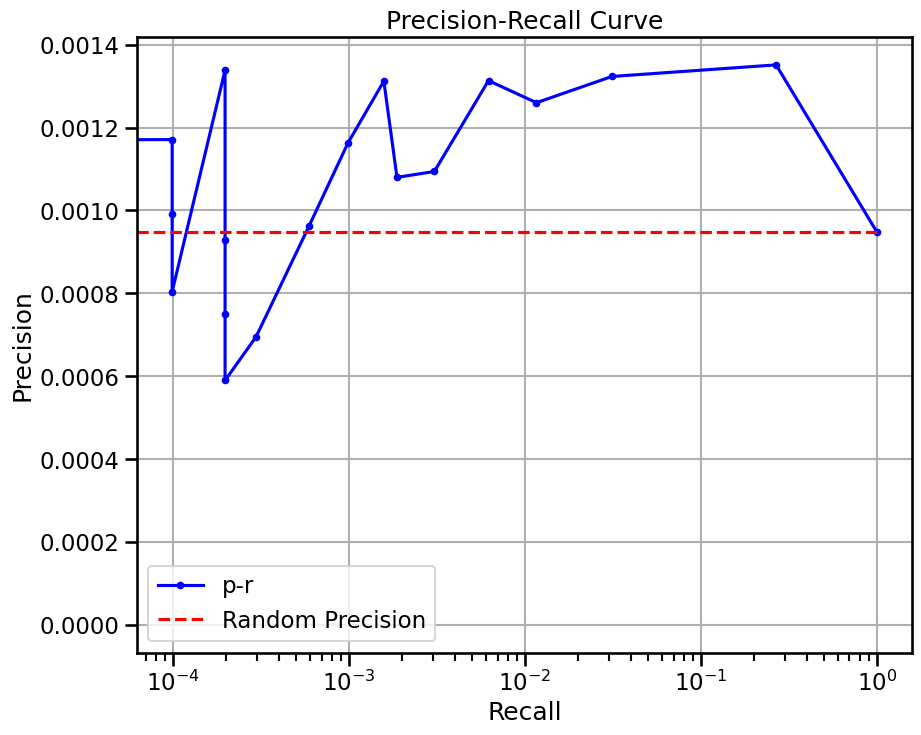

{'enriched_terms_Central': ['celltype.gmt__Perivascular cells', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Cap mesenchyme cells (Mesenchymal cells)', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Embryonic stem cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Vascular smooth muscle cells', 'celltype.gmt__Plasmacytoid Dendritic cells', 'celltype.gmt__Myeloid Dendritic cells', 'celltype.gmt__Fibroblasts', 'celltype.gmt__Endothelial cells', 'celltype.gmt__Renal interstitium (Mesenchymal cells)'], 'enriched_terms_Targets': ['celltype.gmt__Hepatic stellate cells', 'celltype.gmt__Myofibroblasts', 'celltype.gmt__Smooth Muscle cells', 'celltype.gmt__Myoepithelial cells', 'celltype.gmt__Perivascular cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Renal interstitium (Mesenchymal cell

/tmp/ipykernel_373412/357431744.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


endothelial cell
scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:169: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment


2024-05-03 19:33:42,583:INFO - Downloading and generating Enrichr library gene sets...
2024-05-03 19:33:42,586:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-03 19:33:42,820:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  18.75 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:108: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if i in genes and j in genes:


intersection of 11721 genes
intersection pct: 0.5063285671087304
precision:  0.0005819036884212376 
recall:  1.0 
random precision: 0.0005819533389065977


 98%|█████████▊| 97/99 [00:21<00:00,  4.57it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:661: RuntimeWarning: invalid value encountered in long_scalars
  metrics["auprc"] = auprc
100%|██████████| 99/99 [00:21<00:00,  4.56it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0005913390754530389
EPR: 1.893499643264647


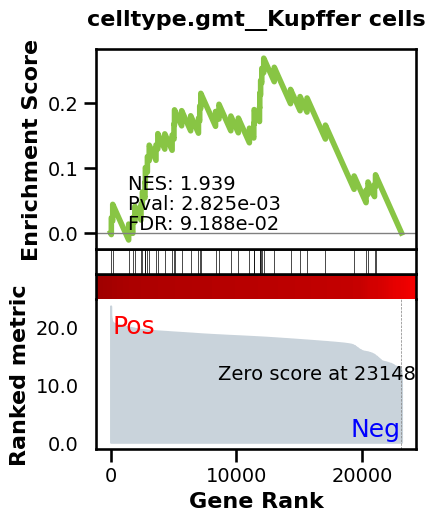

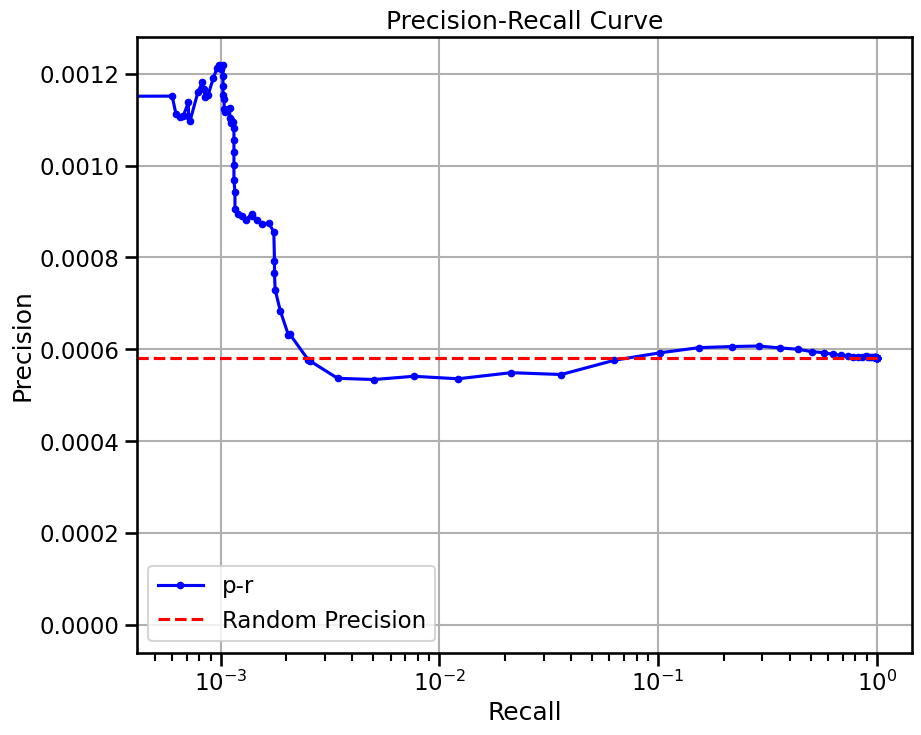

{'enriched_terms_Targets': ['celltype.gmt__Kupffer cells', 'celltype.gmt__Proximal tubule cells'], 'significant_enriched_TFtargets': 18.75, 'precision': 0.0005819036884212376, 'recall': 1.0, 'rand_precision': 0.0005819533389065977, 'auprc': 0.0005913390754530389, 'EPR': 1.893499643264647}
genie3 TF only


genie3 TF only

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads


In [9]:
metrics = {}
for celltype in elem:
    grn_inferer = GRNfer(model, adata,
        how="random expr",
        preprocess="softmax",
        head_agg='max',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=3000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print(celltype)
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[8:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_scprint'] = m
    print(m)
    print("genie3 TF only\n")
    subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
    grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_tf'] = m
    print(m)
    print("genie3\n")
    print(subadata)
    signal.signal(signal.SIGALRM, timeout_handler)
    signal.alarm(900)  # set a signal for 15 minutes
    try:
        grn = compute_genie3(subadata, nthreads=32)
        m = BenGRN(grn).scprint_benchmark()
        print(m)
        metrics[celltype+'_genie3'] = m
    except TimeoutException:
        print("The operation didn't finish within 30 minutes.")
    finally:
        signal.alarm(0)  # disable the alarm
    print("______________________________")
    print("now with classifier")
    grn_inferer = GRNfer(model, adata,
        how="most var across",
        preprocess="softmax",
        head_agg='none',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=6000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn, m = train_classifier(grn, C=0.1, train_size=0.3, class_weight={1: 100, 0: 1}, shuffle=False)
    grn.varp['GRN'] = grn.varp['classified']
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    print(m)
    m = BenGRN(grn).scprint_benchmark()
    print(m)    
    metrics[celltype+'_scprint_class'] = m
    subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
    print("genie3_tf\n")
    grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_tf_mostvar'] = m
    print(m)
    print("genie3\n")
    grn = compute_genie3(subadata, nthreads=32)
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_mostvar'] = m
    print(m)
    print("__________________________________")

In [6]:
elem = ['kidney interstitial fibroblast','endothelial cell']

In [9]:
metrics = {}
for celltype in elem[1:]:
    grn_inferer = GRNfer(model, adata,
        how="random expr",
        preprocess="softmax",
        head_agg='max',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=3000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print(celltype)
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[8:], cell_type=celltype)
#    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
#    m = BenGRN(grn).scprint_benchmark()
#    metrics[celltype+'_scprint'] = m
#    print(m)
    print("genie3 TF only\n")
    subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
    grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_tf'] = m
    print(m)
    print("genie3\n")
    print(subadata)
    signal.signal(signal.SIGALRM, timeout_handler)
    signal.alarm(900)  # set a signal for 15 minutes
    try:
        grn = compute_genie3(subadata, nthreads=32)
        m = BenGRN(grn).scprint_benchmark()
        print(m)
        metrics[celltype+'_genie3'] = m
    except TimeoutException:
        print("The operation didn't finish within 30 minutes.")
    finally:
        signal.alarm(0)  # disable the alarm
    print("______________________________")
    print("now with classifier")
    grn_inferer = GRNfer(model, adata,
        how="most var across",
        preprocess="softmax",
        head_agg='none',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=6000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn, m = train_classifier(grn, C=0.1, train_size=0.3, class_weight={1: 100, 0: 1}, shuffle=False)
    grn.varp['GRN'] = grn.varp['classified']
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    print(m)
    m = BenGRN(grn).scprint_benchmark()
    print(m)    
    metrics[celltype+'_scprint_class'] = m
    subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
    print("genie3_tf\n")
    grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_tf_mostvar'] = m
    print(m)
    print("genie3\n")
    grn = compute_genie3(subadata, nthreads=32)
    m = BenGRN(grn).scprint_benchmark()
    metrics[celltype+'_genie3_mostvar'] = m
    print(m)
    print("__________________________________")

/tmp/ipykernel_404303/3524466294.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


endothelial cell
scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:169: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
genie3 TF only

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads


KeyboardInterrupt: 

In [11]:
len(grn_inferer.curr_genes)#model.get_attention_layer

1637

In [16]:
grn_inferer.aggregate(grn_inferer.model.attn.get())

> /home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py(220)aggregate()
    218         import /home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py(220)aggregate()
    218         import pdb
    219         pdb.set_trace()
--> 220         attns = None
    221         Qs = (
    222             attn[:, :, 0, :, :]



In [6]:
elem = ['kidney interstitial fibroblast','endothelial cell']

In [32]:
metrics = {}
for celltype in elem[1:]:
    print("now with classifier")
    grn_inferer = GRNfer(model, adata[adata.X.sum(1)>500],
        how="most var across",
        preprocess="softmax",
        head_agg='max',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=6000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    #grn, m = train_classifier(grn, C=0.1, train_size=0.3, class_weight={1: 100, 0: 1}, shuffle=False)
    #grn.varp['GRN'] = grn.varp['classified']
    #grn.var.index = make_index_unique(grn.var['symbol'].astype(str))

now with classifier


/tmp/ipykernel_518723/4171717618.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:169: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

avg link count: 9406489, sparsity: 1.0



now with classifier


/tmp/ipykernel_518723/121659448.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
Using 16bit Automatic Mixed Precision (AMP)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


scprint



/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:169: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/torch/utils/tensorboard/__init__.py:4: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if not hasattr(tensorboard, "__version__") or LooseVersion(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/torch/utils/tensorboard/__init__.py:6: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  ) < LooseVersion("1.15"):
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:265: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 6548 ...
doing regression....
metrics {'used_heads': 46, 'precision': 0.007018992568125516, 'random_precision': 0.0015896529573117201, 'recall': 0.007495590828924162, 'predicted_true': 4844.0, 'number_of_true': 4536.0, 'epr': 4.344748134087048}


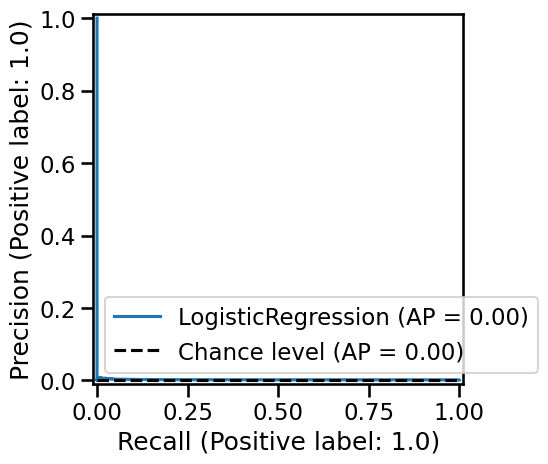

{'used_heads': 46, 'precision': 0.007018992568125516, 'random_precision': 0.0015896529573117201, 'recall': 0.007495590828924162, 'predicted_true': 4844.0, 'number_of_true': 4536.0, 'epr': 4.344748134087048}
base enrichment
Top central genes: []


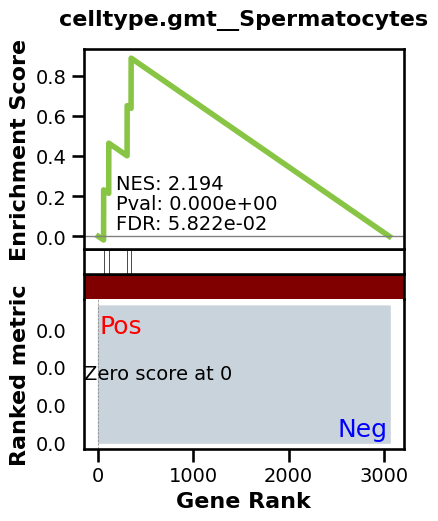

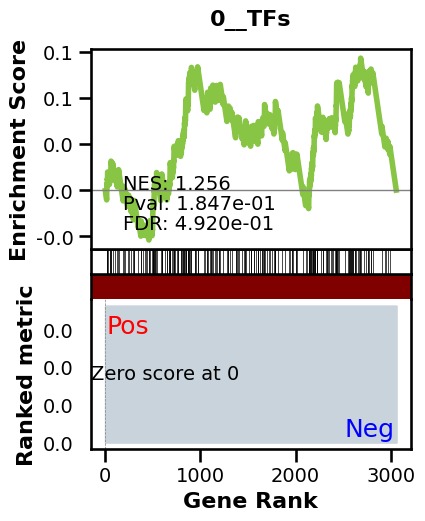

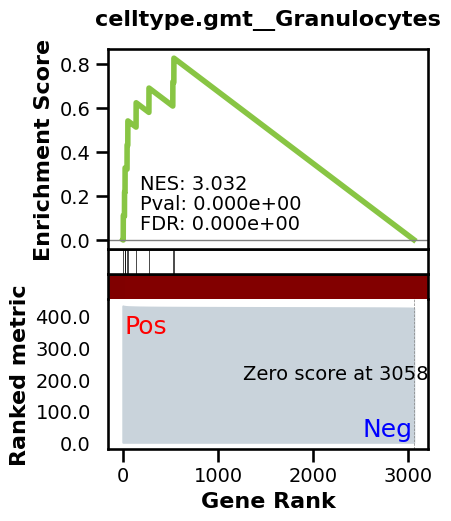

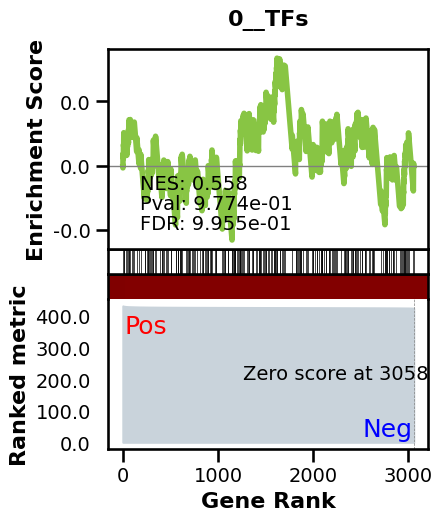

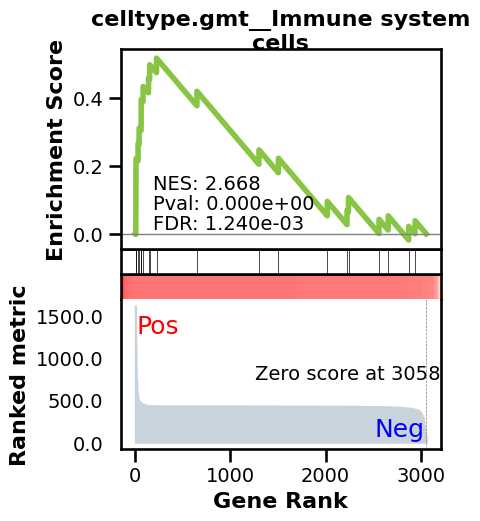

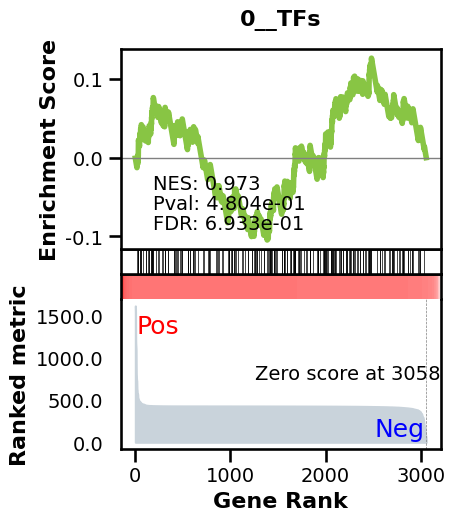

_________________________________________
TF specific enrichment


2024-05-08 15:44:49,650:INFO - Downloading and generating Enrichr library gene sets...
2024-05-08 15:44:49,660:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-08 15:44:49,896:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  27.272727272727273 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2019 genes
intersection pct: 0.6600196142530239
precision:  0.0016063346695741618 
recall:  1.0 
random precision: 0.0016071306728792035


 95%|█████████▍| 94/99 [00:00<00:00, 141.42it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:671: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 130.33it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0028071533296986917
EPR: 5.690652538320062


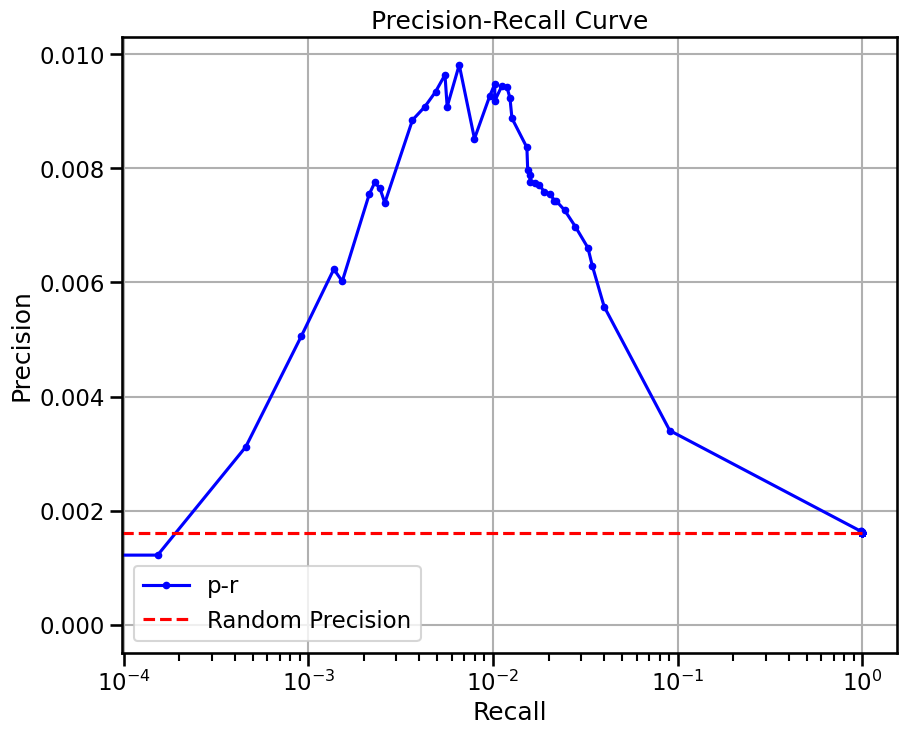

{'enriched_terms_Central': ['celltype.gmt__Spermatocytes'], 'enriched_terms_Targets': ['celltype.gmt__Granulocytes', 'celltype.gmt__Classical Monocytes', 'celltype.gmt__Immune cells', 'celltype.gmt__Intermediate monocytes', 'celltype.gmt__Neutrophils', 'celltype.gmt__Immune system cells', 'celltype.gmt__Non-classical monocytes', 'celltype.gmt__Langerhans cells', 'celltype.gmt__Lymphatic Endothelial cells', 'celltype.gmt__Naive CD4+ T cells', 'celltype.gmt__Memory CD4+ T cells', 'celltype.gmt__CD4+ NKT-like cells', 'celltype.gmt__CD8+ NKT-like cells', 'celltype.gmt__HSC/MPP cells', 'celltype.gmt__Memory CD8+ T cells', 'celltype.gmt__Naive CD8+ T cells', 'celltype.gmt__Effector CD4+ T cells', 'celltype.gmt__-T cells'], 'enriched_terms_Regulators': ['celltype.gmt__Immune system cells', 'celltype.gmt__Classical Monocytes', 'celltype.gmt__CD4+ NKT-like cells', 'celltype.gmt__CD8+ NKT-like cells', 'celltype.gmt__Microglial cells', 'celltype.gmt__Non-classical monocytes', 'celltype.gmt__Naive

In [10]:
metrics = {}
for celltype in elem[1:]:
    print("now with classifier")
    grn_inferer = GRNfer(model, adata[adata.X.sum(1)>500],
        how="most var across",
        preprocess="softmax",
        head_agg='none',
        filtration="none",
        forward_mode="none",
        organisms=adata.obs['organism_ontology_term_id'][0],
        apc=False,
        symmetrize=False,
        num_genes=6000,
        max_cells=1024,
        doplot=False,
        batch_size=32,
    )
    print("scprint\n")
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn, m = train_classifier(grn, C=0.1, train_size=0.3, class_weight={1: 100, 0: 1}, shuffle=False)
    grn.varp['GRN'] = grn.varp['classified']
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    print(m)
    m = BenGRN(grn).scprint_benchmark()
    print(m)    
    metrics[celltype+'_scprint_class'] = m

genie3_tf

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 299.18 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


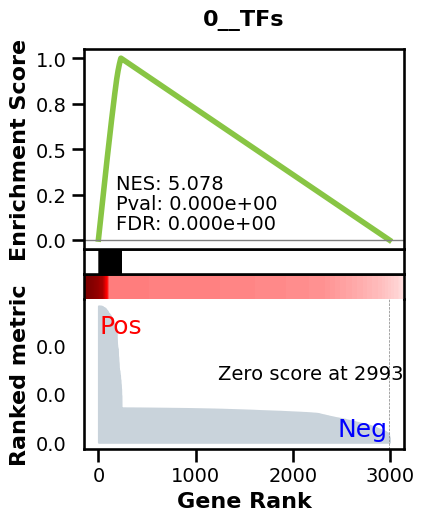

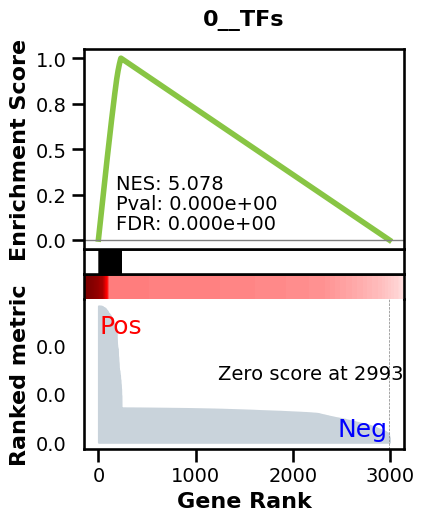

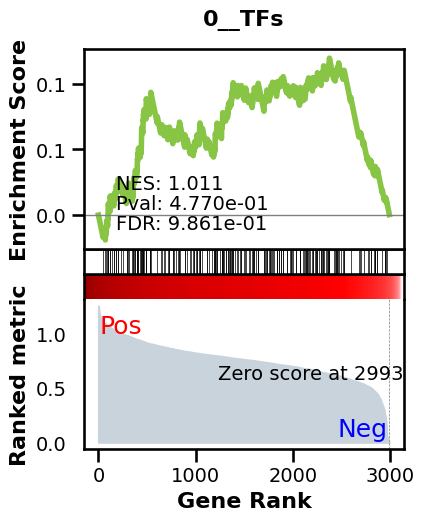

_________________________________________
TF specific enrichment


2024-05-08 16:49:16,193:INFO - Downloading and generating Enrichr library gene sets...
2024-05-08 16:49:16,204:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-08 16:49:16,423:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2016 genes
intersection pct: 0.6733466933867736
precision:  0.011089854476897061 
recall:  0.6103300733496333 
random precision: 0.0016109338689983851


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:665: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
 38%|███▊      | 38/99 [00:00<00:00, 128.66it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:671: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 132.70it/s]


Area Under Precision-Recall Curve (AUPRC):  0.01184363326784533
EPR: 8.051032733134008


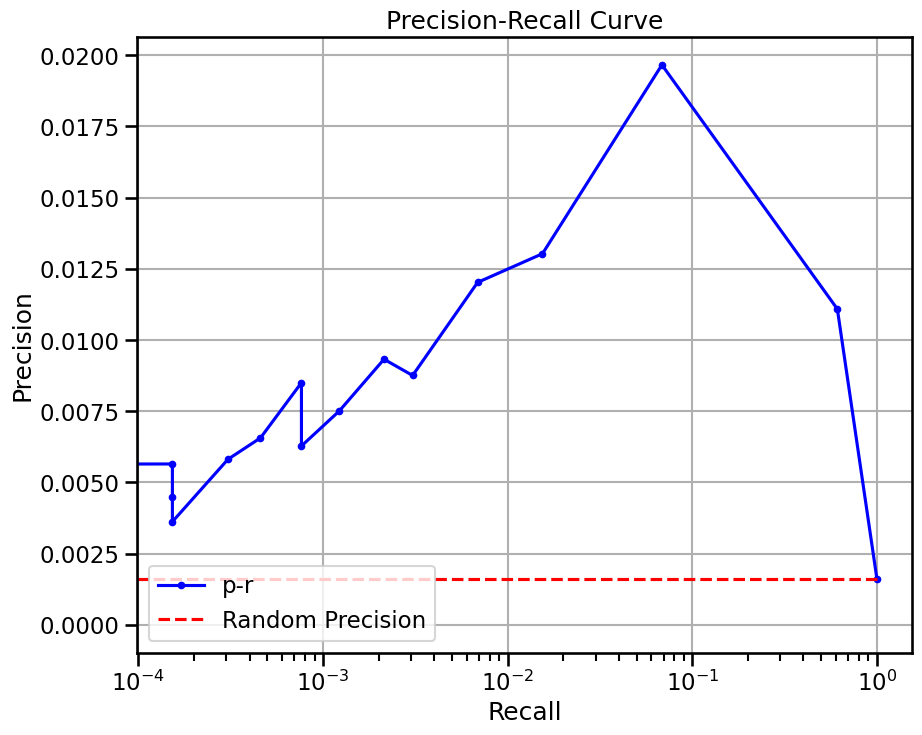

{'enriched_terms_Central': ['0__TFs', 'celltype.gmt__Embryonic stem cells'], 'significant_enriched_TFtargets': 0.0, 'precision': 0.011089854476897061, 'recall': 0.6103300733496333, 'rand_precision': 0.0016109338689983851, 'auprc': 0.01184363326784533, 'EPR': 8.051032733134008}
genie3

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 744.93 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


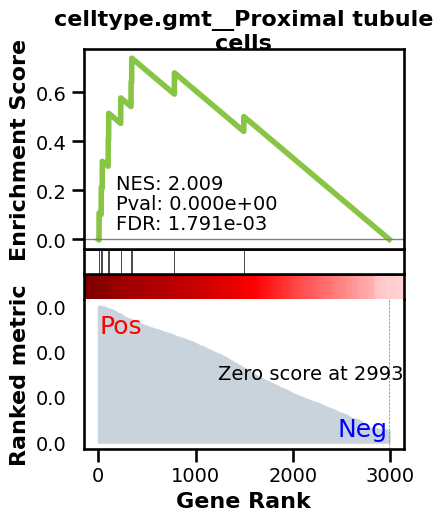

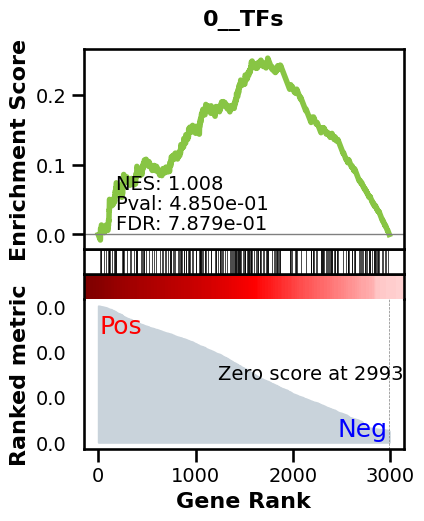

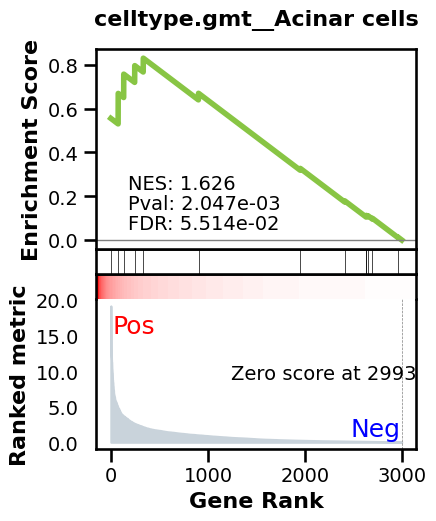

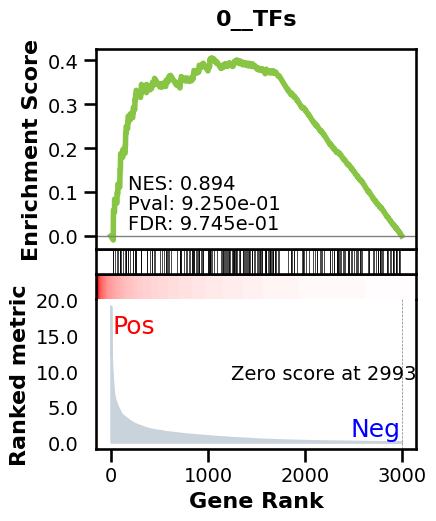

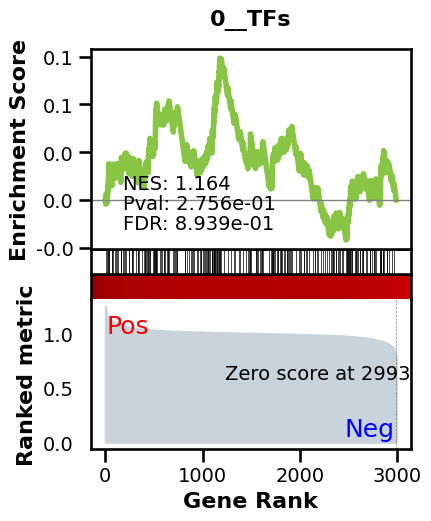

_________________________________________
TF specific enrichment


2024-05-08 17:02:12,449:INFO - Downloading and generating Enrichr library gene sets...
2024-05-08 17:02:12,460:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-08 17:02:12,678:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2016 genes
intersection pct: 0.6733466933867736
precision:  0.0023108295796268894 
recall:  0.5603606356968215 
random precision: 0.0016109338689983851


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:665: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 40%|████      | 40/99 [00:00<00:00, 135.60it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:671: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 138.59it/s]


Area Under Precision-Recall Curve (AUPRC):  0.002035757171920016
EPR: 0.2839208968275351


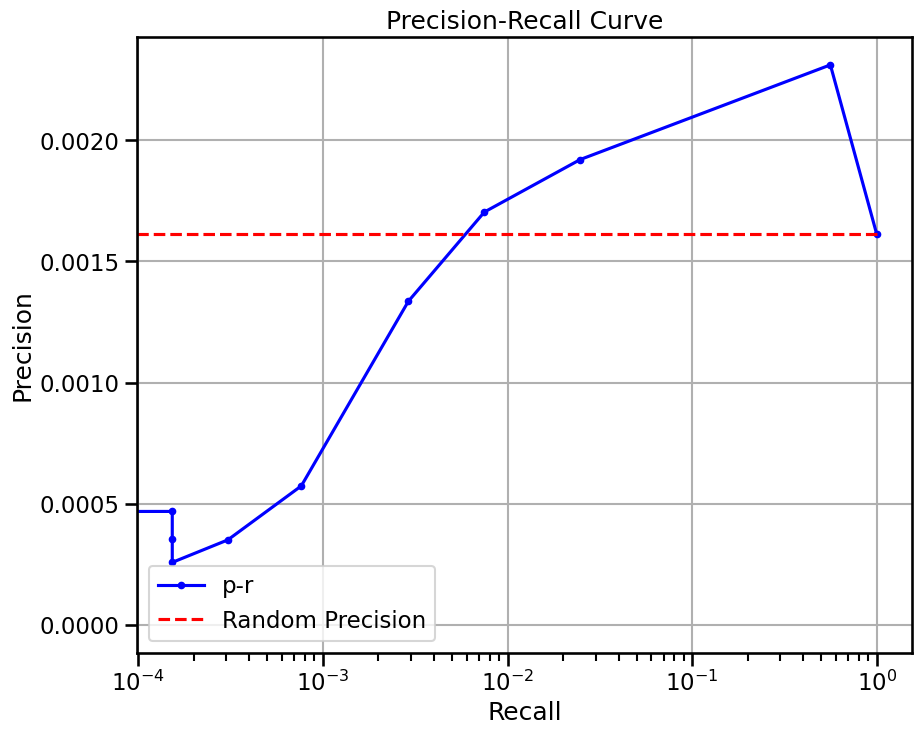

{'enriched_terms_Central': ['celltype.gmt__Proximal tubule cells', 'celltype.gmt__Smooth muscle cells', 'celltype.gmt__Endothelial', 'celltype.gmt__Renal interstitium (Mesenchymal cells)', 'celltype.gmt__Acinar cells', 'celltype.gmt__Langerhans cells', 'celltype.gmt__Mesangial cells', 'celltype.gmt__Mesenchymal stem cells', 'celltype.gmt__Progenitor cells'], 'enriched_terms_Targets': ['celltype.gmt__Acinar cells'], 'significant_enriched_TFtargets': 0.0, 'precision': 0.0023108295796268894, 'recall': 0.5603606356968215, 'rand_precision': 0.0016109338689983851, 'auprc': 0.002035757171920016, 'EPR': 0.2839208968275351}
__________________________________

__________________________________


In [30]:
subadata = adata[adata.obs.cell_type==celltype, adata.var.index.isin(grn_inferer.curr_genes)]
print("genie3_tf\n")
grn = compute_genie3(subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
m = BenGRN(grn).scprint_benchmark()
metrics[celltype+'_genie3_tf_mostvar'] = m
print(m)
print("genie3\n")
grn = compute_genie3(subadata, nthreads=32)
m = BenGRN(grn).scprint_benchmark()
metrics[celltype+'_genie3_mostvar'] = m
print(m)
print("__________________________________")

## if you subset the learnt GRN to only TF 

In [33]:
adj = grn.get(grn.var[grn.var.isTF].index.tolist()).targets

In [34]:
adj.shape

(232, 3059)

In [15]:
from bengrn import get_GT_db

In [17]:
gt = get_GT_db("omnipath")
#gt = gt[gt.type != "post_translational"]
varnames = set(gt.iloc[:, :2].values.flatten())
ind = list(set(gt.iloc[:, 0].values))
col = list(set(gt.iloc[:, 1].values))
da = np.zeros((len(ind),len(col)), dtype=np.float)

adj = adj.loc[adj.index.isin(ind)].loc[:, adj.columns.isin(col)]
mind = set(adj.index)
mcol = set(adj.columns)
for i, j in gt.iloc[:, :2].values:
    if i in mind and j in mcol:
        da[ind.index(i), col.index(j)] = 1
da = pd.DataFrame(da, index=ind, columns=col)
da = da.loc[adj.index].loc[:,adj.columns]

/tmp/ipykernel_518723/2881883798.py:6: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(ind),len(col)), dtype=np.float)


KeyError: "['ZNF200', 'DPF1', 'SOX30', 'EBF4', 'SNAPC2', 'POU2AF1', 'ZNF541', 'ZNF430', 'ZNF831', 'ZNF835', 'THAP10', 'ZBTB46', 'GCM1', 'ZNF365', 'ZNF710', 'ZNF473', 'SCML4', 'ZNF182', 'ZNF214', 'ZNF117', 'L3MBTL4', 'ZNF222', 'ZNF221', 'GBX1', 'TIGD4', 'ZBTB26', 'BNC2', 'TIGD3', 'ZNF80', 'ZNF654', 'CENPS', 'ZNF519', 'ZNF683', 'FOXR1', 'ZNF575', 'ZBED2', 'ZNF114', 'ZNF366', 'ZNF454', 'ZNF572', 'ZNF804B', 'TSHZ2', 'TBPL2', 'ZNF623', 'ZNF438', 'ZNF730', 'ZNF93', 'SP140L', 'DBX2', 'ZNF696', 'ARGFX', 'ZNF501', 'RFX8', 'ZNF705A', 'ZNF100', 'ZNF695', 'ZNF813', 'ZNF534', 'DPRX', 'DPF3', 'ZNF888', 'ZNF845', 'LEUTX', 'SKOR2', 'ANHX', 'ZNF853', 'ZNF625'] not in index"

In [27]:
from bengrn import compute_pr

precision:  0.013217343778466024 
recall:  1.0 
random precision: 0.013223969013442697


 66%|██████▌   | 65/99 [00:00<00:00, 643.83it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:671: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 639.18it/s]

Area Under Precision-Recall Curve (AUPRC):  0.01795953632691536
EPR: 2.471103913347184


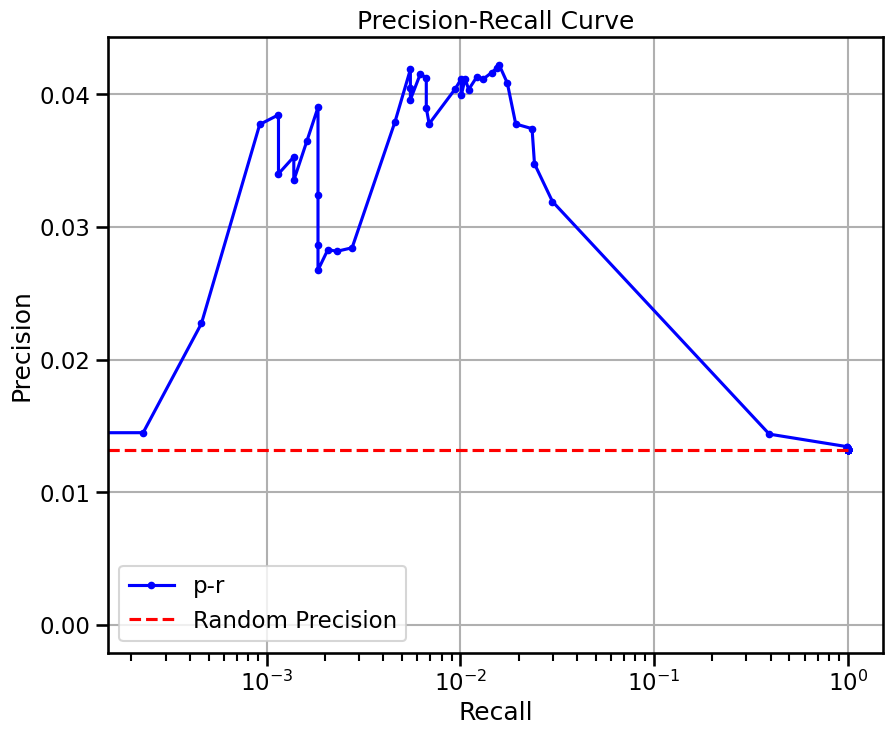

{'precision': 0.013217343778466024,
 'recall': 1.0,
 'rand_precision': 0.013223969013442697,
 'auprc': 0.01795953632691536,
 'EPR': 2.471103913347184}

In [29]:
compute_pr(adj.values, da.values)